In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Import Statsmodels
from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic

from pyFTS.benchmarks import Measures
from pyFTS.benchmarks import Measures
from pyFTS.common import Util
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
import math
import statistics
from sklearn.preprocessing import StandardScaler

import sys
sys.path.append("/home/hugo/projetos-doutorado/mimo_emb_fts/src/")

from embfts.util.DataSetUtil import DataSetUtil
from embfts.util.StatisticsUtil import StatisticsUtil

In [2]:
data_set_util = DataSetUtil()
statistics_util = StatisticsUtil()

### Dataset

In [3]:
df = pd.read_csv('/home/hugo/projetos-doutorado/mimo_emb_fts/data/ethylene_methane.csv', sep=',')
df = df.loc[0: : 60]
df = df.drop(labels=['Time (seconds)'], axis=1)
data = data_set_util.clean_dataset(df)
data = data_set_util.series_to_supervised_mimo(data, 1, 1)
#data = data.diff().dropna()
data.head()

,CO conc (ppm)(t-1),Ethylene conc (ppm)(t-1),TGS2602(t-1),TGS2602.1(t-1),TGS2600(t-1),TGS2600.1(t-1),TGS2610(t-1),TGS2610.1(t-1),TGS2620(t-1),TGS2620.1(t-1),...,TGS2620(t),TGS2620.1(t),TGS2602.2(t),TGS2602.3(t),TGS2600.2(t),TGS2600.3(t),TGS2610.2(t),TGS2610.3(t),TGS2620.2(t),TGS2620.3(t)
60,0.0,0.0,-50.85,-1.95,-41.82,1.30,-4.07,-28.73,-13.49,-3.25,...,-10.73,-0.81,22542.37,21791.37,5706.32,5806.53,11000.82,9895.08,4255.55,3863.13
120,0.0,0.0,-52.14,6.68,-27.27,7.17,-6.18,-33.25,-10.73,-0.81,...,-6.99,2.93,7708.09,9138.99,3831.30,3946.52,6235.93,5794.75,2760.12,2515.53
180,0.0,0.0,-28.73,53.51,-25.00,15.81,1.47,-2.77,-6.99,2.93,...,-2.12,11.41,3588.41,4628.57,2780.83,2845.23,4037.65,3850.63,1945.41,1753.00
240,0.0,0.0,32.17,186.52,-24.52,17.12,22.35,5.70,-2.12,11.41,...,15.98,27.09,2167.30,2869.98,2116.91,2171.88,2876.99,2832.08,1466.54,1308.25
300,0.0,0.0,135.77,415.68,-12.35,30.20,64.38,69.32,15.98,27.09,...,43.65,57.46,1531.53,2028.66,1687.94,1733.92,2235.14,2237.82,1143.56,1031.91


In [4]:
data_train = data.loc[:,' CO conc (ppm)(t-1)':'TGS2620.3(t-1)']
data_test = data.loc[:,' CO conc (ppm)(t)':'TGS2620.3(t)']

Xtrain = data_set_util.sample_first_prows(data_train,0.75)
ytrain = data_set_util.sample_first_prows(data_test,0.75)

Xtest = data_train.iloc[max(Xtrain.index):]
ytest = data_test.iloc[max(ytrain.index):]

## VAR 

In [8]:
def lags_v(dados, p):
  T, n = dados.shape
  X = np.zeros((T-p, n*p))
  Y = dados[p:, :]
  for i in range(p, T):
    for j in range(p):
      X[i - p, j*n:(j*n)+n] = dados[i-(p-j), : ]
  return X, Y

def var(dados, parametros):
  T, n = dados.shape
  coef, _ = parametros
  p = int(coef.shape[0]/n)
  X,_ = lags_v(dados, p)
  ret = np.zeros((T-p, n))
  for i in range(T-p):
    ret[i, :] = coef.T @ X[i, :] 
  return ret 

def ajustar_var(dados, p):
  X,Y = lags_v(dados, p)
  
  #coef = np.linalg.inv(X.T @ X) @ ( X.T @ Y )
  coef = np.linalg.pinv(X.T @ X) @ ( X.T @ Y )

  previsoes = var(dados, [coef, None])

  residuos = dados[p:, :] - previsoes

  Sigma = np.sqrt(np.cov(residuos, rowvar=False))

  return coef, Sigma


In [9]:
def sliding_window(data,n_windows,train_size,p):

    result = {
         "window": [],
         "rmse": [],
         "mape": [],
         "mae": [],
         "r2": [],
         "variable":[]
    }
    
    final_result = {
         "window": [],
         "rmse": [],
         "mape": [],
         "mae": [],
         "r2": [],
         "variable":[]
    }

    tam = len(data)
    n_windows = n_windows
    windows_length = math.floor(tam / n_windows)
    for ct, ttrain, ttest in Util.sliding_window(data, windows_length, train_size, inc=1):
        if len(ttest) > 0:
            
            print('-' * 20)
            print(f'training window {(ct)}')
            
#             Xtrain = ttrain.loc[:,'Appliances(t-1)':'Tdewpoint(t-1)']
#             ytrain = ttrain.loc[:,'Appliances(t)':'Tdewpoint(t)']
#             Xtest = ttest.loc[:,'Appliances(t-1)':'Tdewpoint(t-1)']
#             ytest = ttest.loc[:,'Appliances(t)':'Tdewpoint(t)']

            scaler = StandardScaler()
            Xtrain = scaler.fit_transform(ttrain.loc[:,' CO conc (ppm)(t-1)':'TGS2620.3(t-1)'])
            ytrain = scaler.fit_transform(ttrain.loc[:,' CO conc (ppm)(t)':'TGS2620.3(t)'])
            Xtest = scaler.transform(ttest.loc[:,' CO conc (ppm)(t-1)':'TGS2620.3(t-1)'])
            ytest = scaler.transform(ttest.loc[:,' CO conc (ppm)(t)':'TGS2620.3(t)'])
                        
            param = ajustar_var(Xtrain, p)
            forecast = var(Xtest, param)
            
            
            forecast = scaler.inverse_transform(forecast)  
            ytest_metric = ttest.loc[:,' CO conc (ppm)(t)':'TGS2620.3(t)']
            df_forecast = pd.DataFrame(forecast,columns=ytest_metric.columns)
            df_original = pd.DataFrame(ytest_metric,columns=ytest_metric.columns)
            
            
            for col in ytest_metric.columns:  
                original = df_original[col].values
                forecast = df_forecast[col].values
                original = original[p-1:len(original)-1]
#                 original = original[1:]
#                 forecast = forecast[:-1]

                
#                 fig, ax = plt.subplots(nrows=1, ncols=1, figsize=[15, 3])
#                 ax.plot(original, label='Original')
#                 ax.plot(forecast, label='Forecast')
#                 handles, labels = ax.get_legend_handles_labels()
#                 lgd = ax.legend(handles, labels, loc=2, bbox_to_anchor=(1, 1))
#                 plt.show()
                
                #print("[{0: %H:%M:%S}]".format(datetime.datetime.now()) + f" getting statistics for variable: " + col)
                mae = mean_absolute_error(original,forecast)
                r2 = r2_score(original,forecast)
                #rmse = mean_squared_error(original,forecast,squared=False)
                rmse = Measures.rmse(original,forecast)
                mape = Measures.mape(original,forecast)
                
                #nrmse = cal_nrmse(rmse, original)

                result["rmse"].append(rmse)
                #result["nrmse"].append(nrmse)
                result["mape"].append(mape)
                result["mae"].append(mae)
                result["r2"].append(r2)
                result["window"].append(ct)
                result["variable"].append(col)
                
                
        
    measures = pd.DataFrame(result)
    return measures

--------------------
training window 0


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


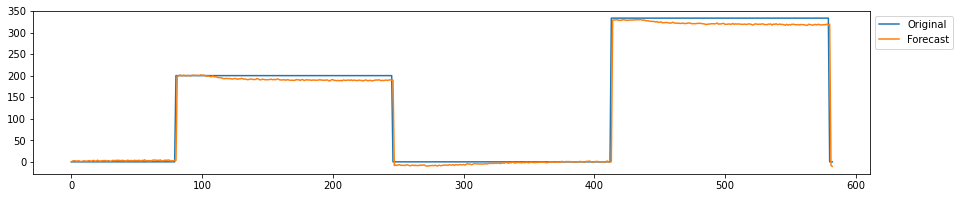

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


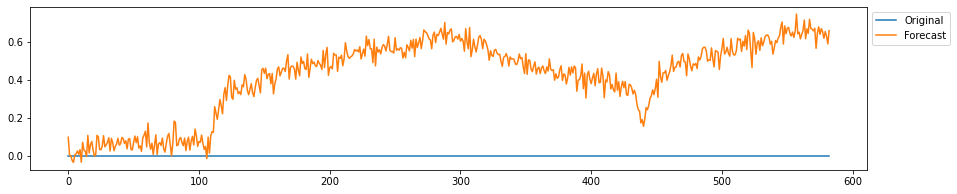

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


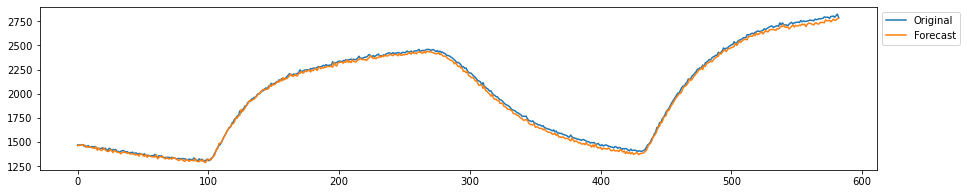

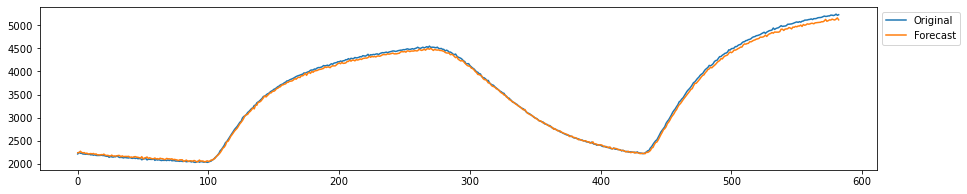

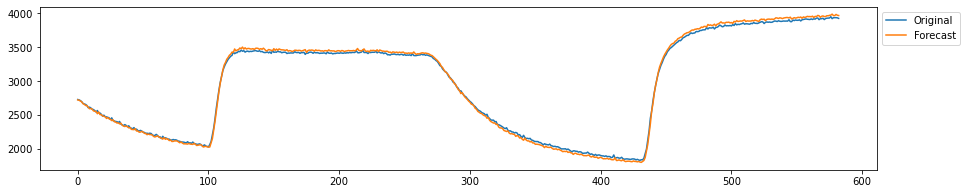

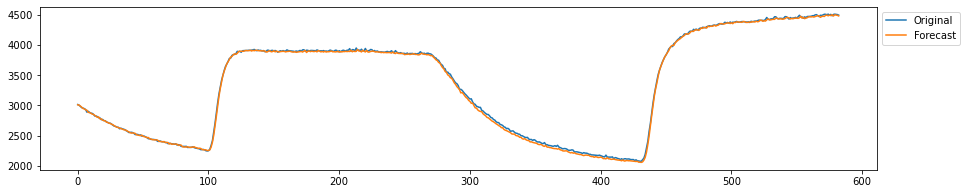

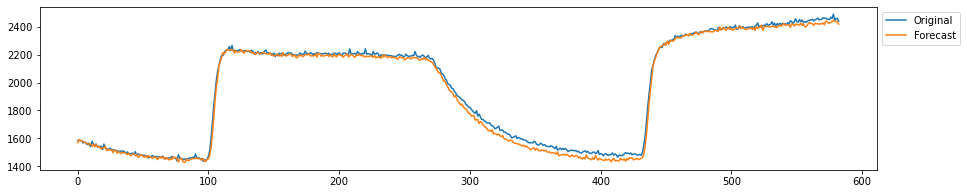

...

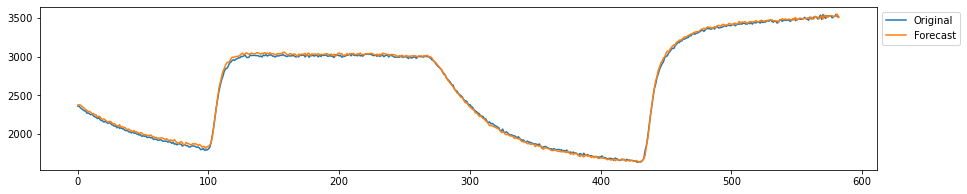

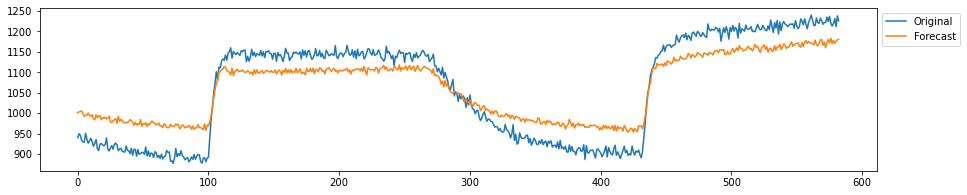

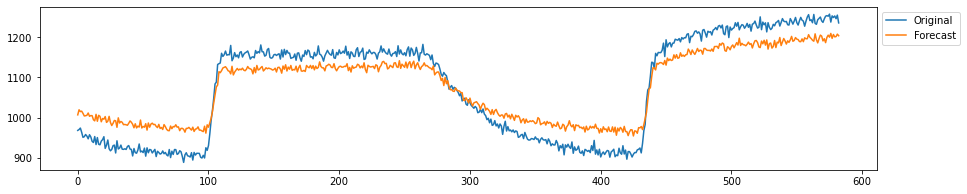

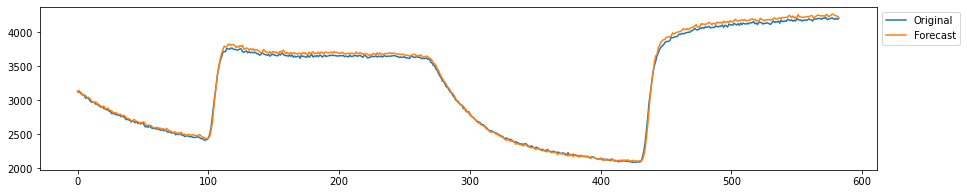

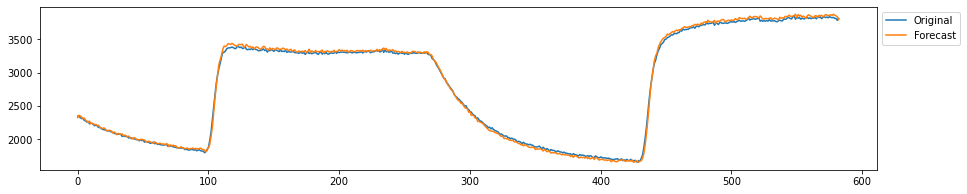

--------------------
training window 2337


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


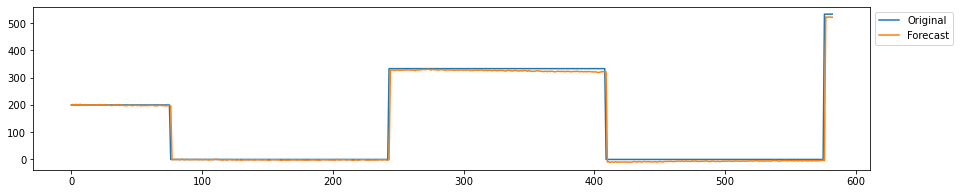

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


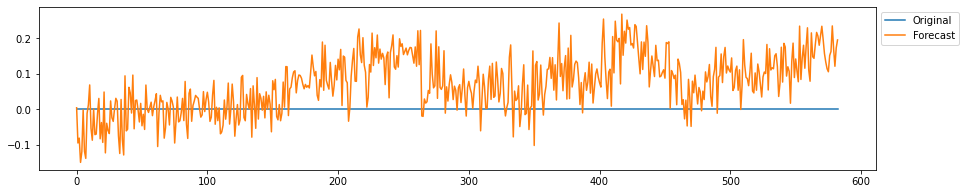

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


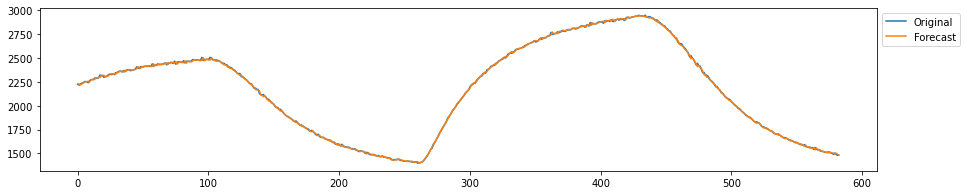

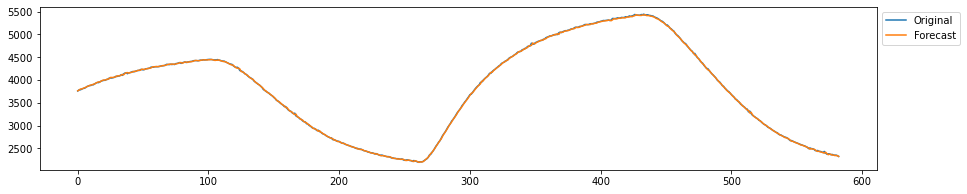

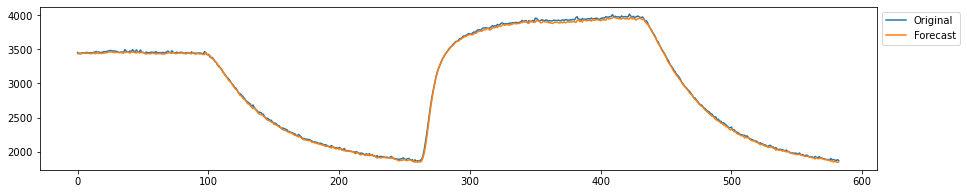

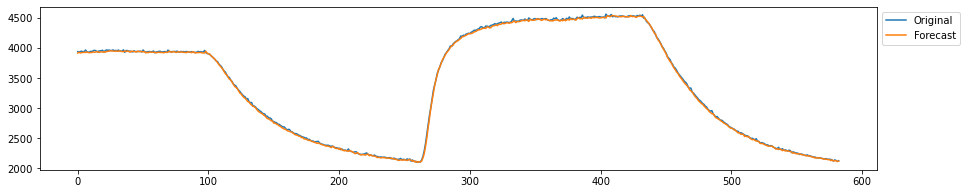

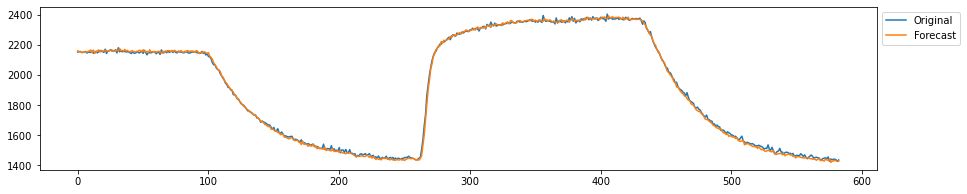

...

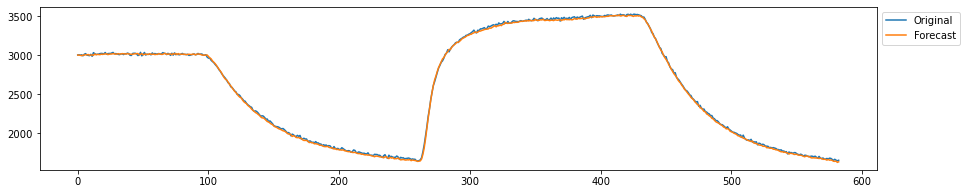

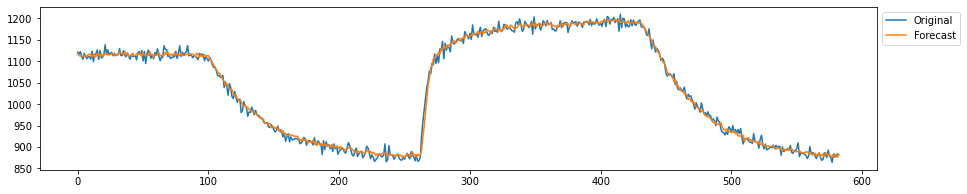

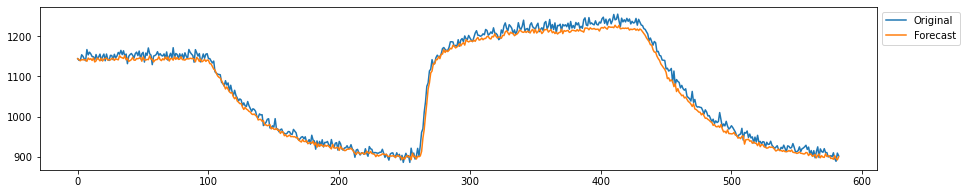

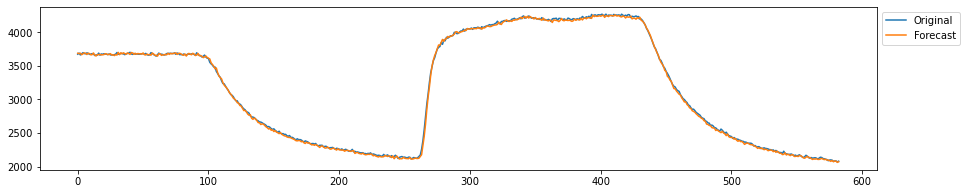

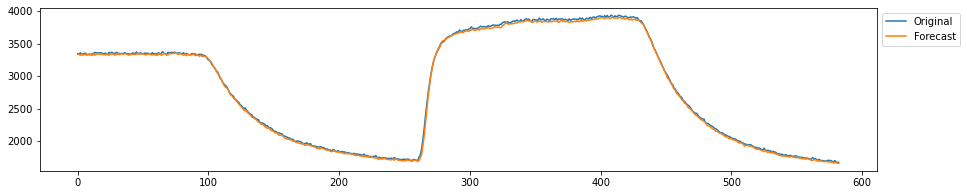

--------------------
training window 4674


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


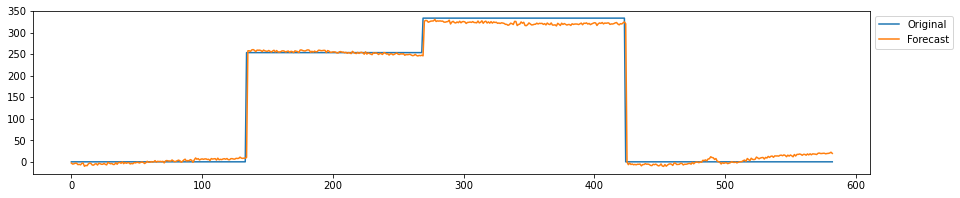

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


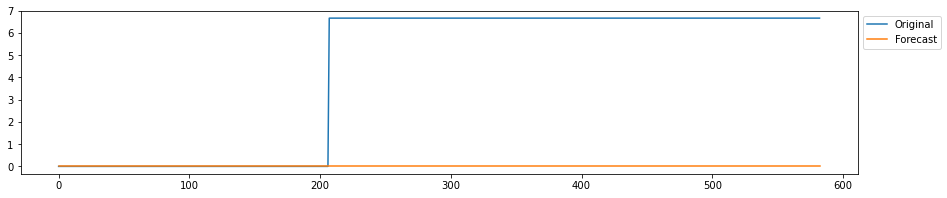

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: invalid value encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


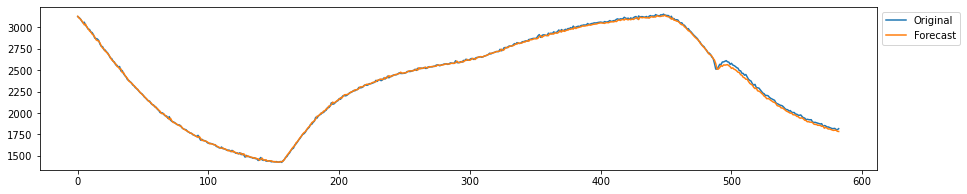

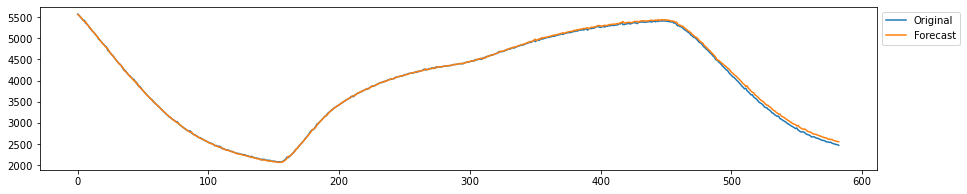

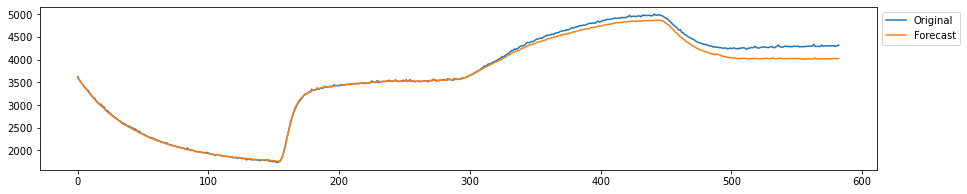

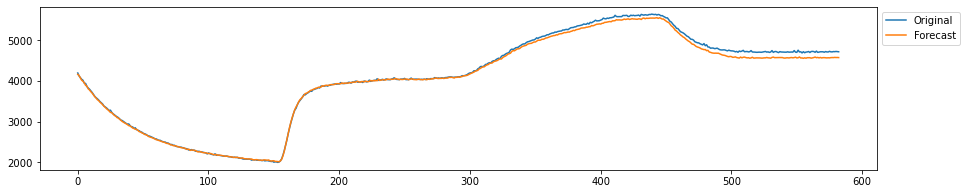

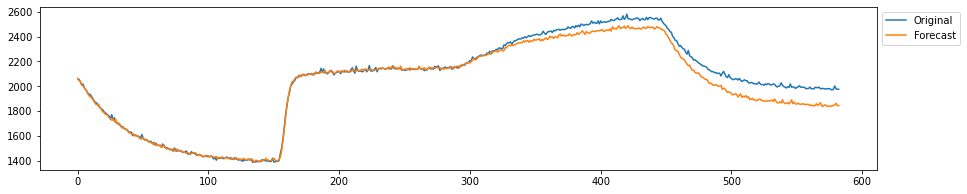

...

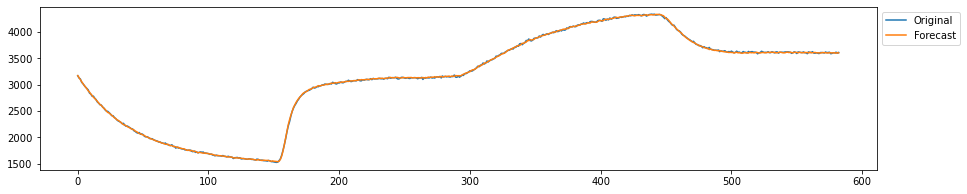

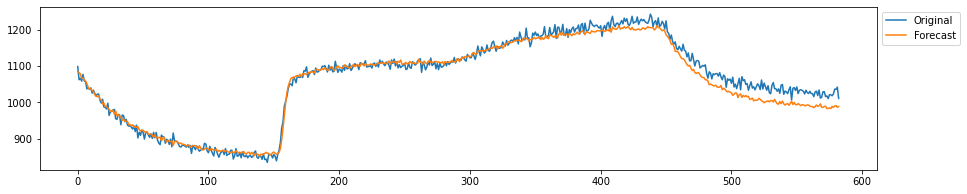

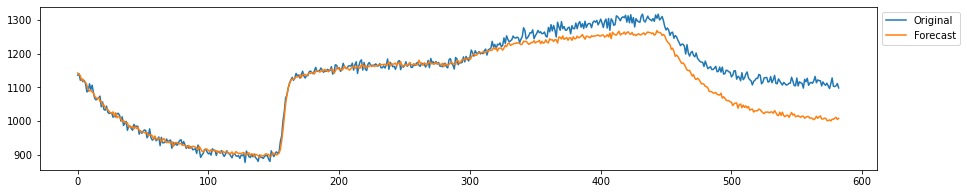

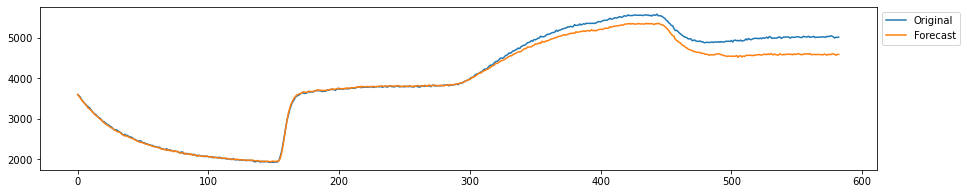

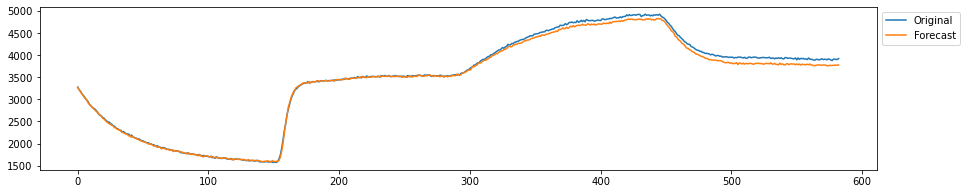

--------------------
training window 7011


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


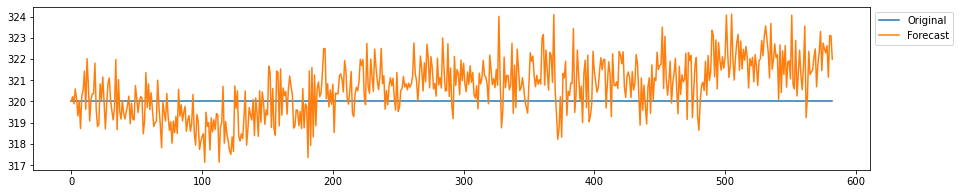

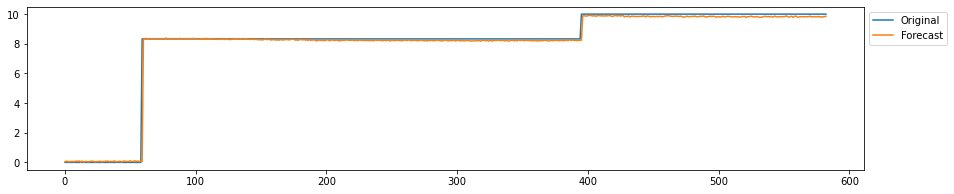

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


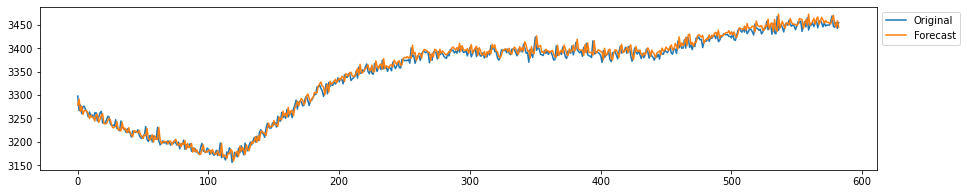

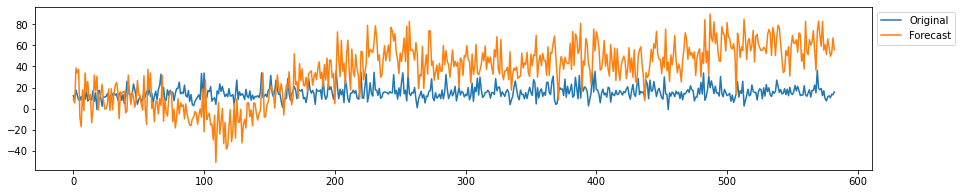

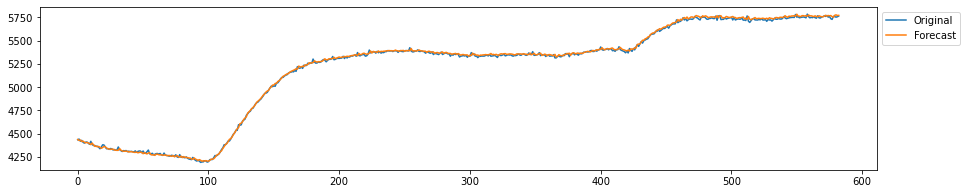

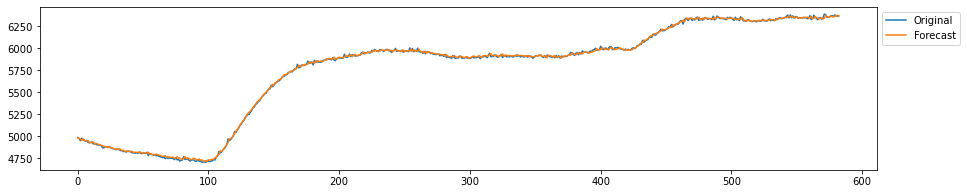

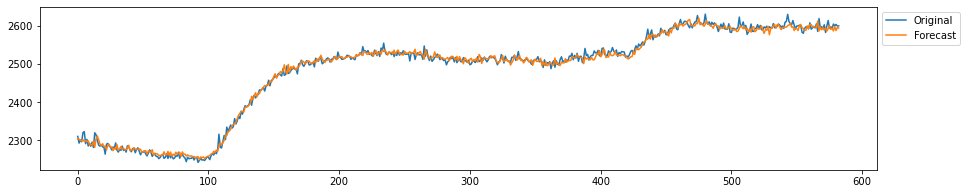

...

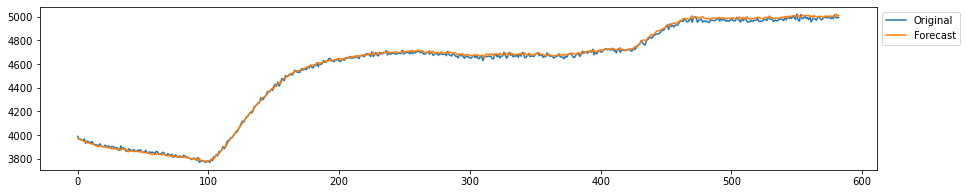

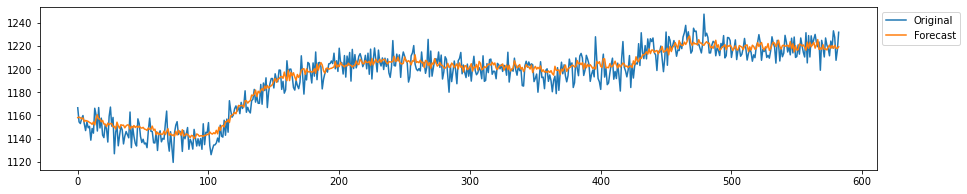

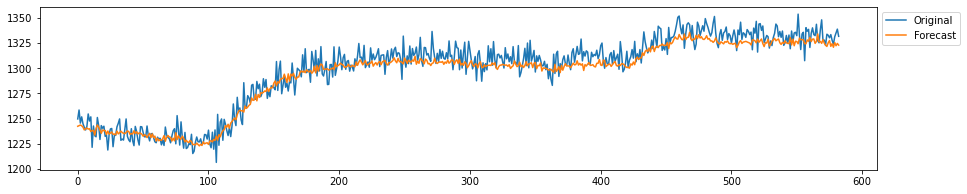

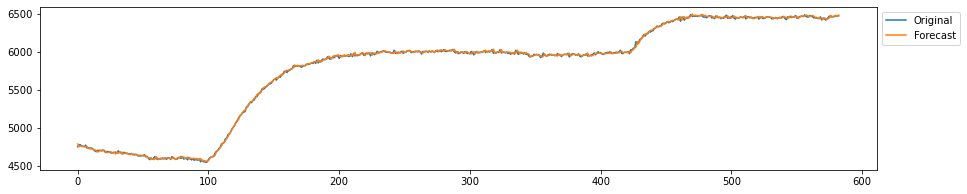

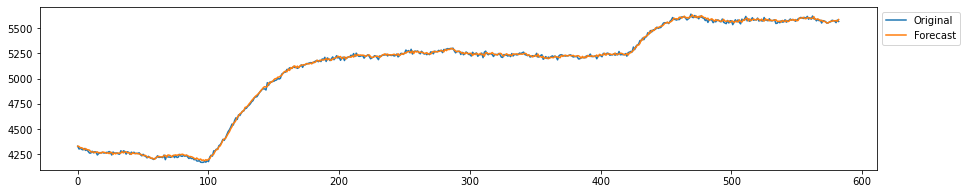

--------------------
training window 9348


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


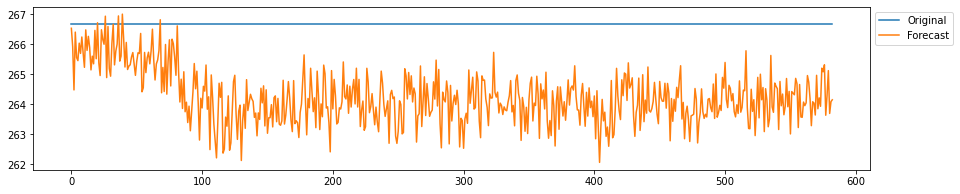

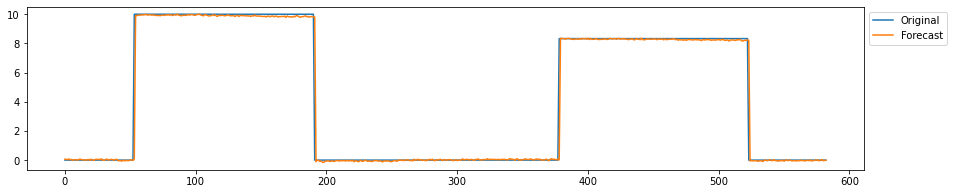

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


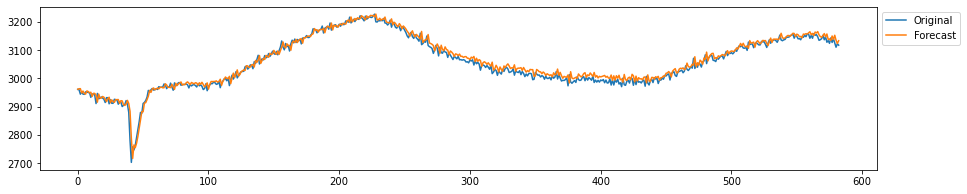

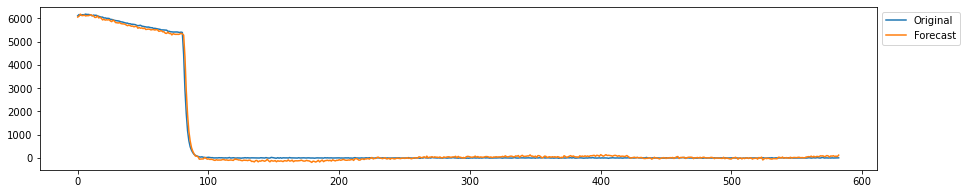

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


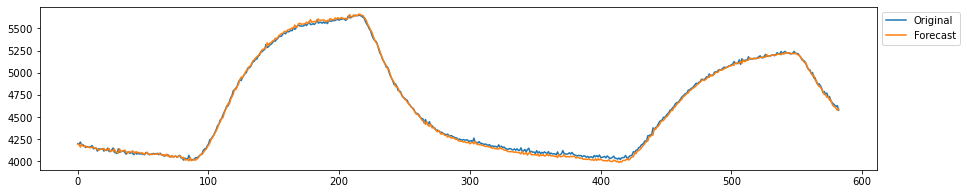

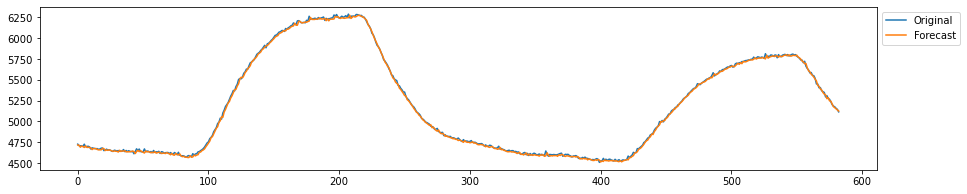

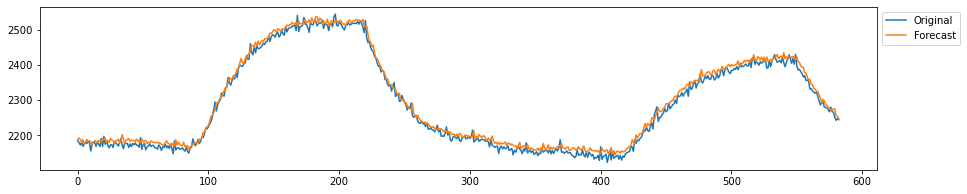

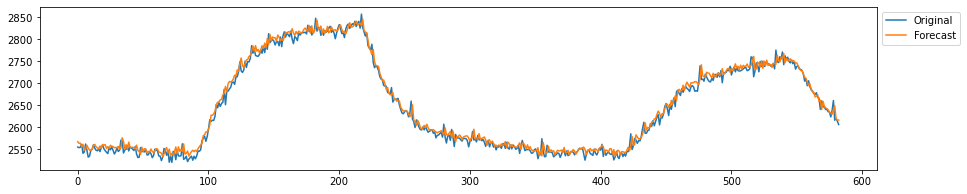

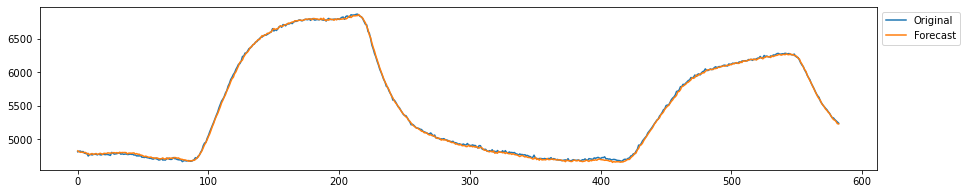

...

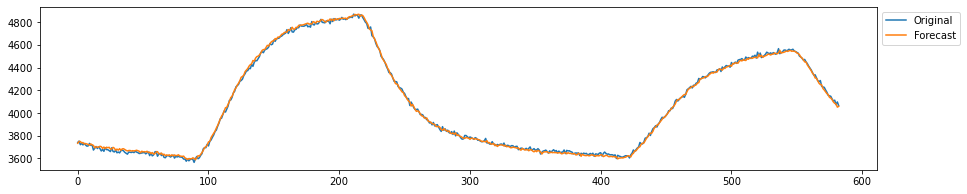

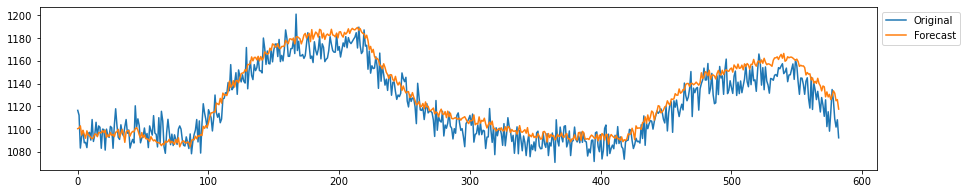

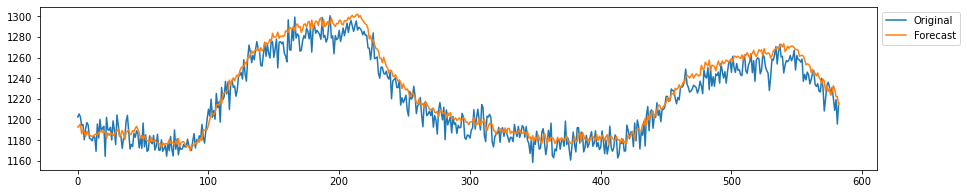

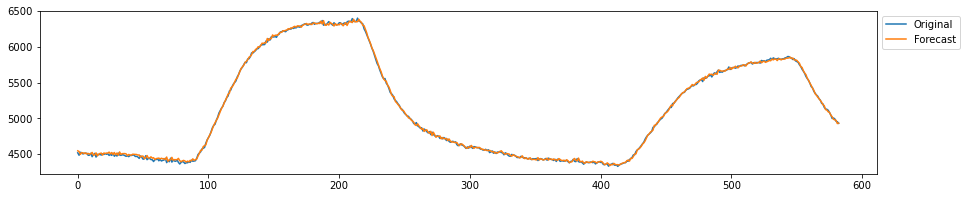

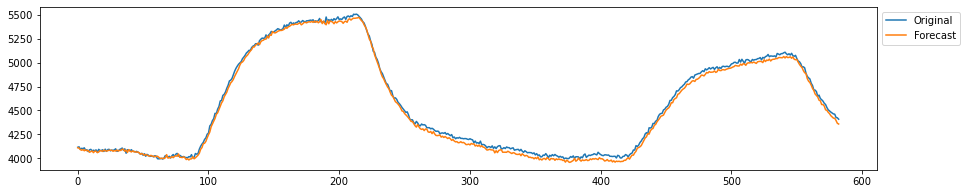

--------------------
training window 11685


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


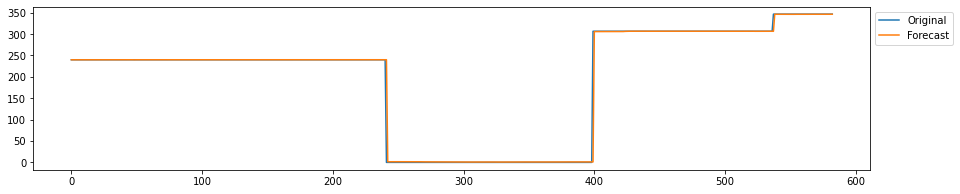

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


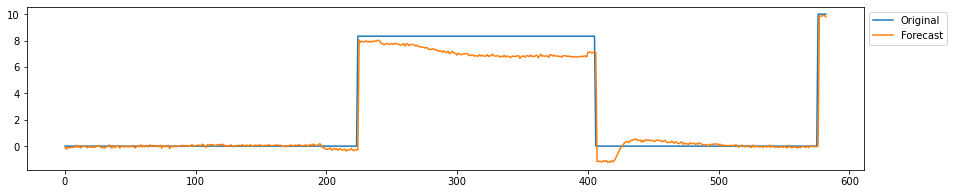

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


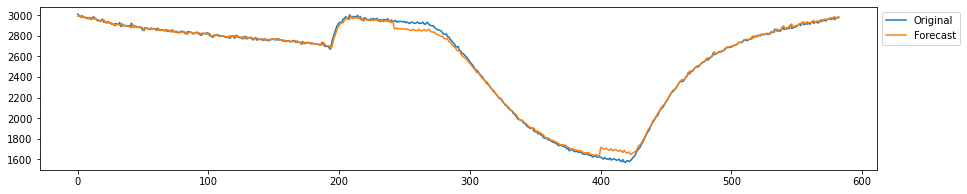

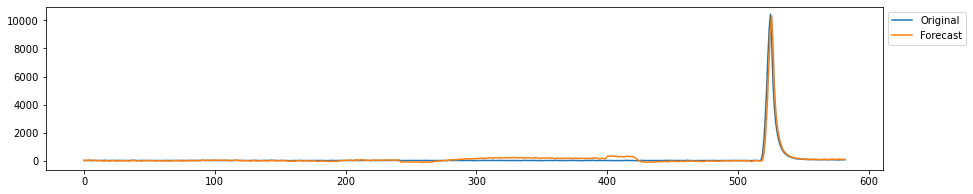

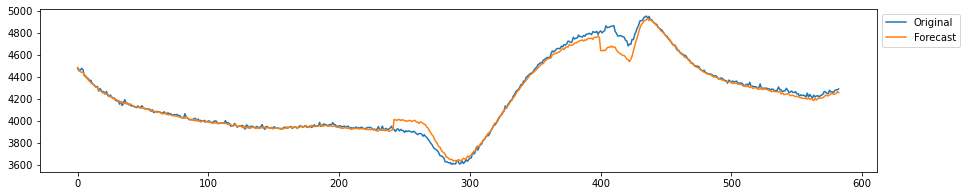

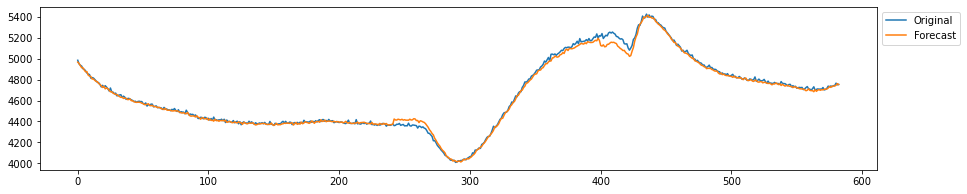

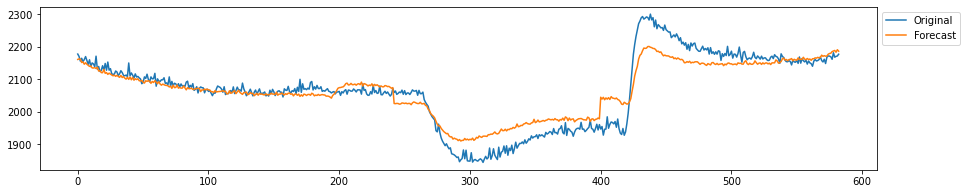

...

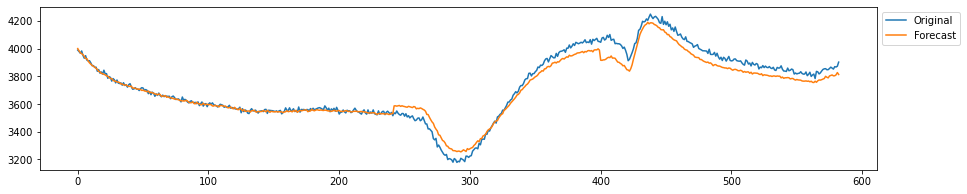

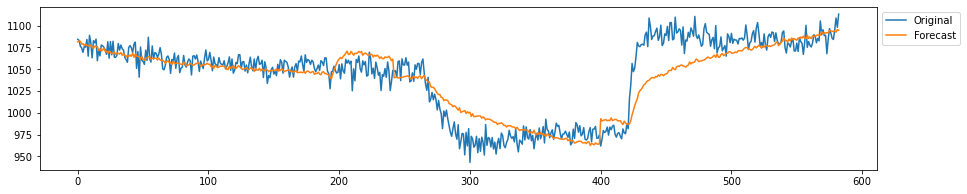

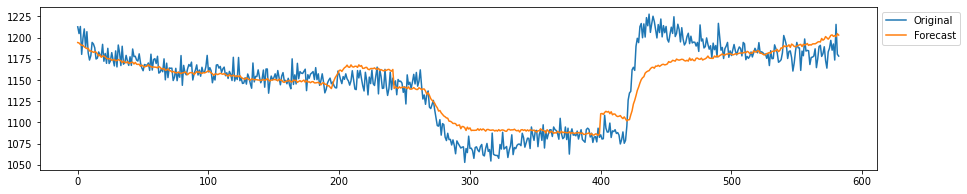

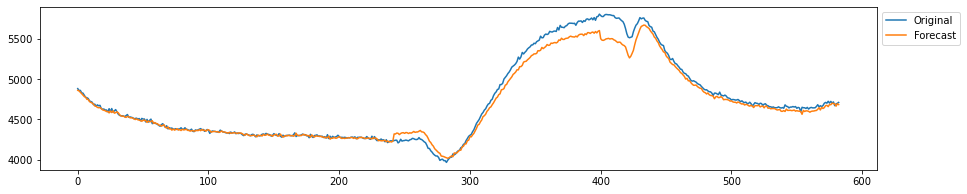

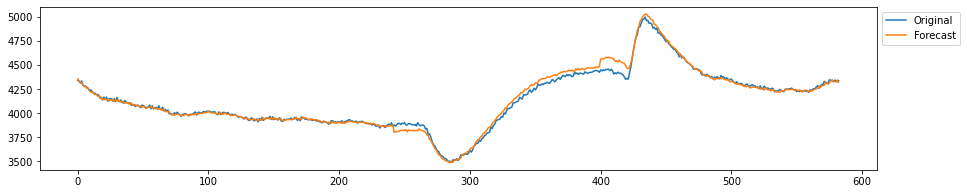

--------------------
training window 14022


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


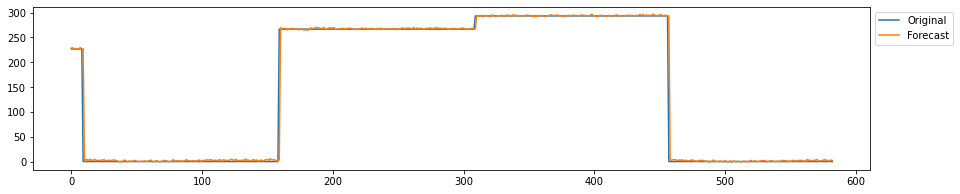

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


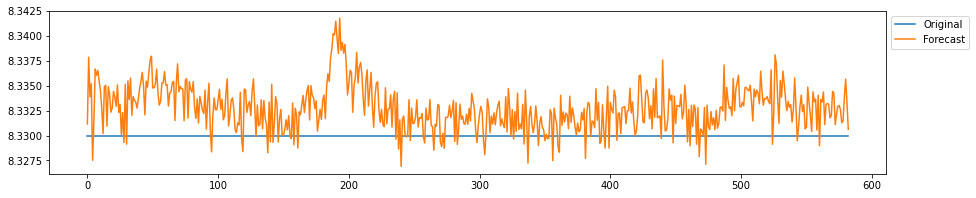

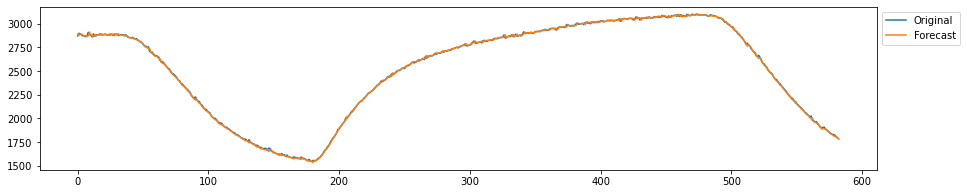

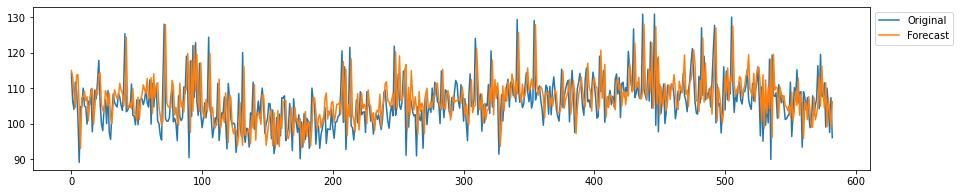

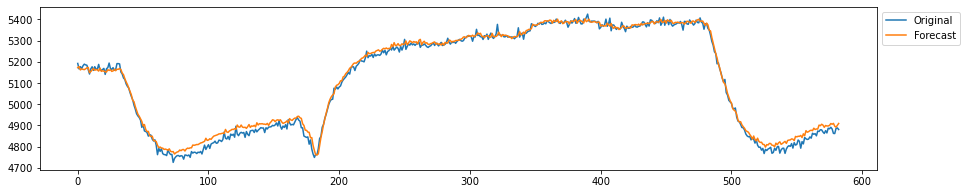

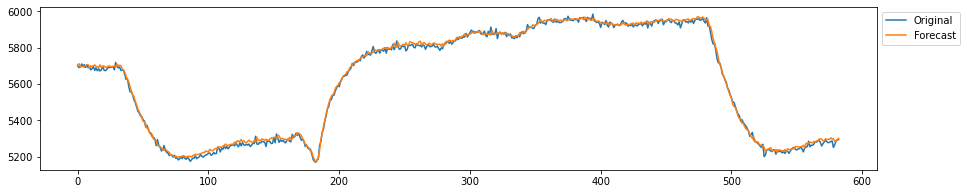

...

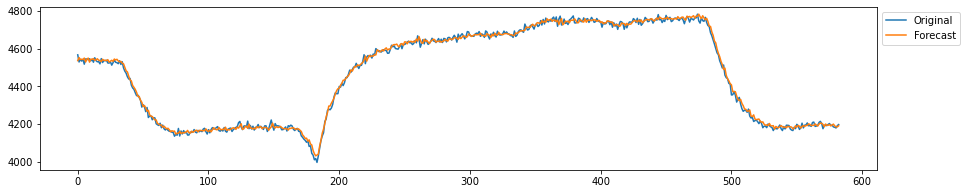

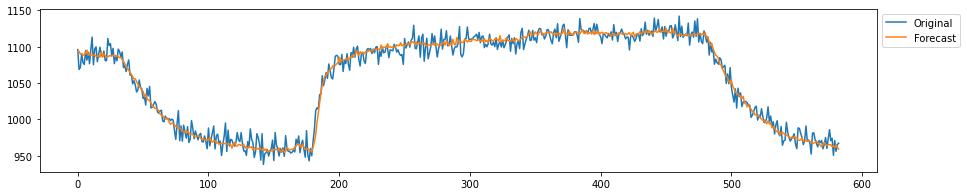

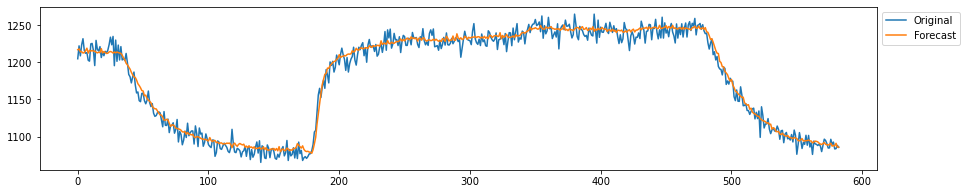

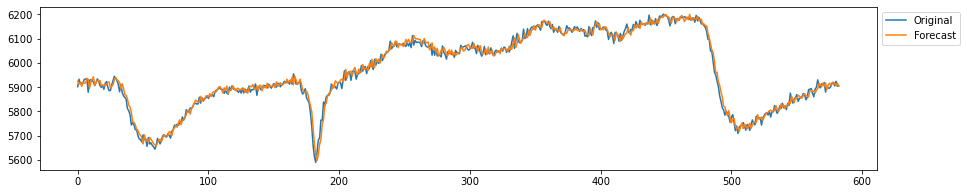

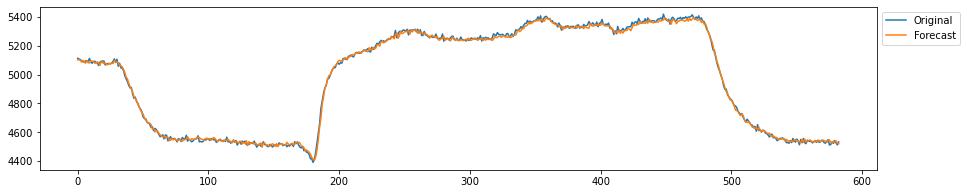

--------------------
training window 16359


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


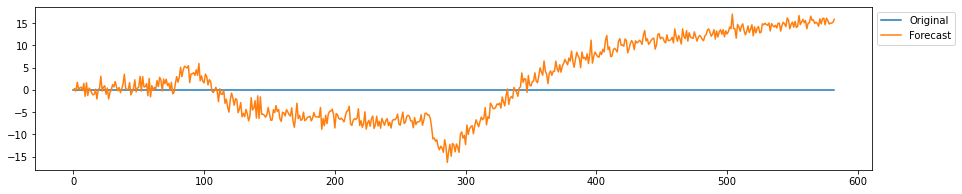

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


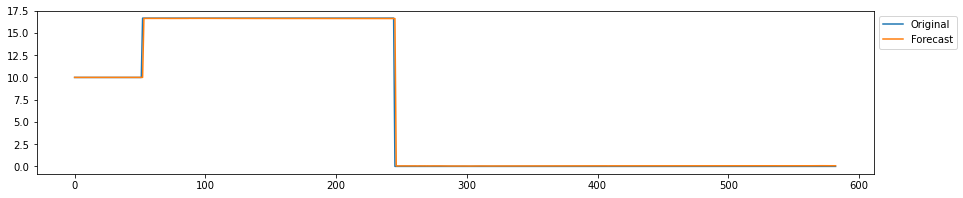

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


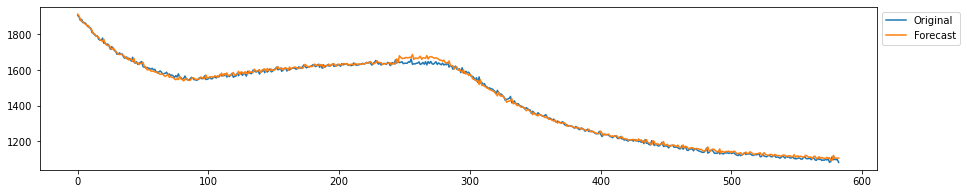

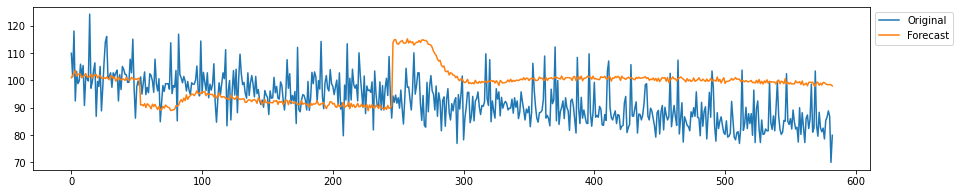

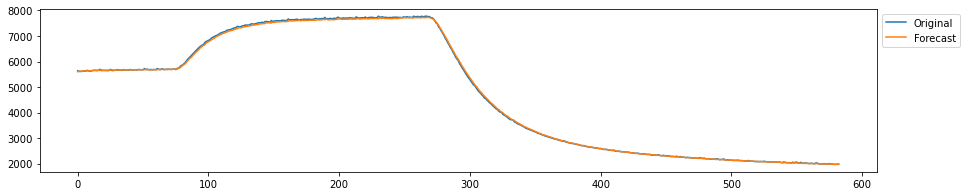

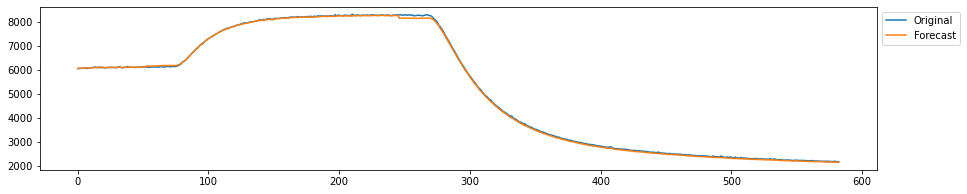

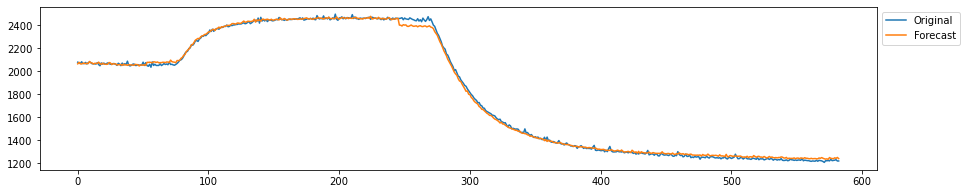

...

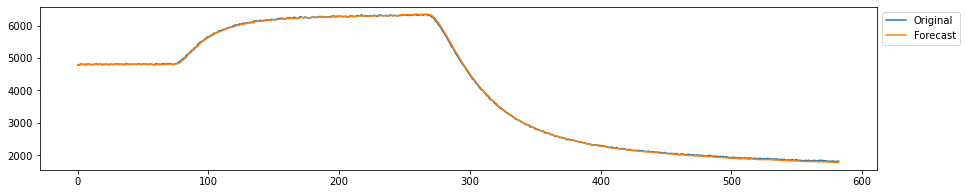

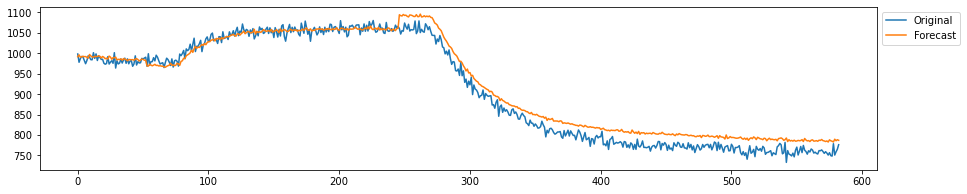

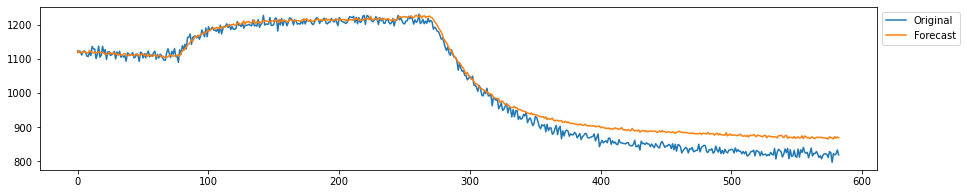

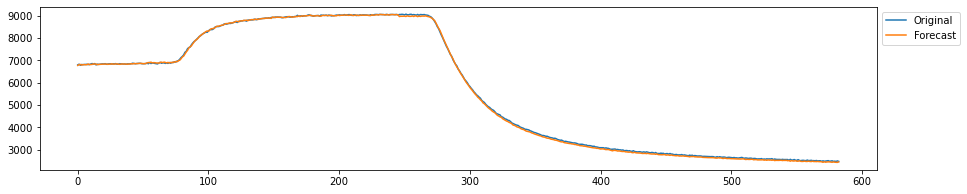

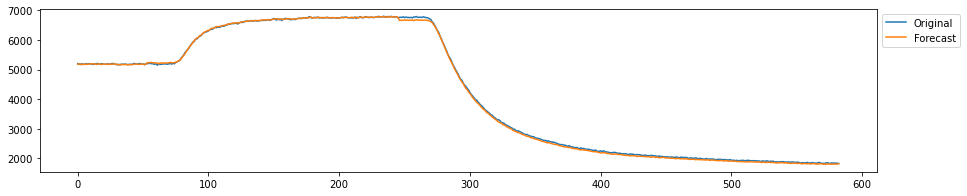

--------------------
training window 18696


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


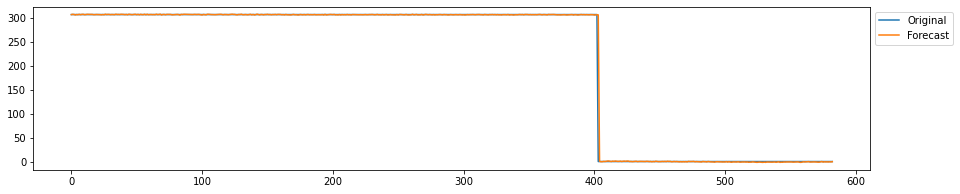

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


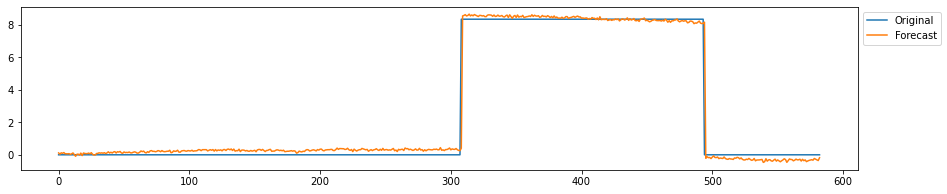

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


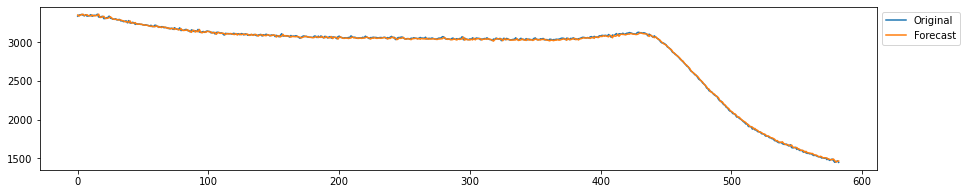

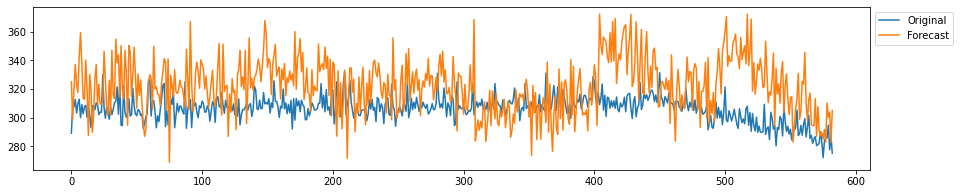

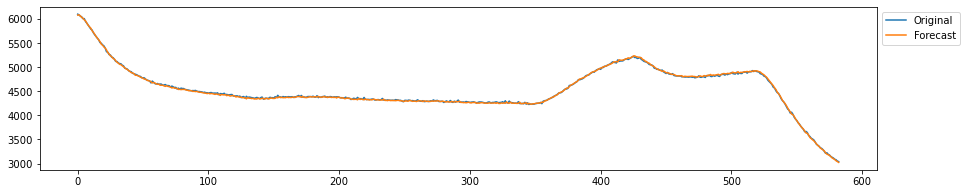

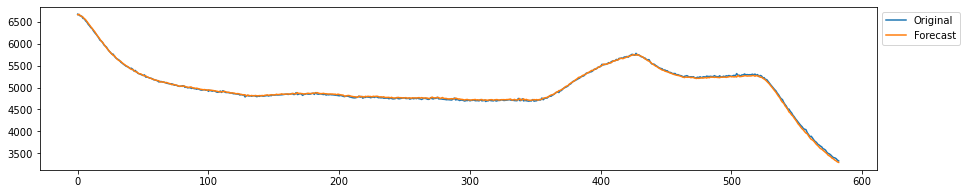

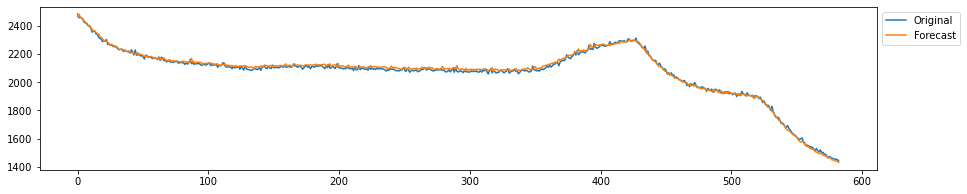

...

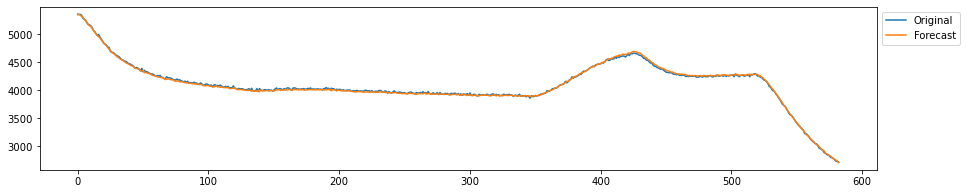

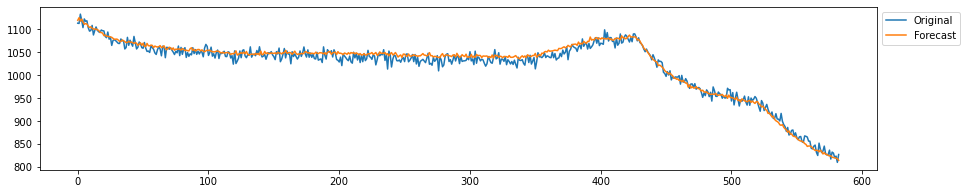

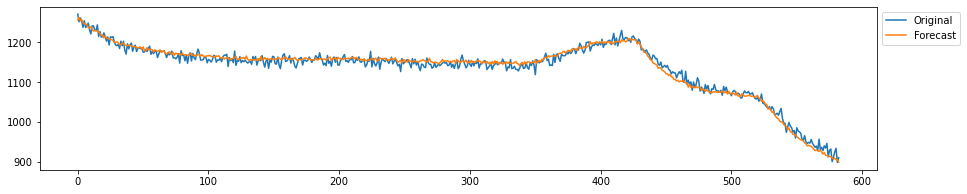

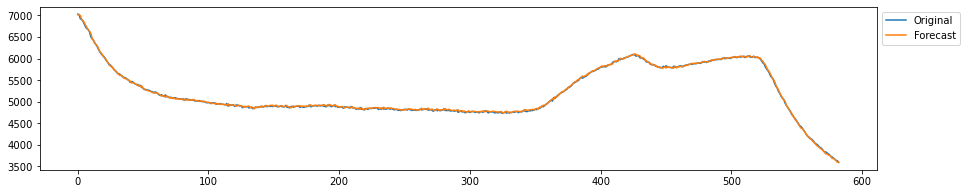

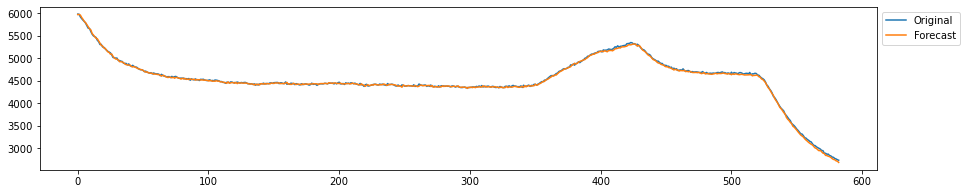

--------------------
training window 21033


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


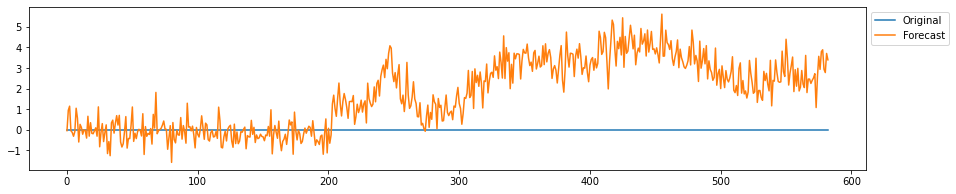

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


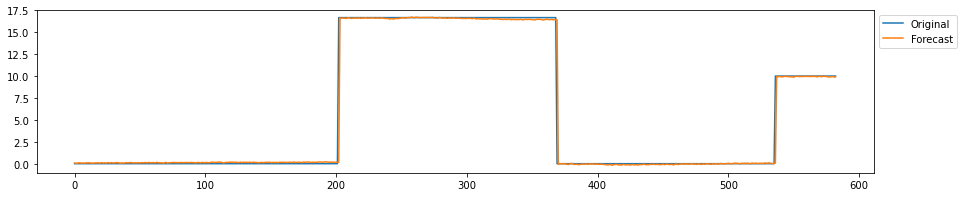

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


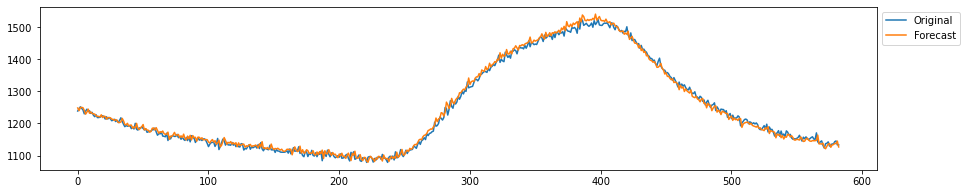

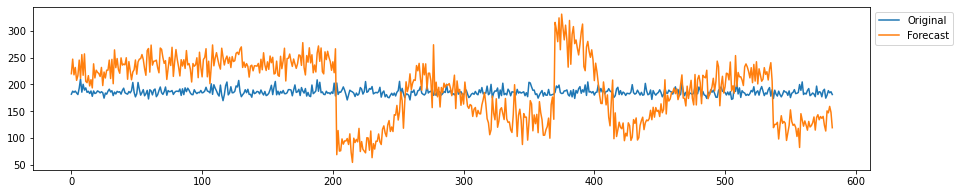

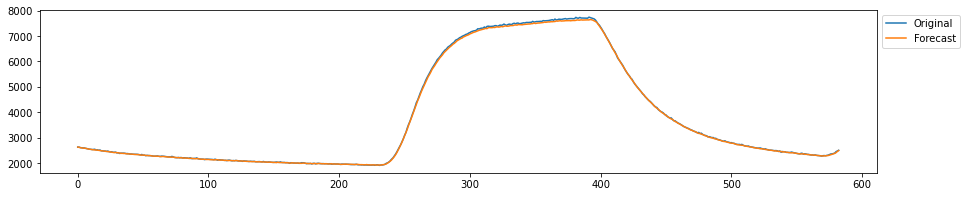

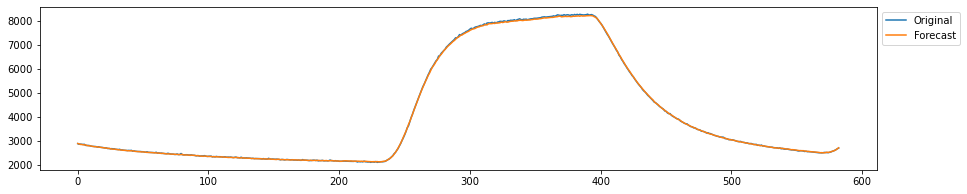

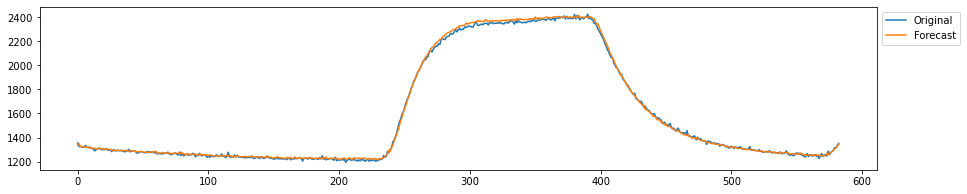

...

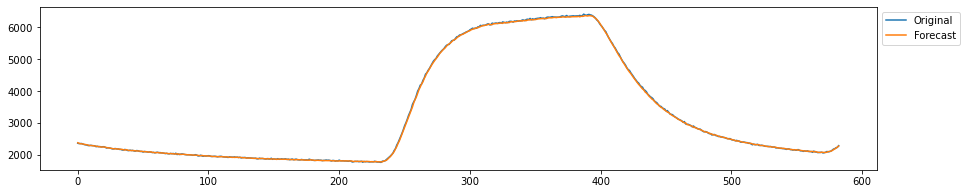

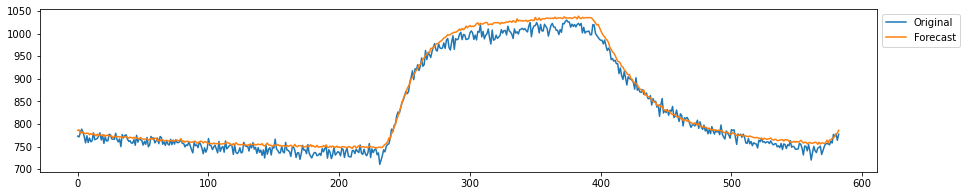

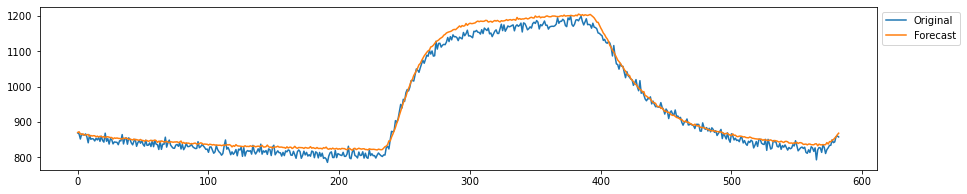

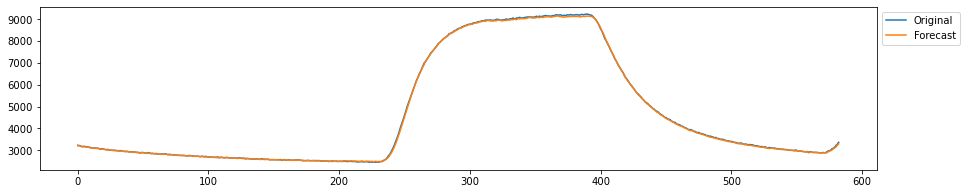

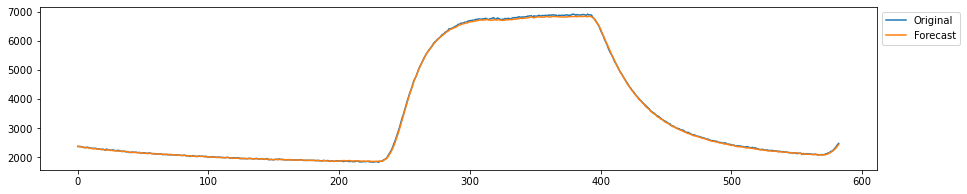

--------------------
training window 23370


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


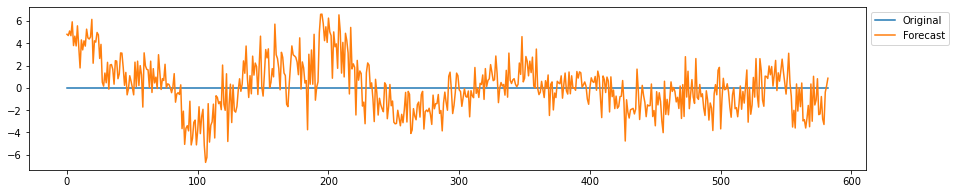

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


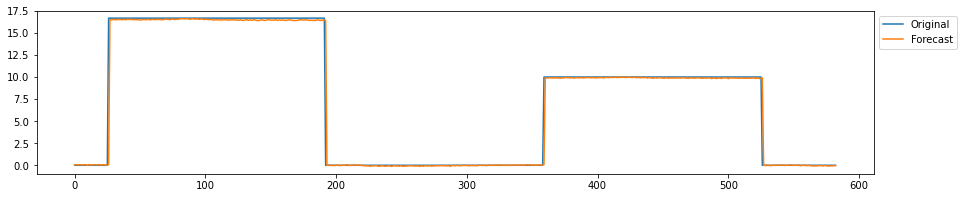

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


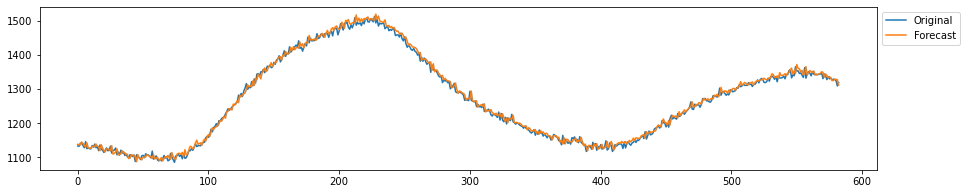

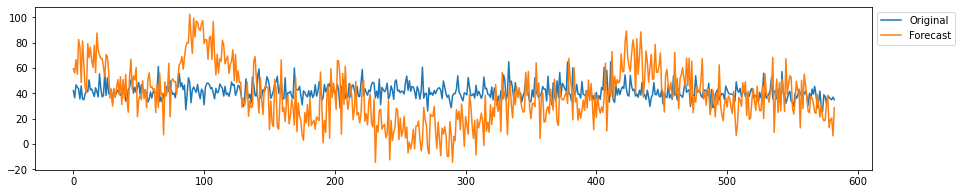

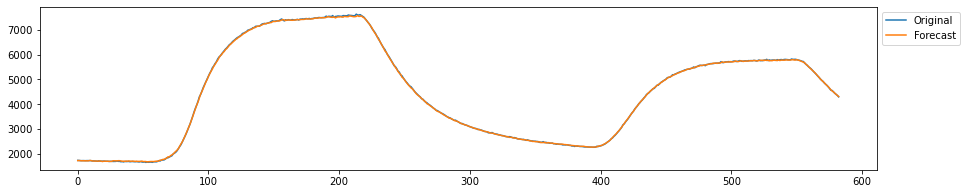

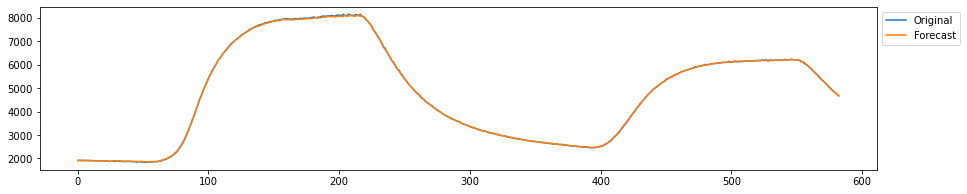

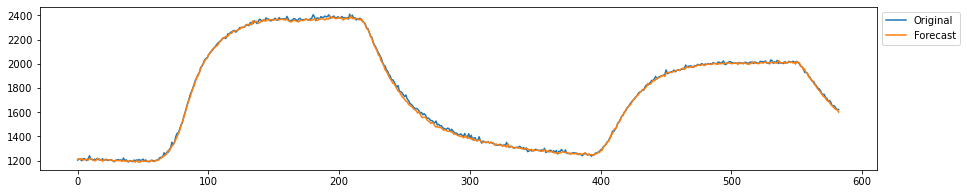

...

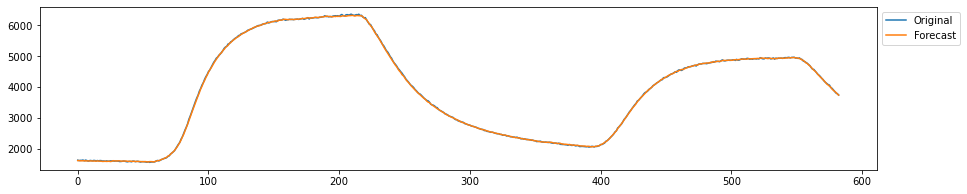

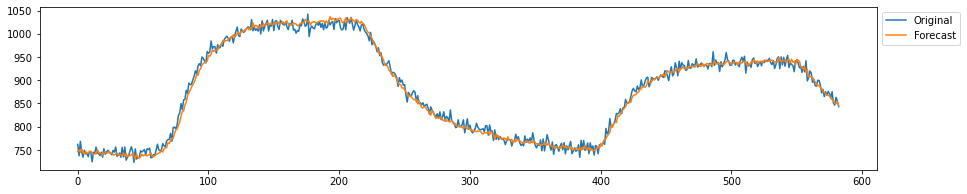

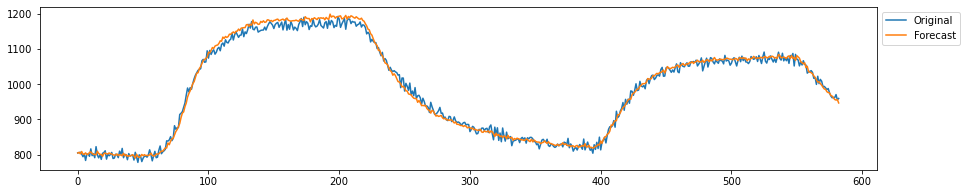

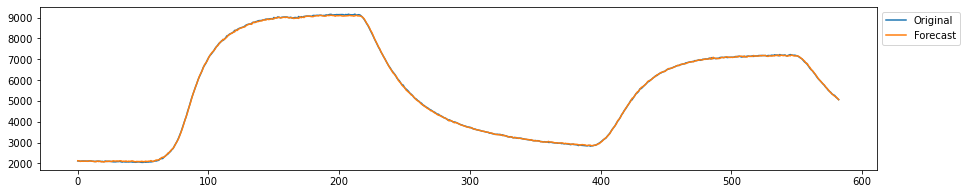

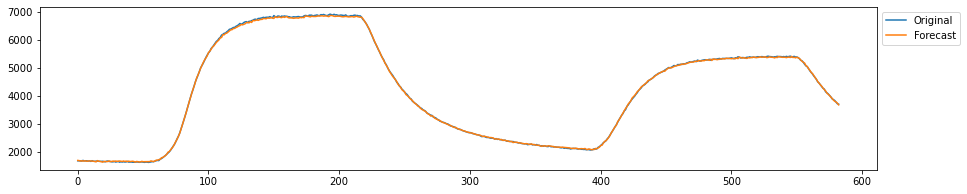

--------------------
training window 25707


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


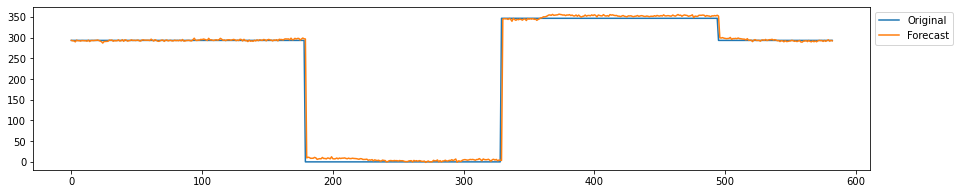

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


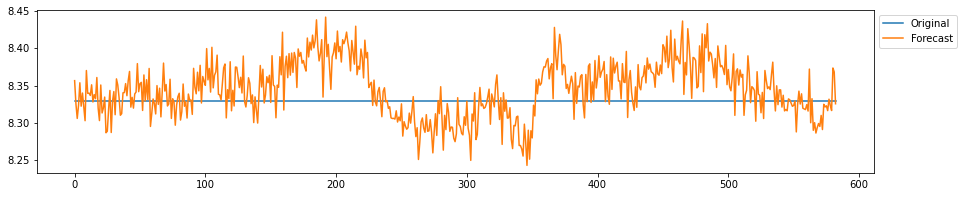

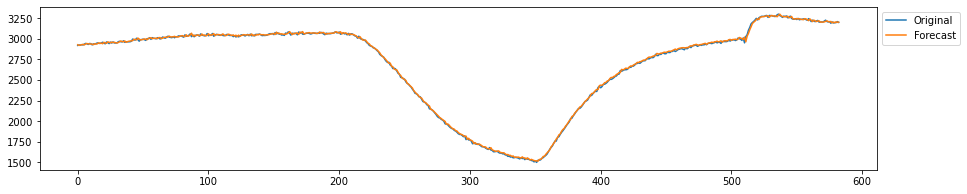

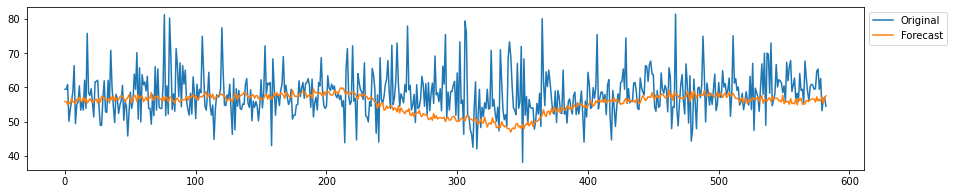

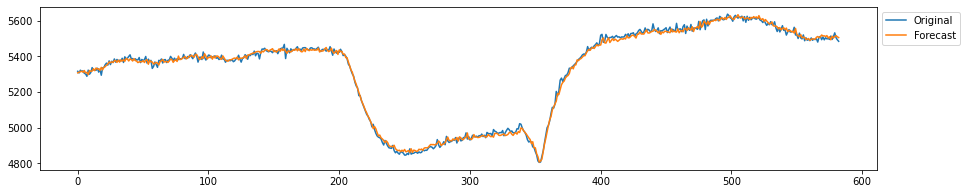

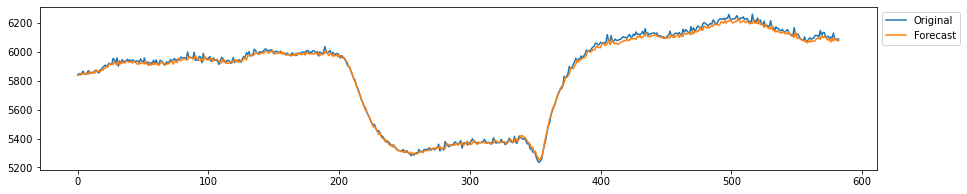

...

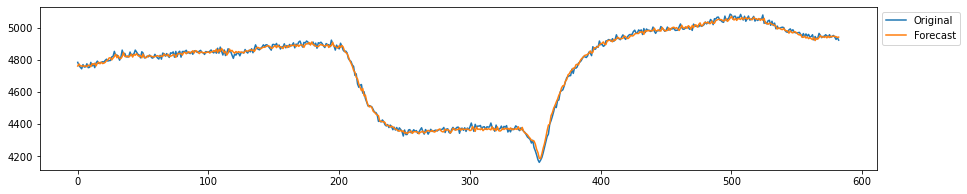

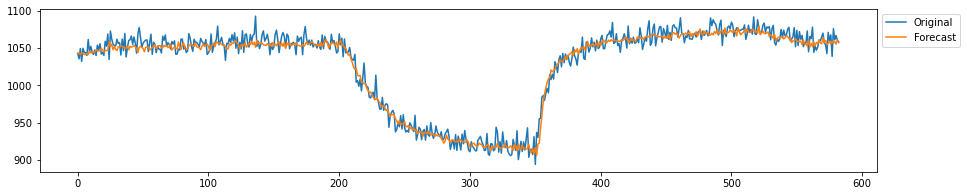

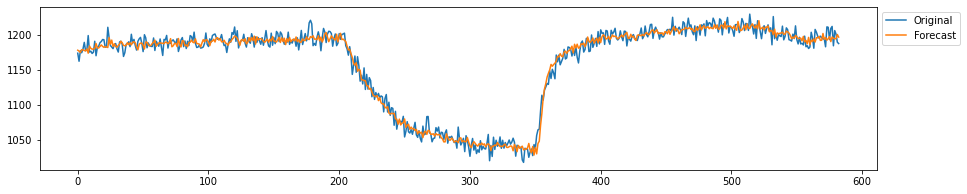

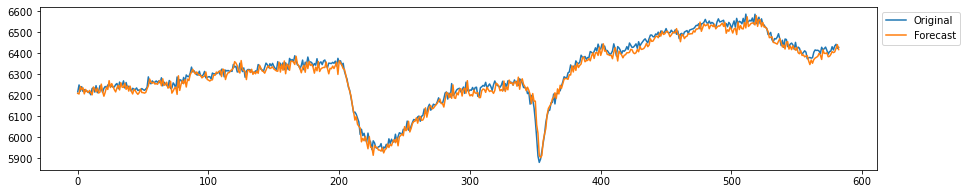

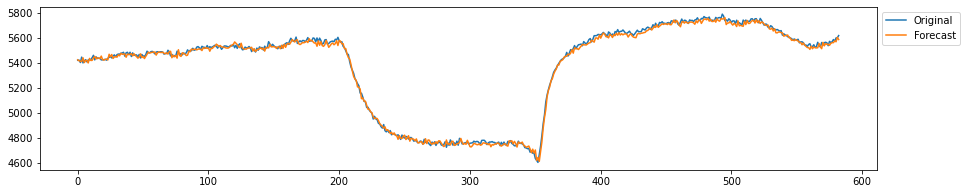

--------------------
training window 28044


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


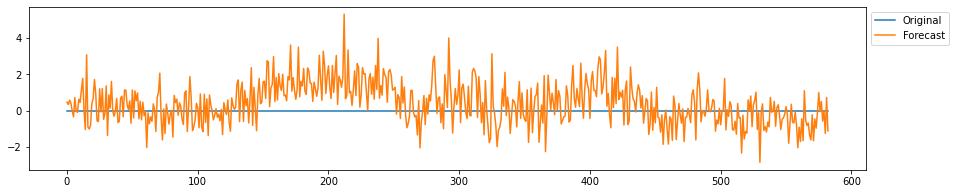

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


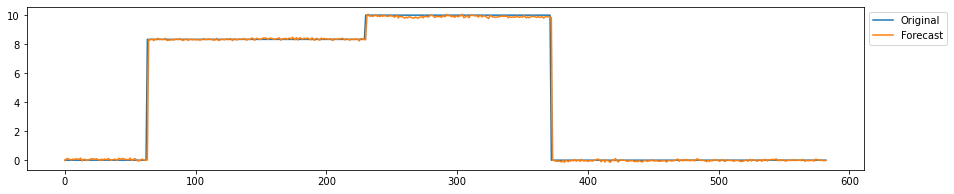

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


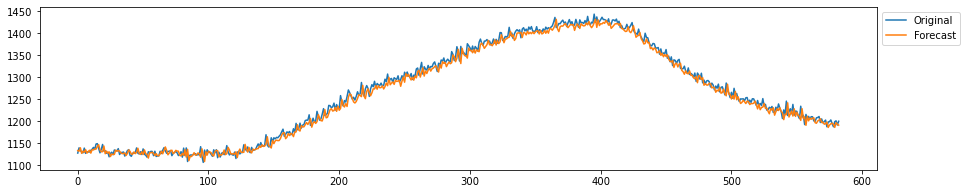

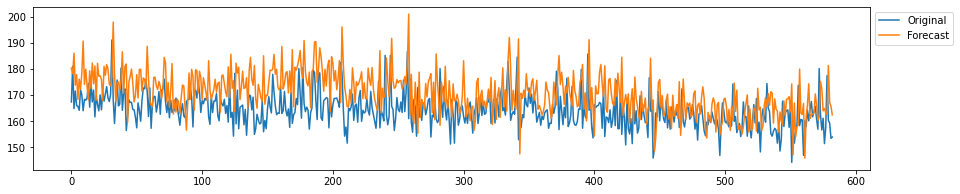

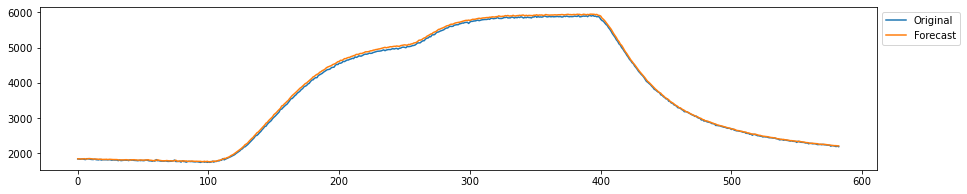

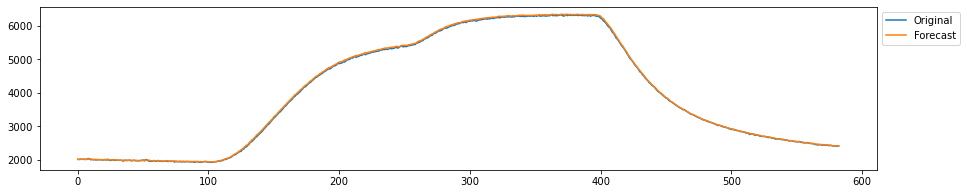

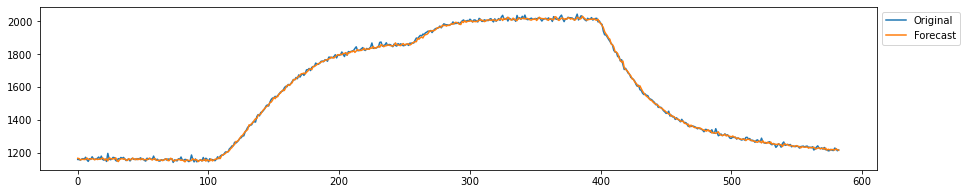

...

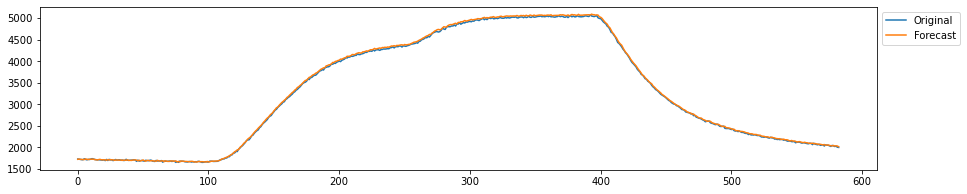

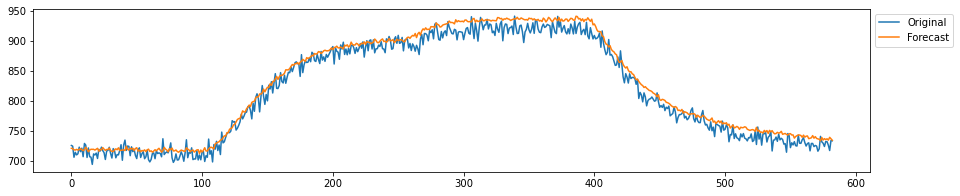

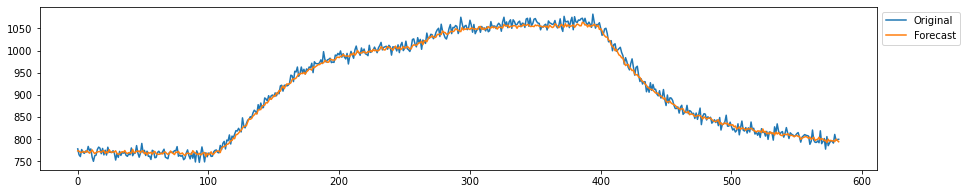

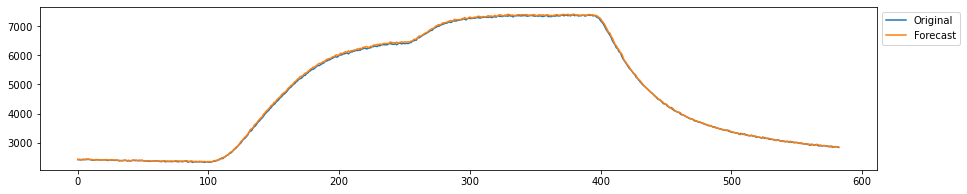

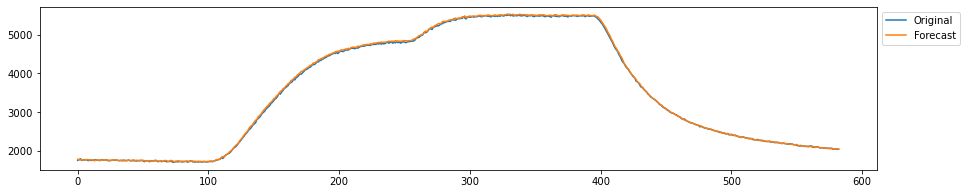

--------------------
training window 30381


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


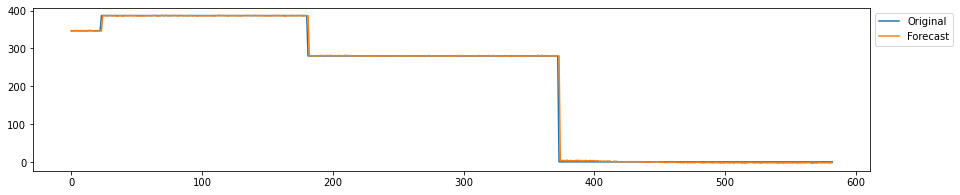

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


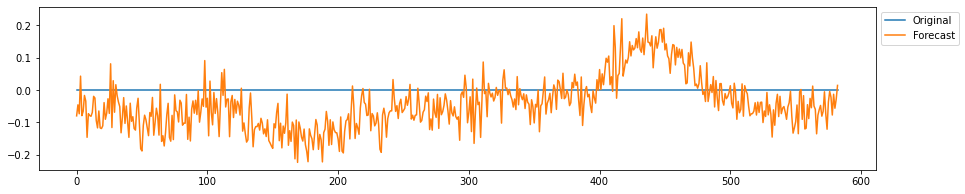

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


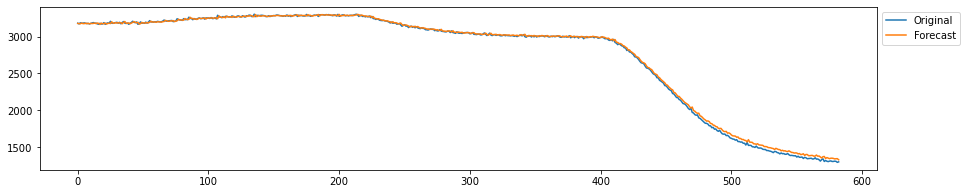

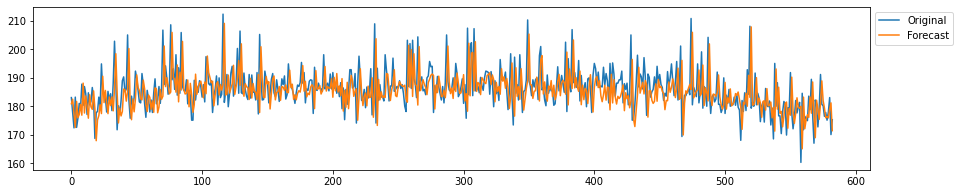

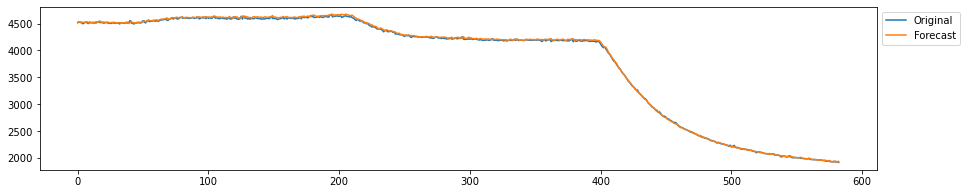

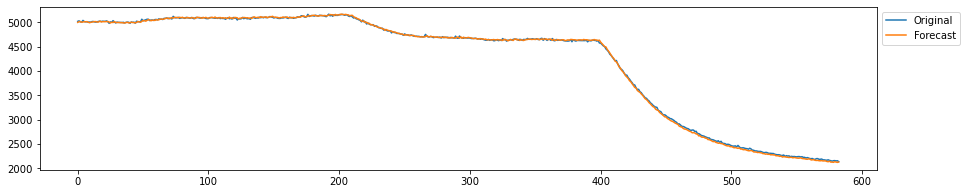

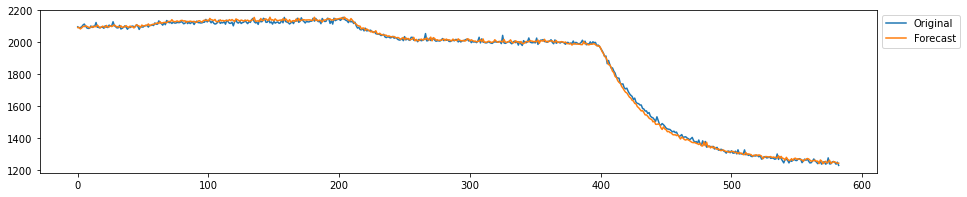

...

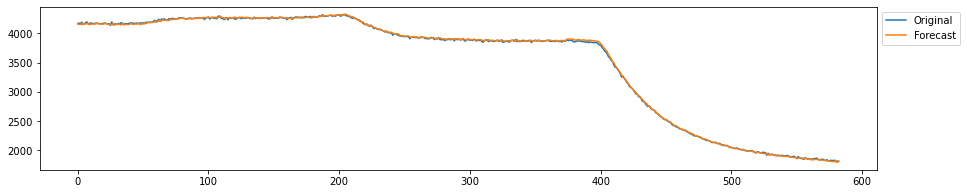

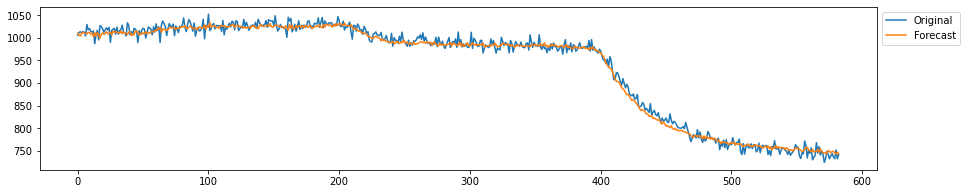

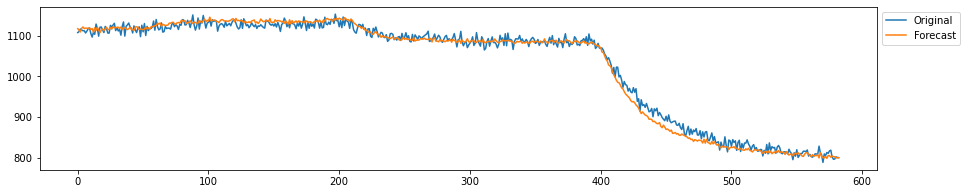

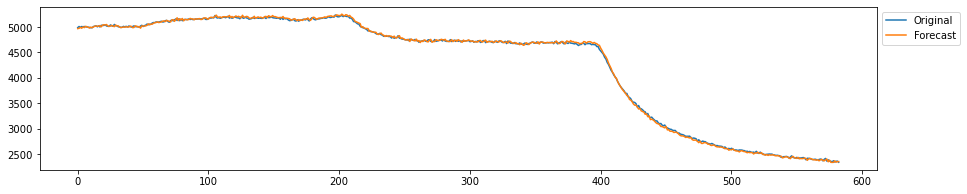

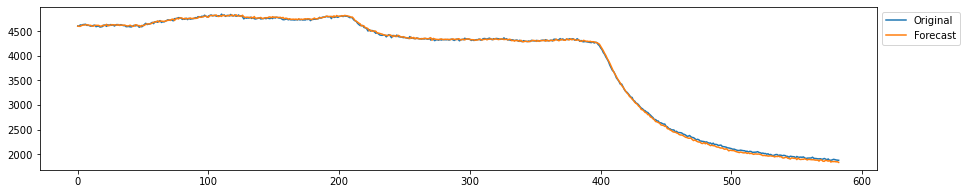

--------------------
training window 32718


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


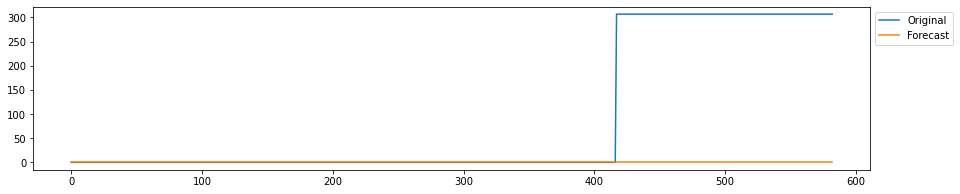

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: invalid value encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


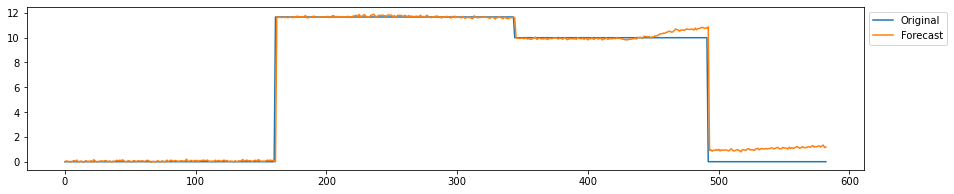

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


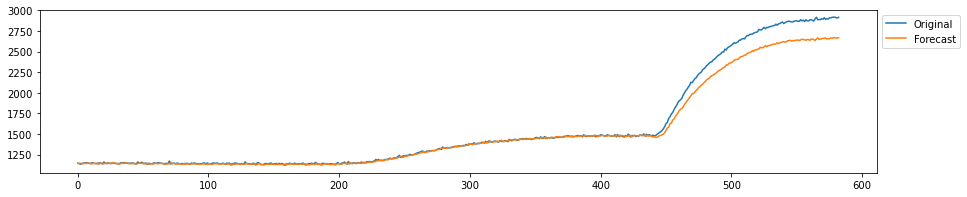

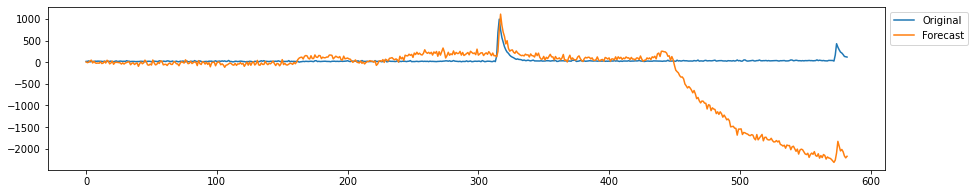

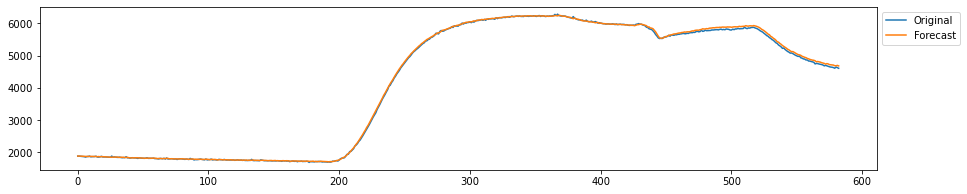

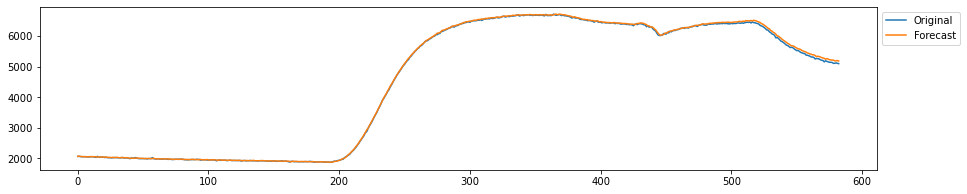

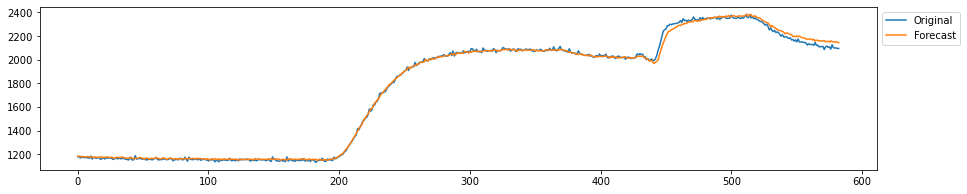

...

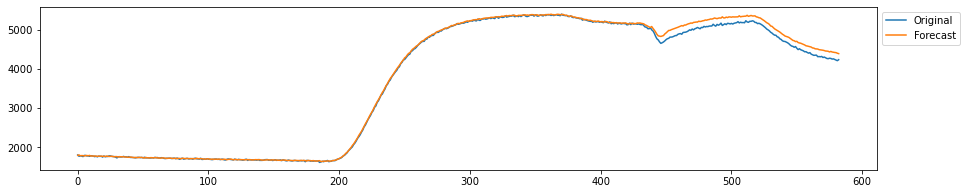

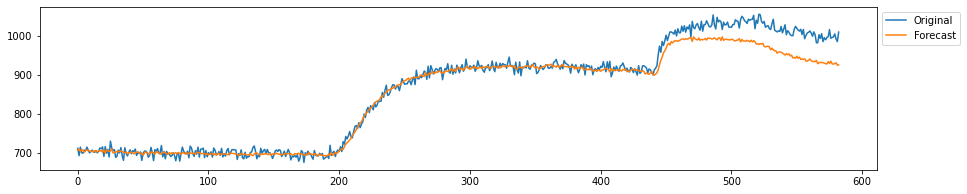

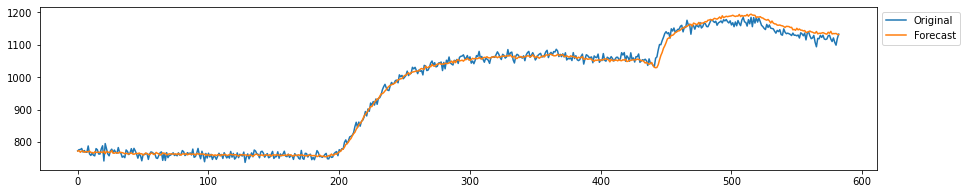

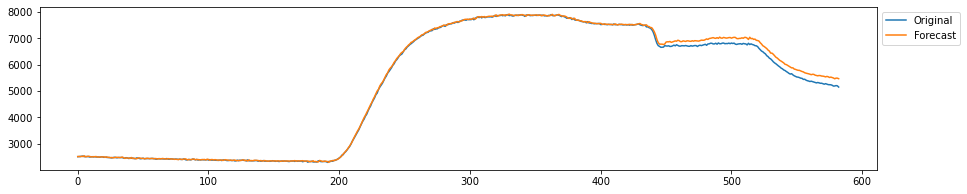

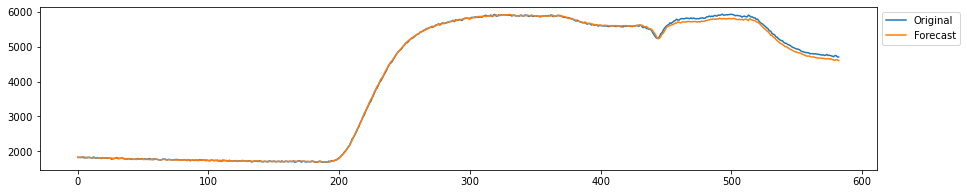

--------------------
training window 35055


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


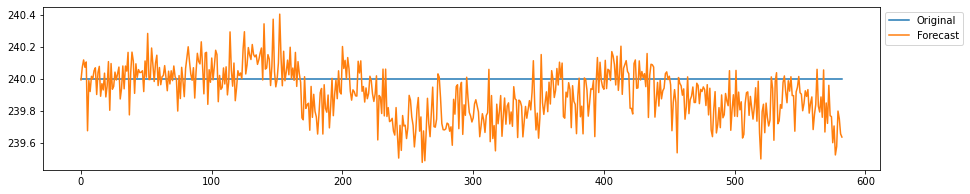

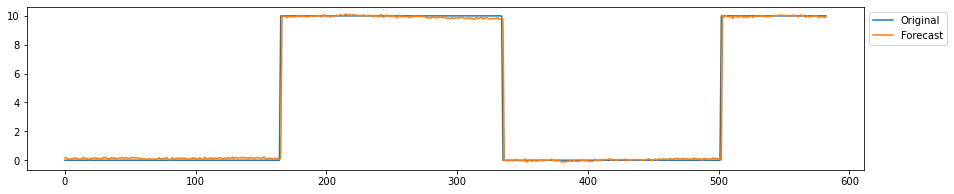

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


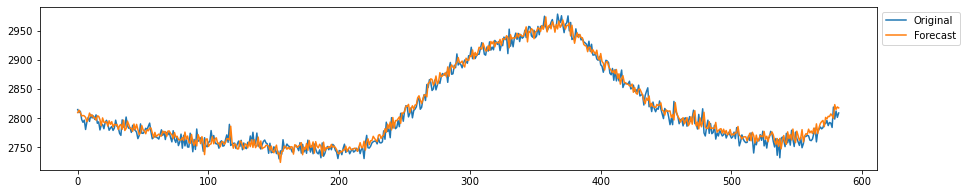

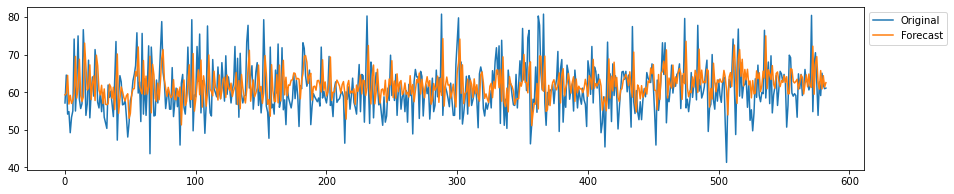

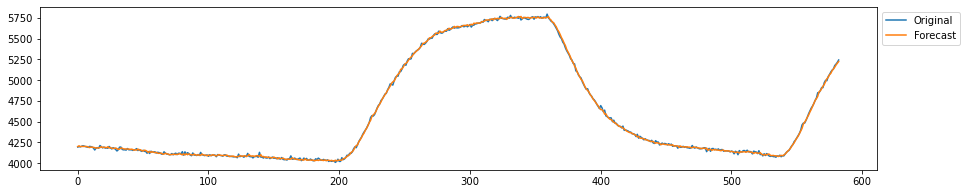

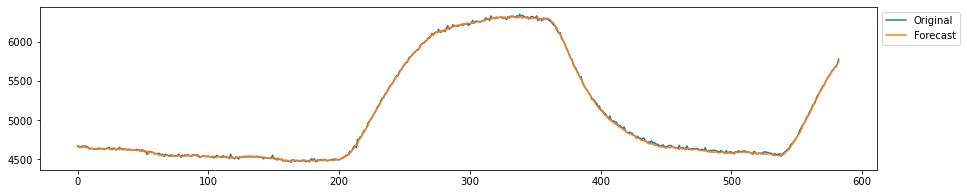

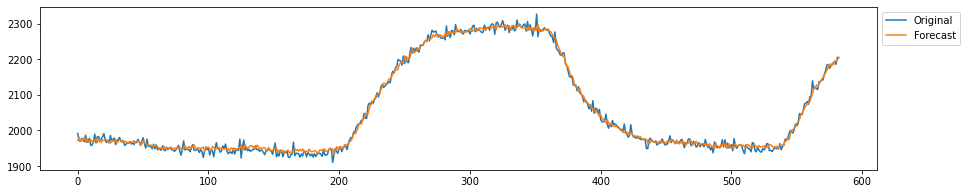

...

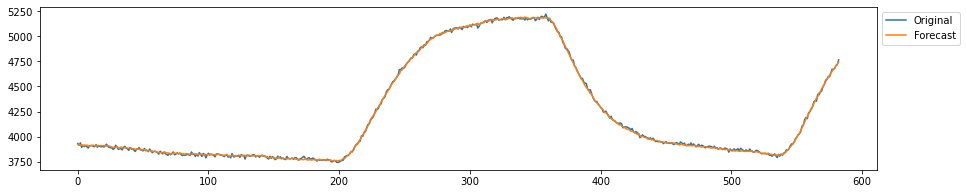

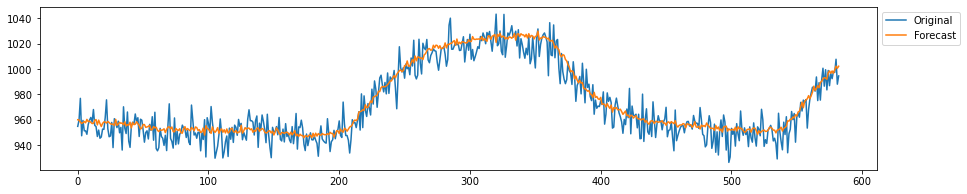

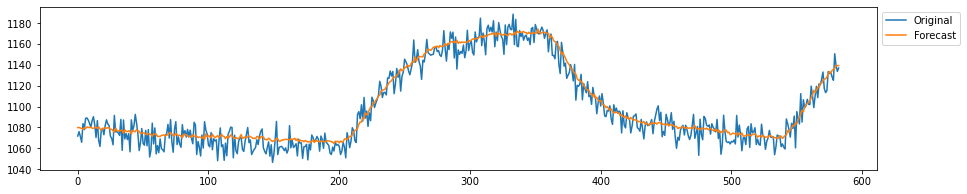

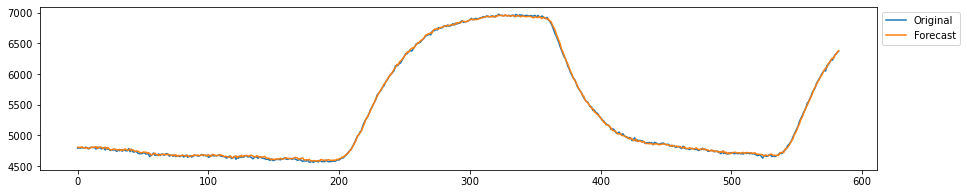

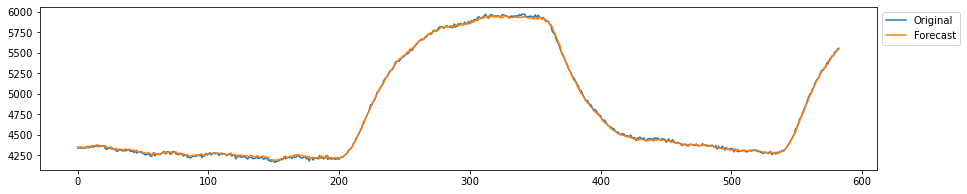

--------------------
training window 37392


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


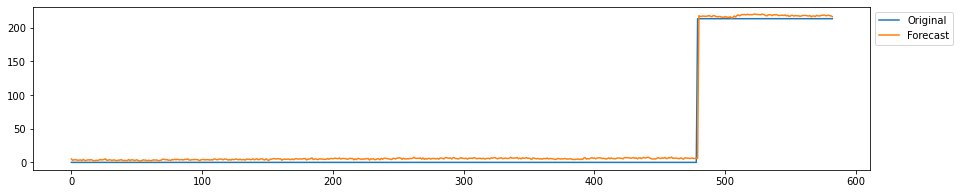

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


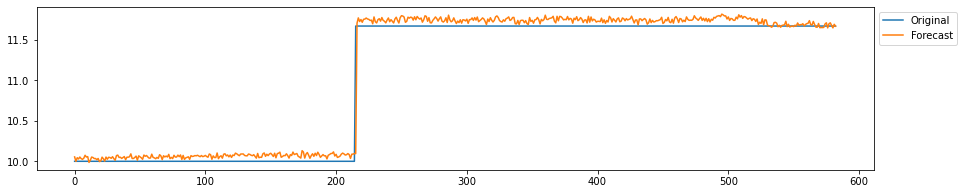

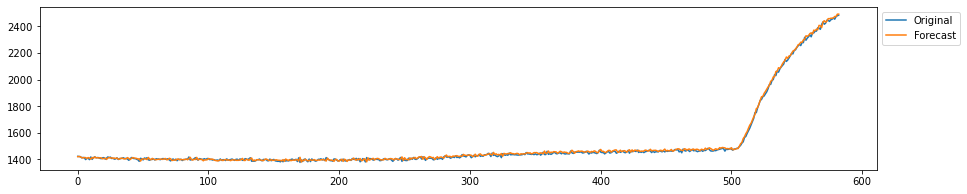

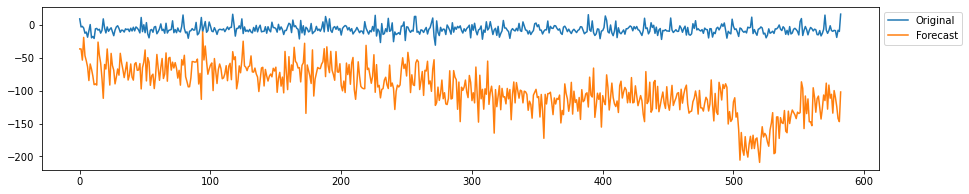

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


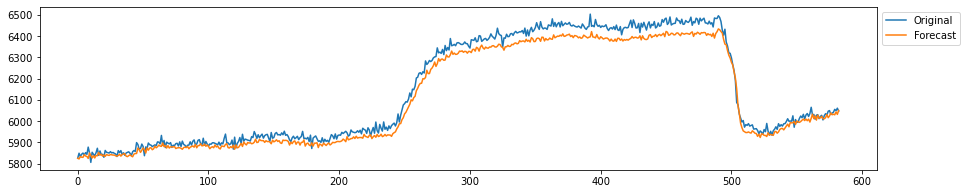

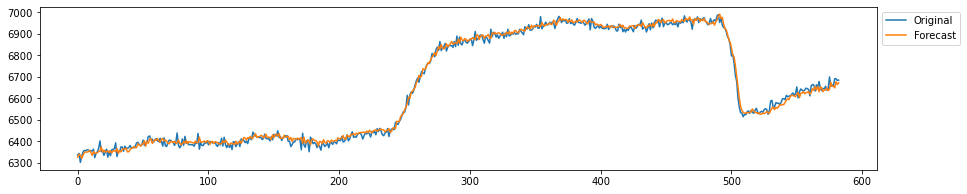

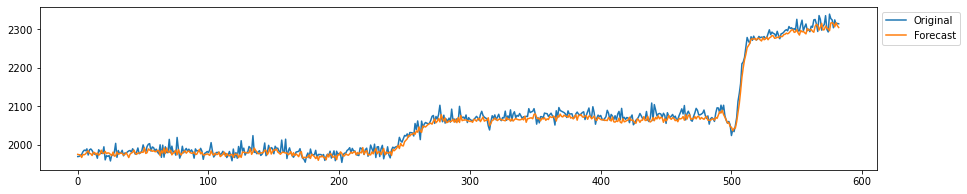

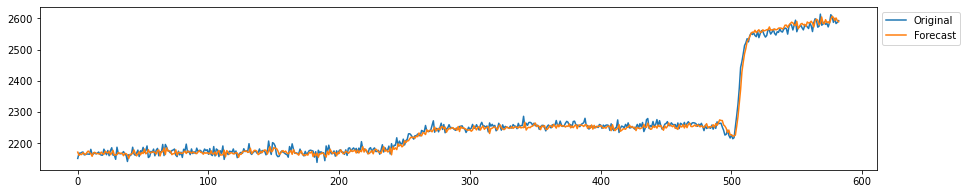

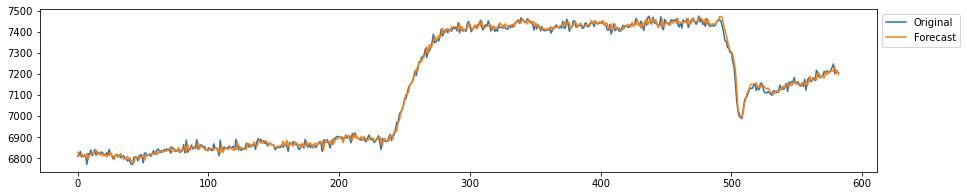

...

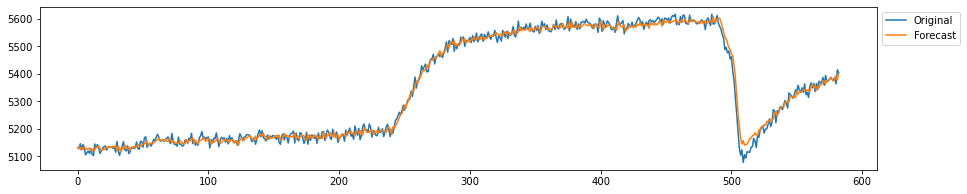

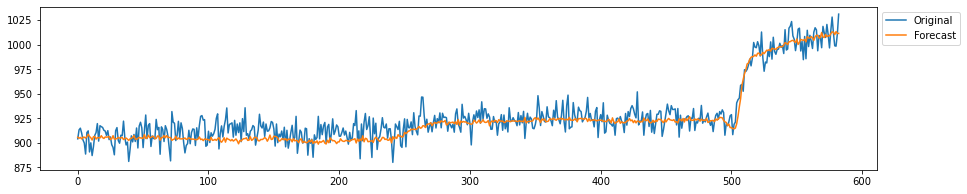

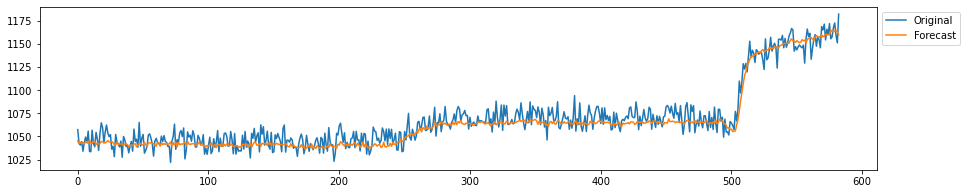

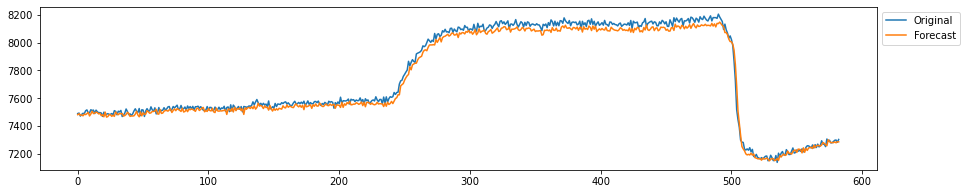

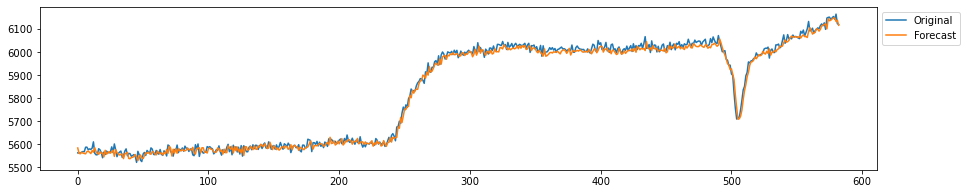

--------------------
training window 39729


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


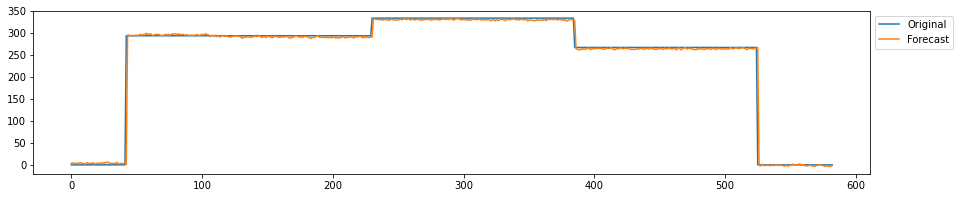

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


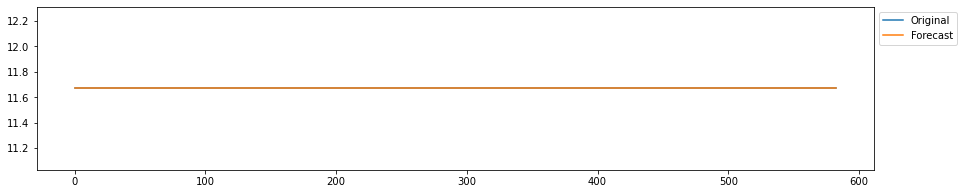

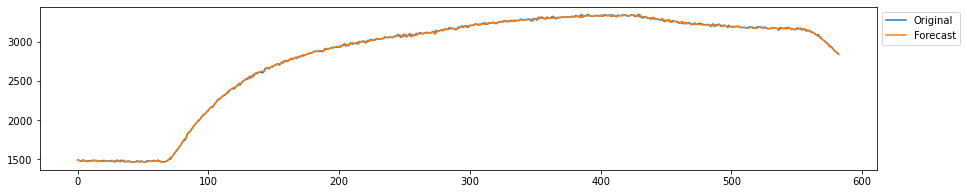

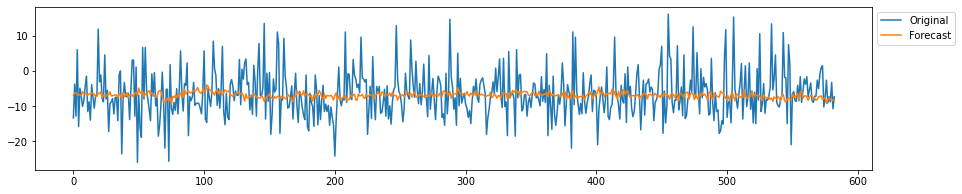

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


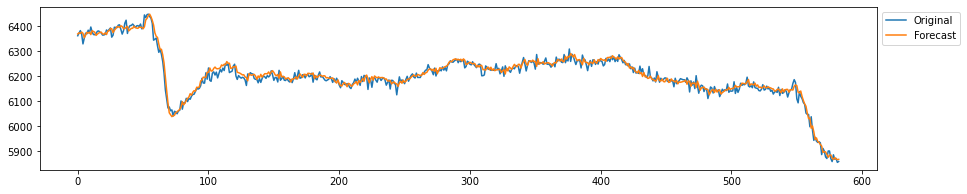

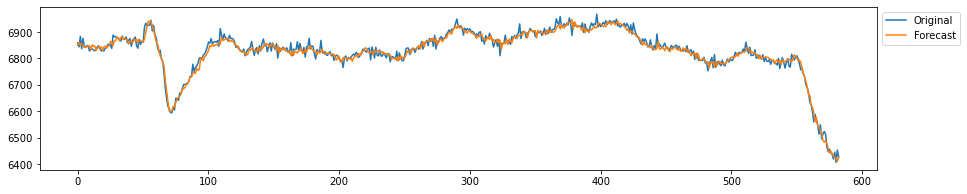

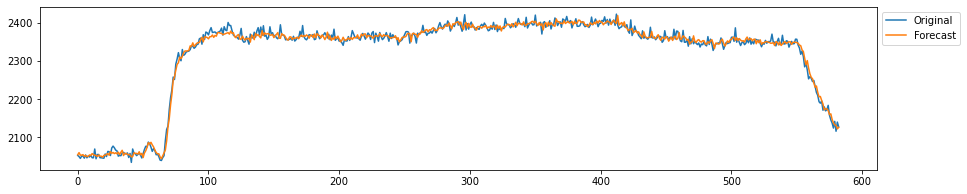

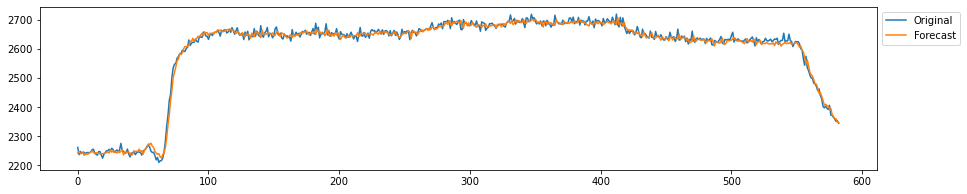

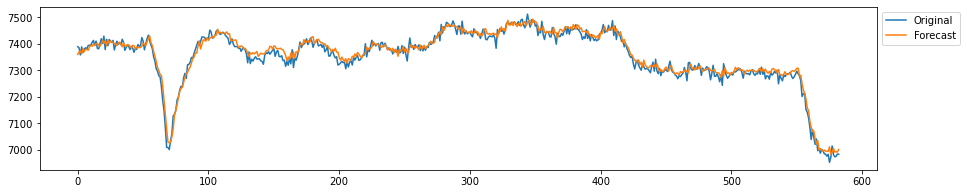

...

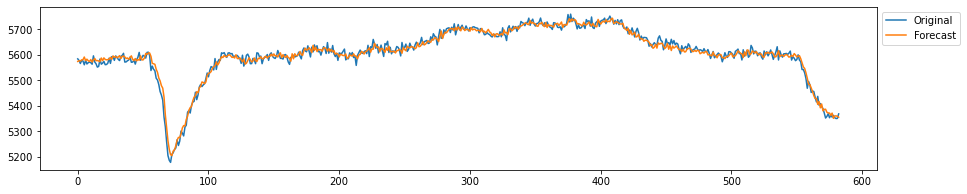

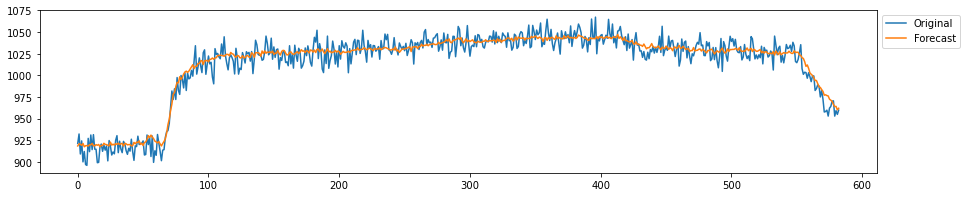

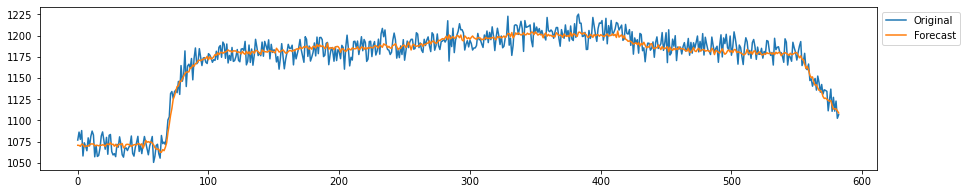

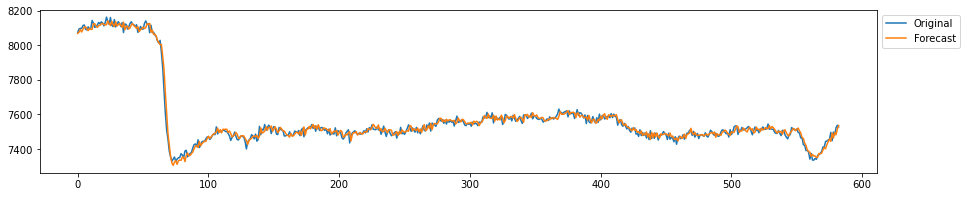

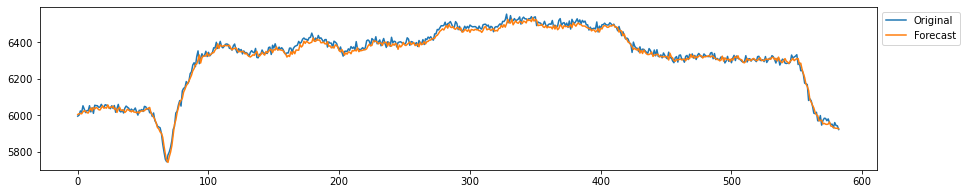

--------------------
training window 42066


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


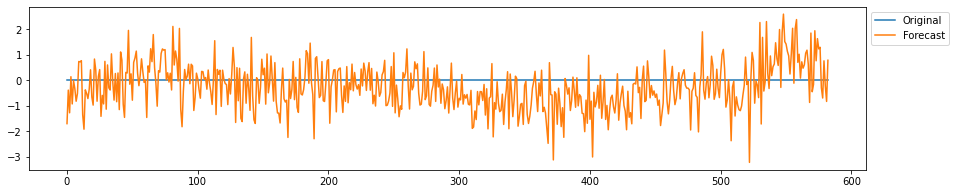

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


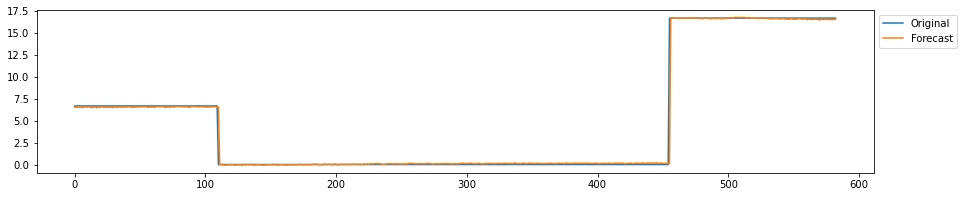

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


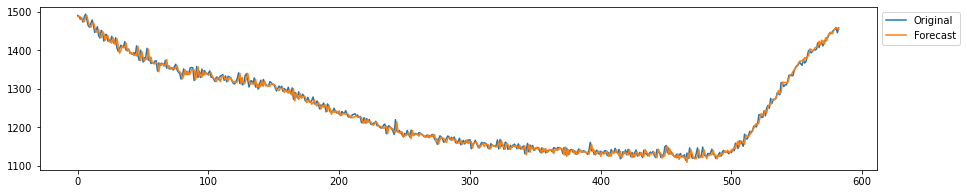

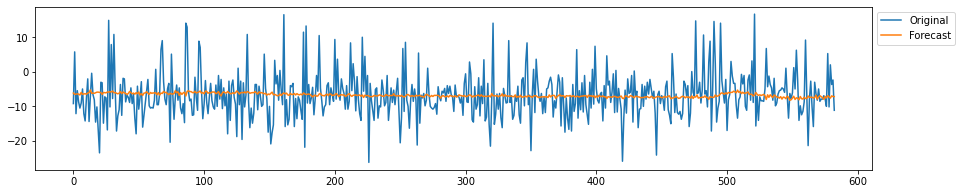

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


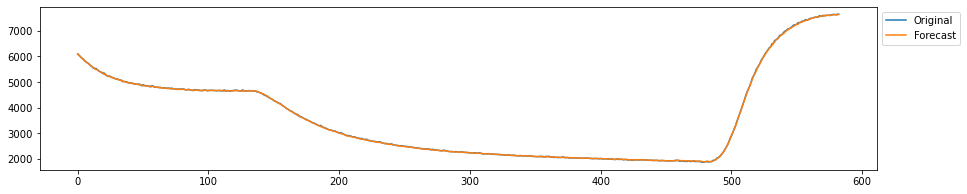

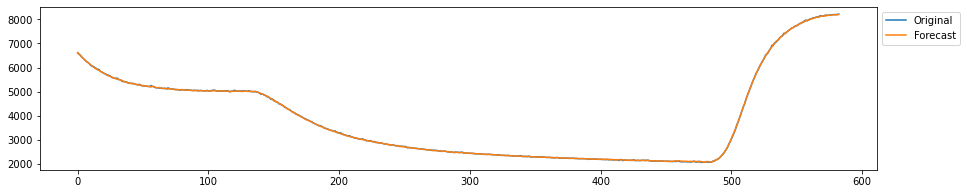

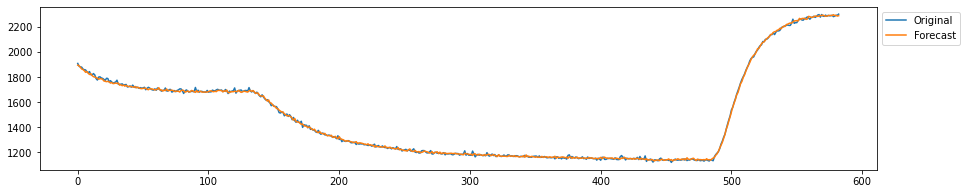

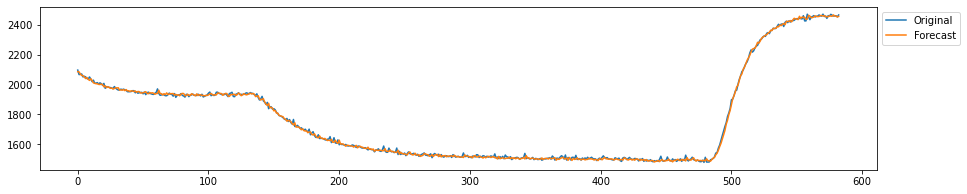

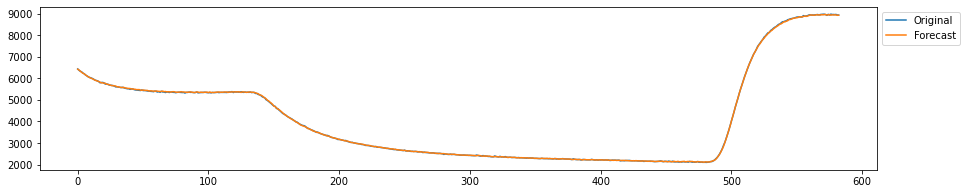

...

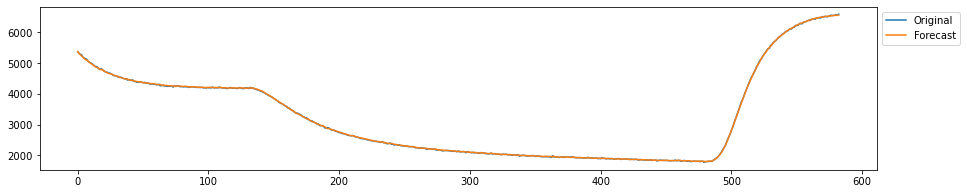

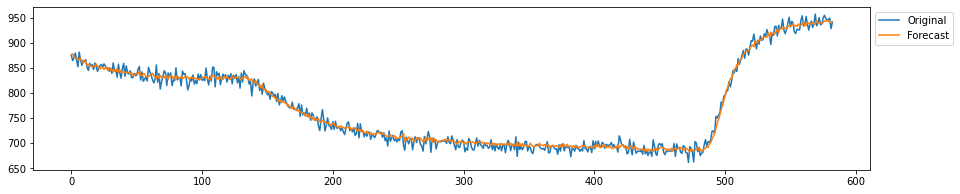

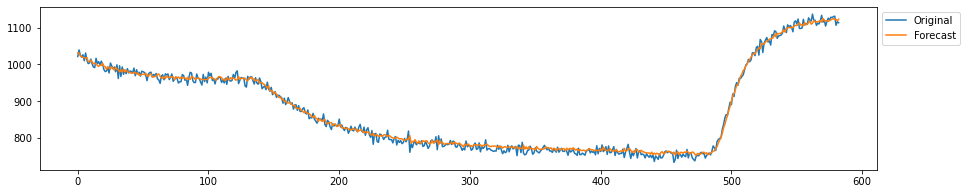

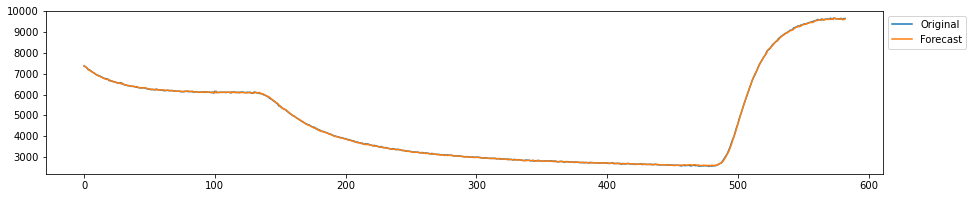

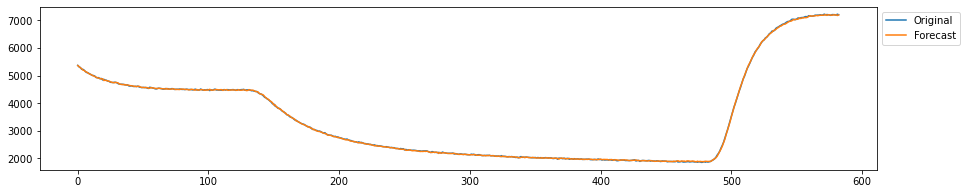

--------------------
training window 44403


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


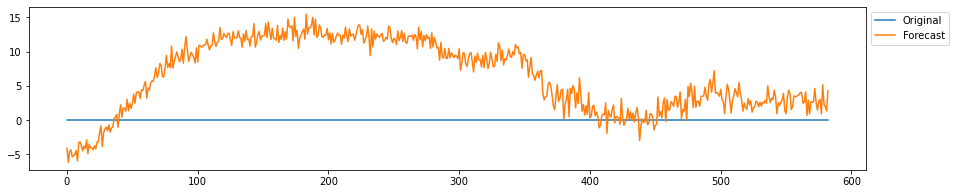

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


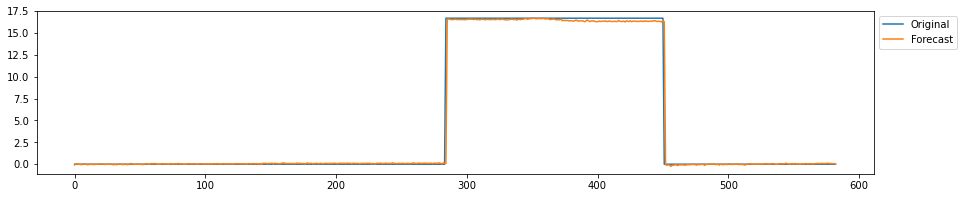

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


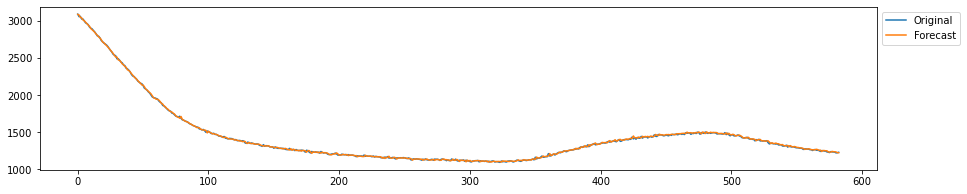

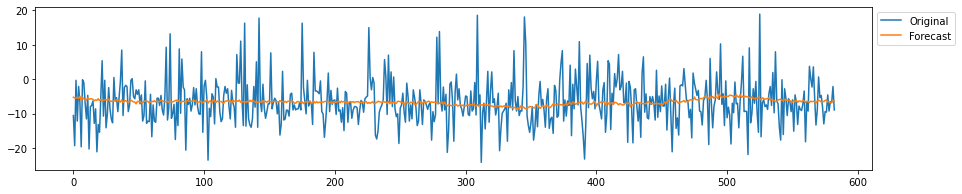

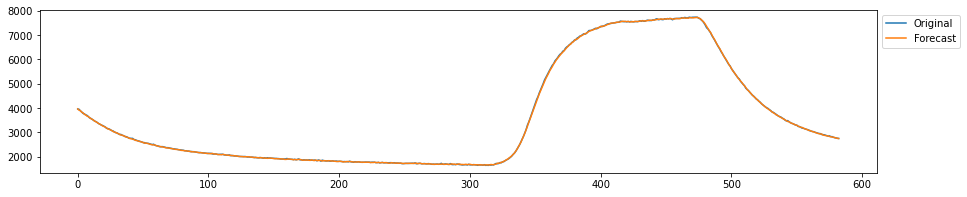

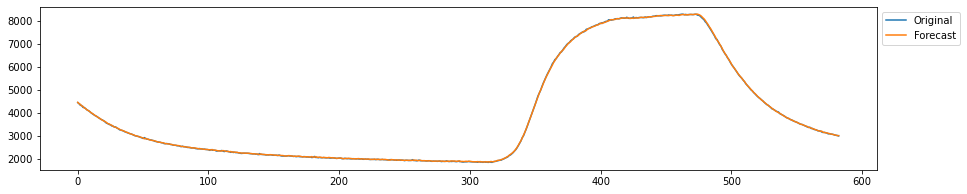

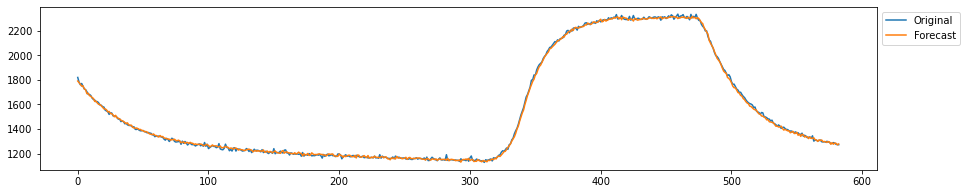

...

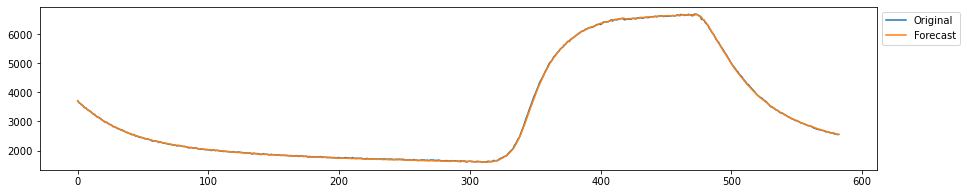

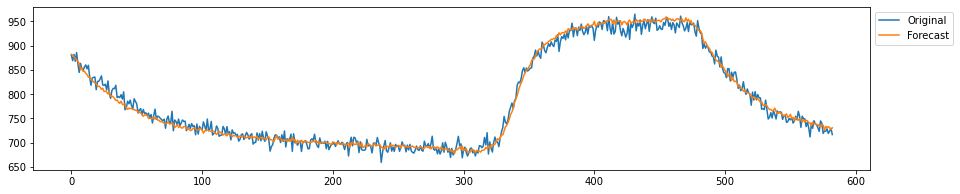

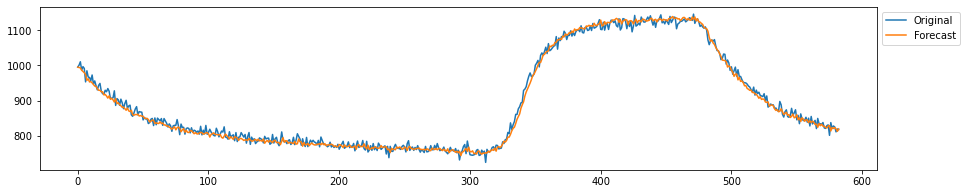

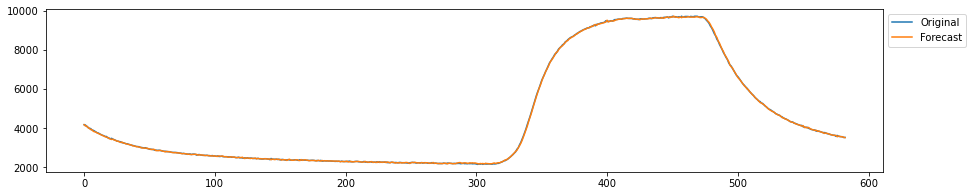

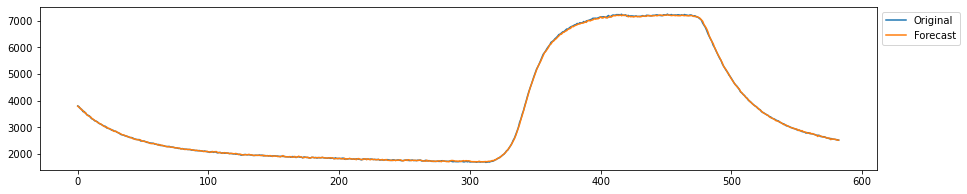

--------------------
training window 46740


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


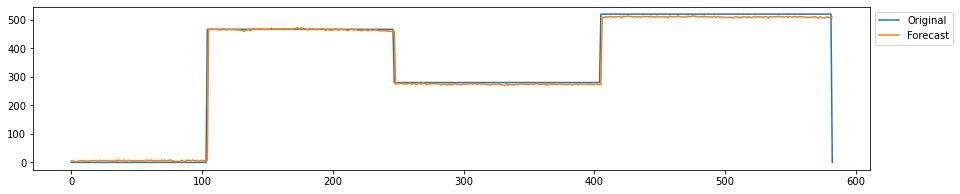

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


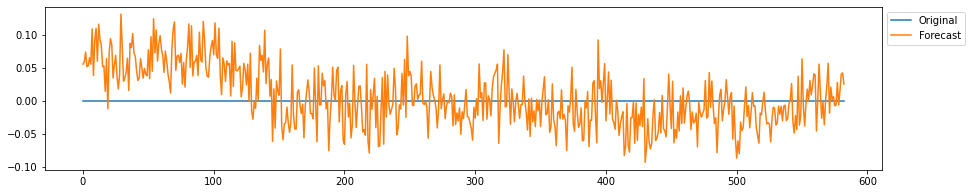

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


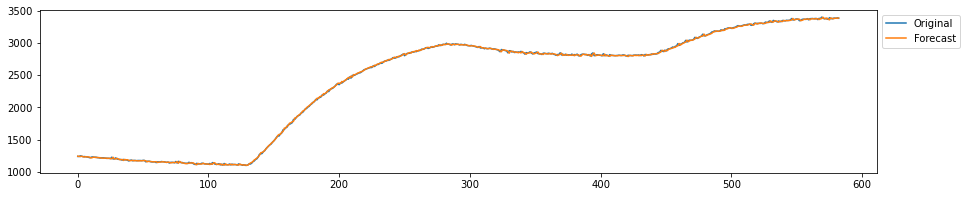

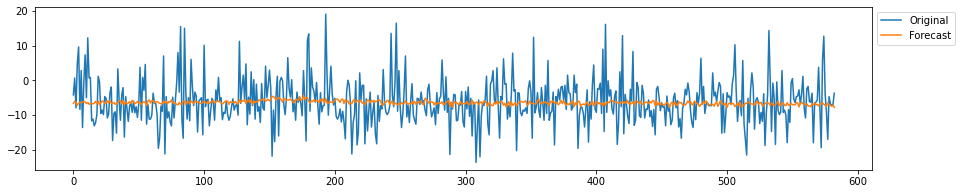

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


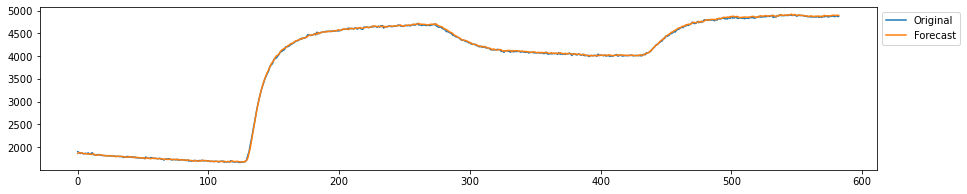

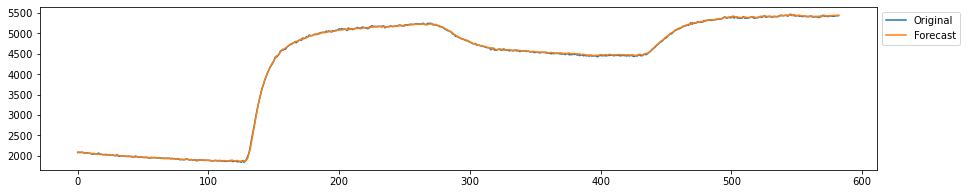

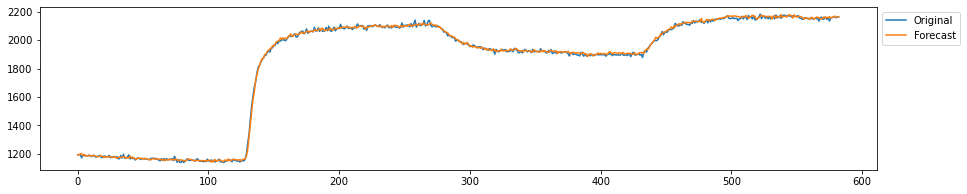

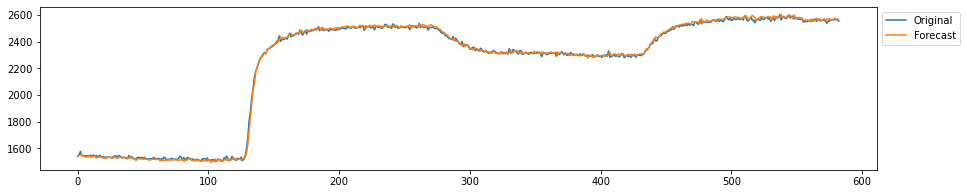

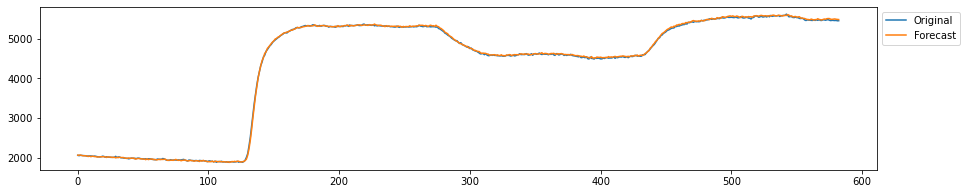

...

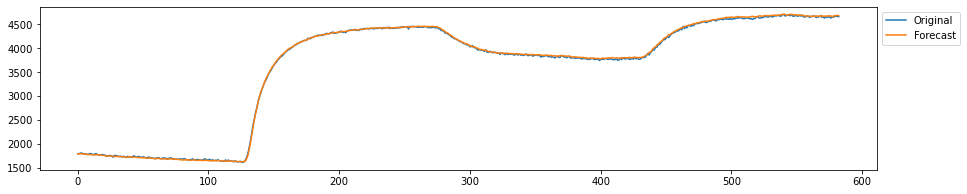

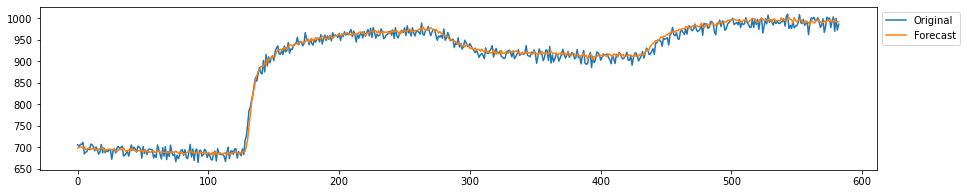

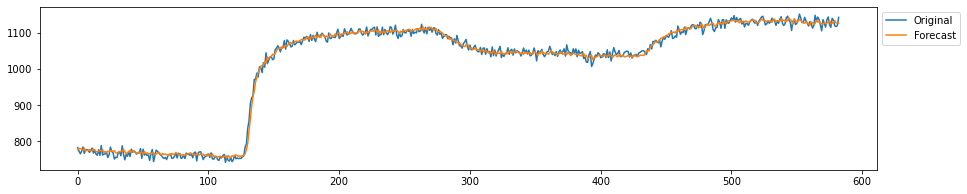

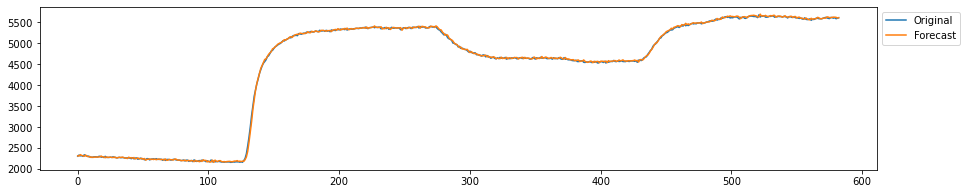

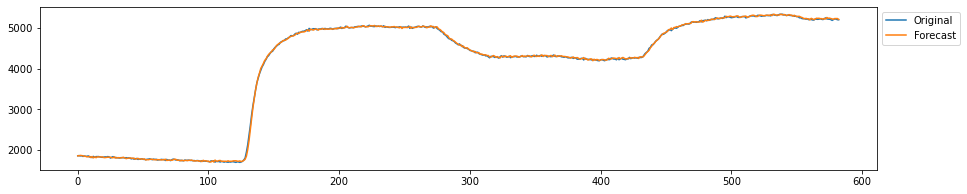

--------------------
training window 49077


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


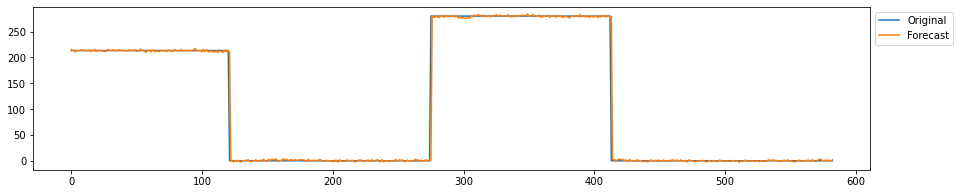

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


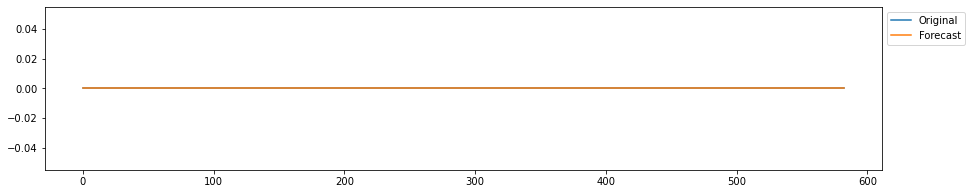

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: invalid value encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100
/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: Mean of empty slice
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


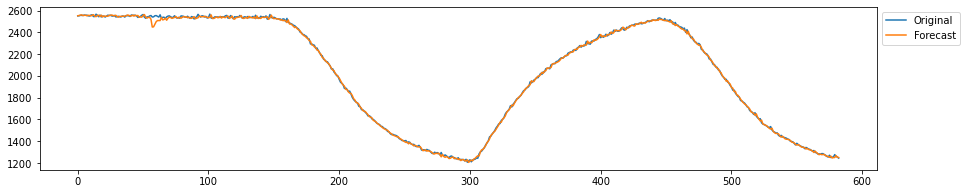

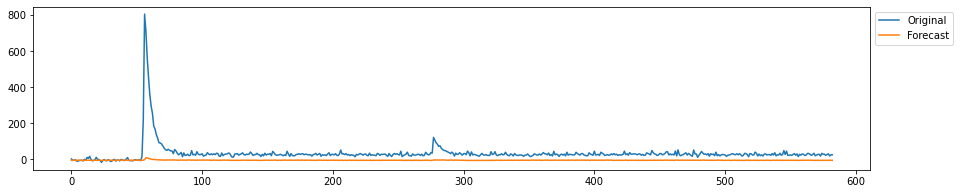

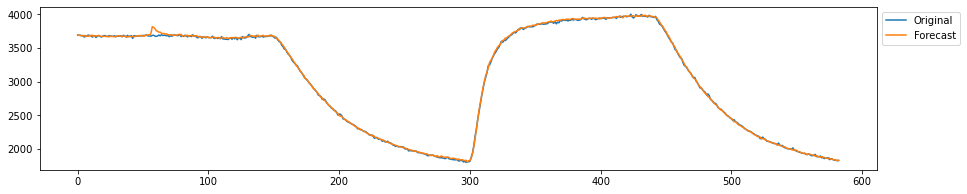

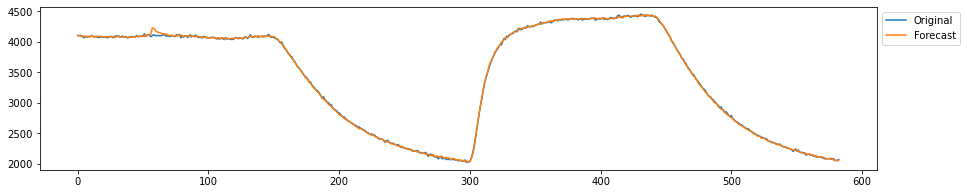

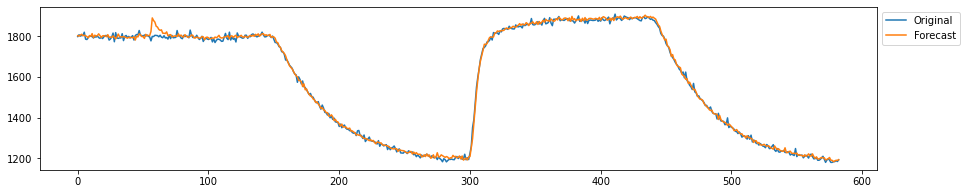

...

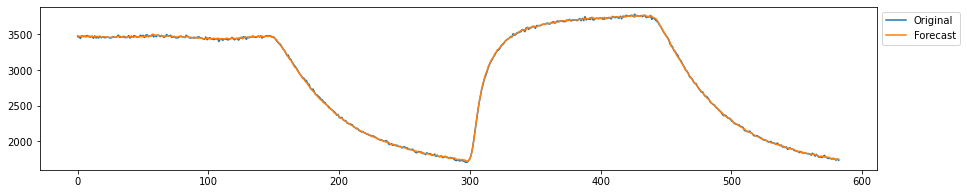

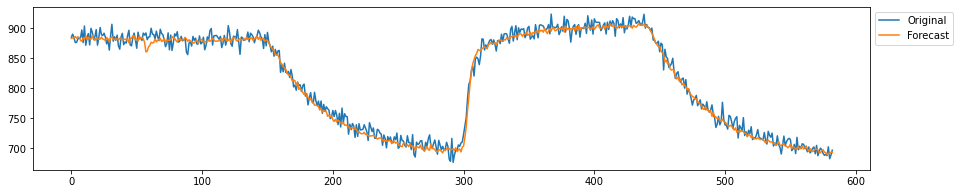

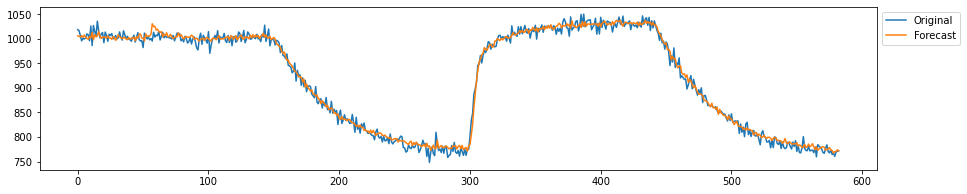

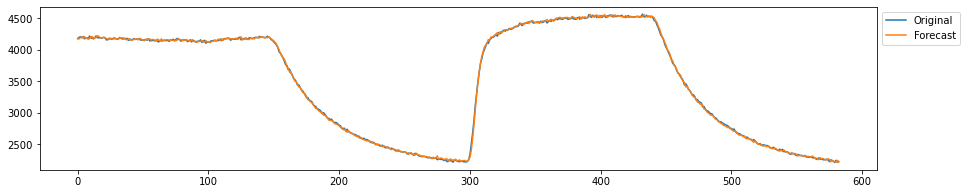

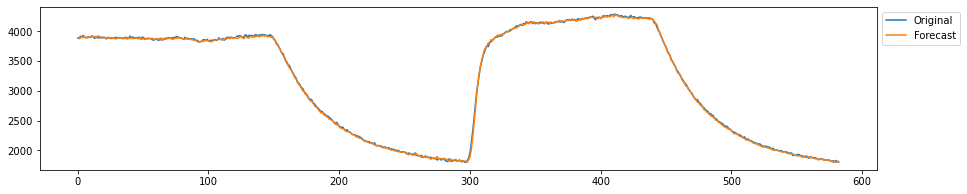

--------------------
training window 51414


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


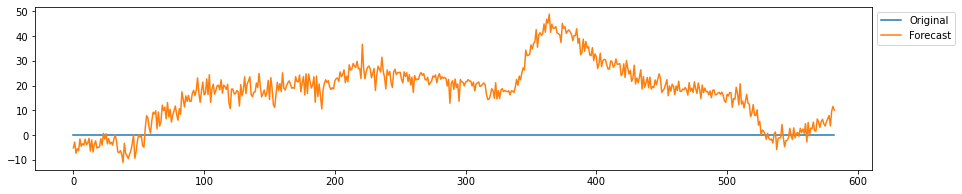

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


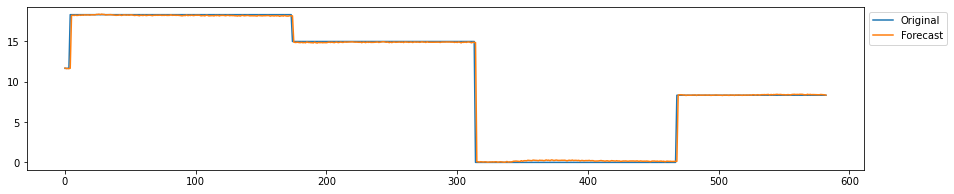

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


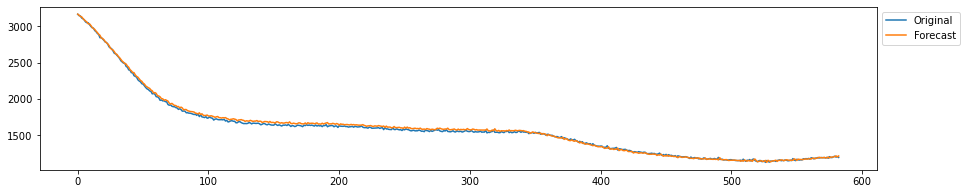

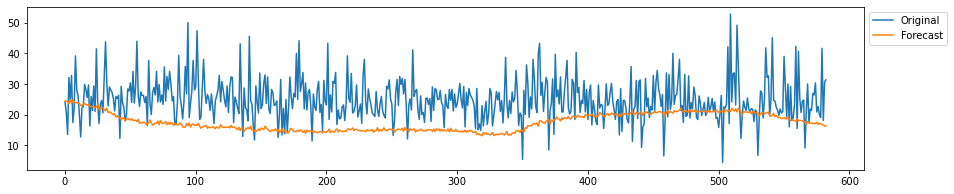

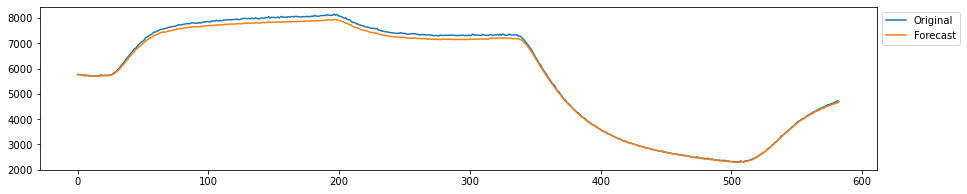

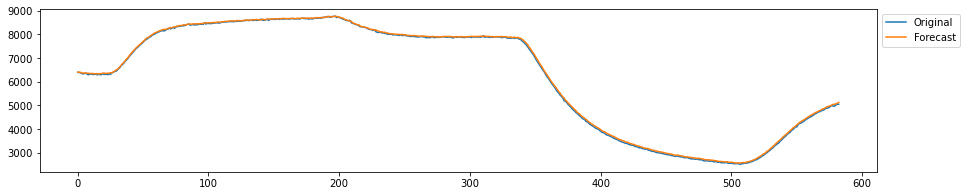

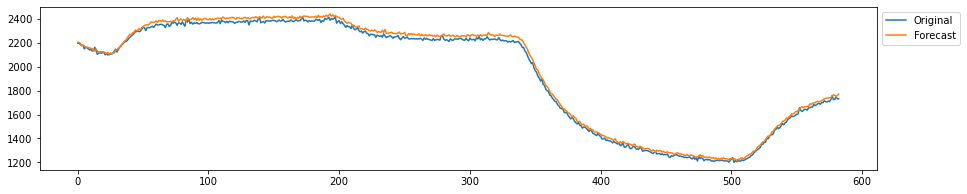

...

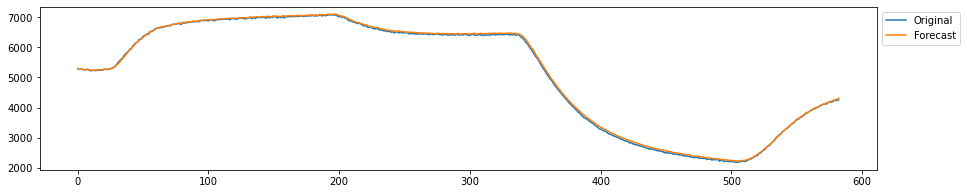

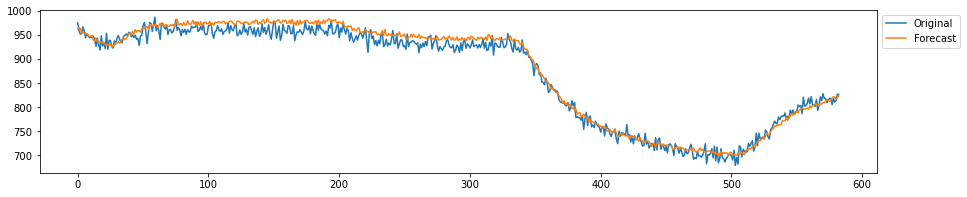

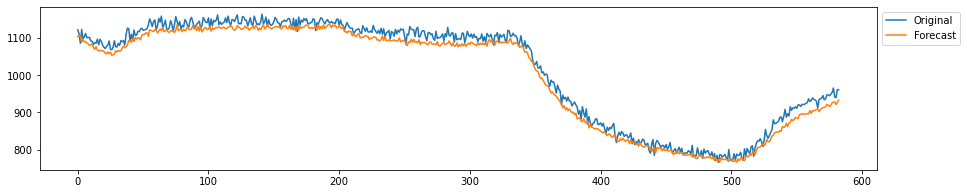

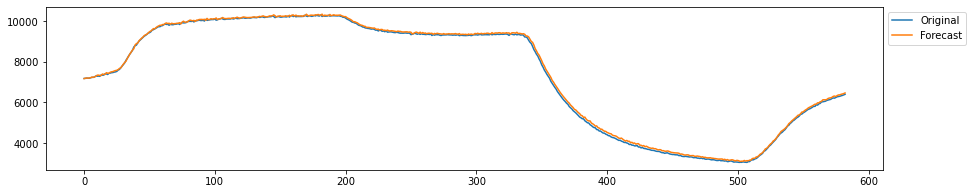

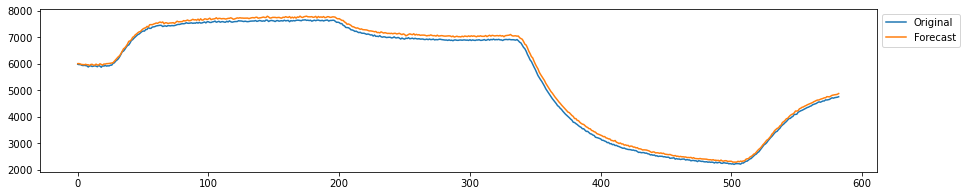

--------------------
training window 53751


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


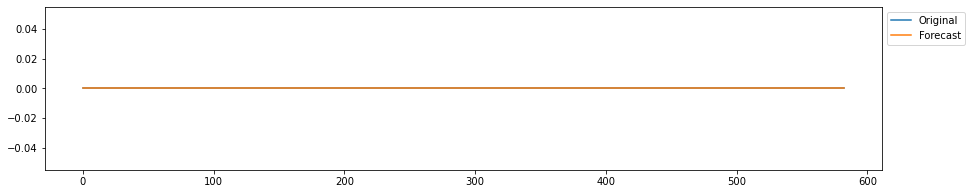

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: invalid value encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100
/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: Mean of empty slice
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


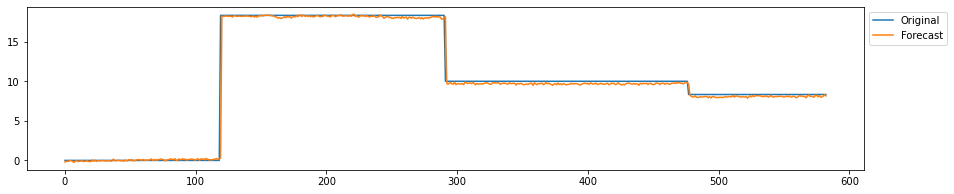

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


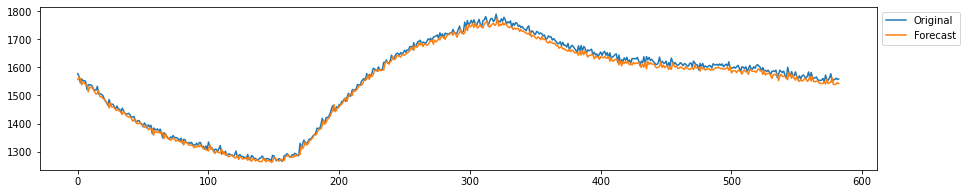

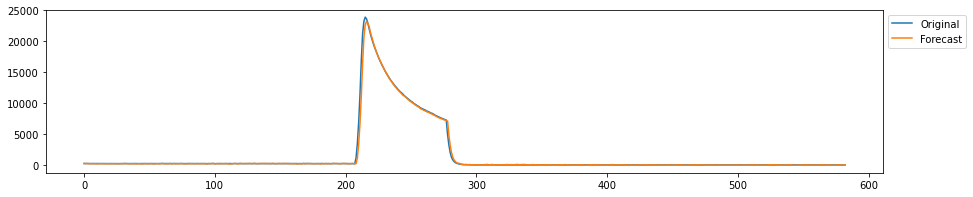

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


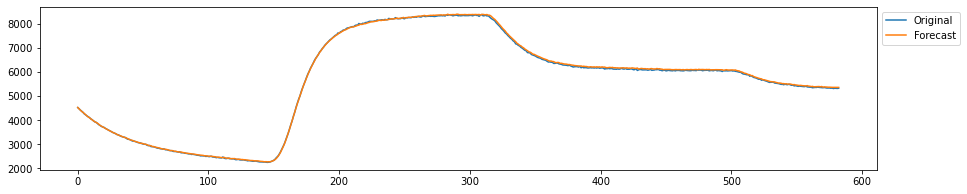

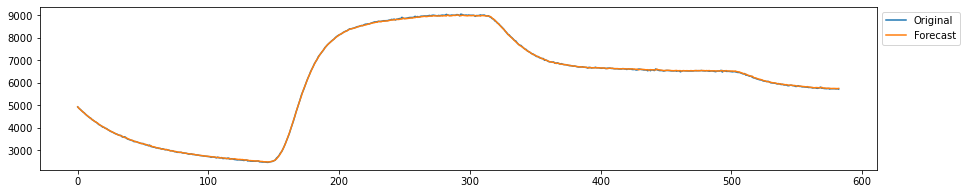

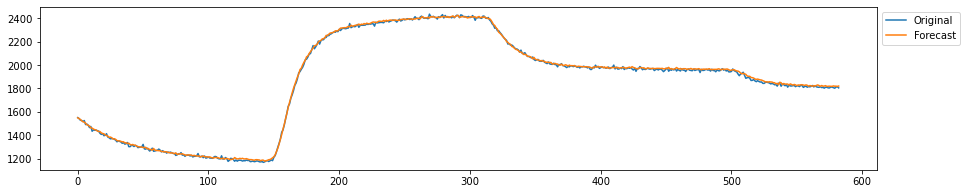

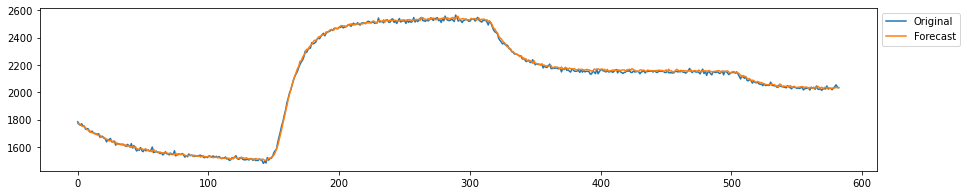

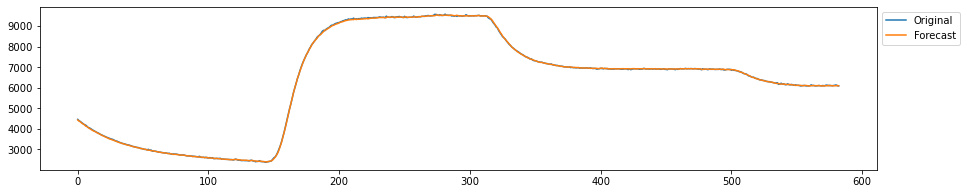

...

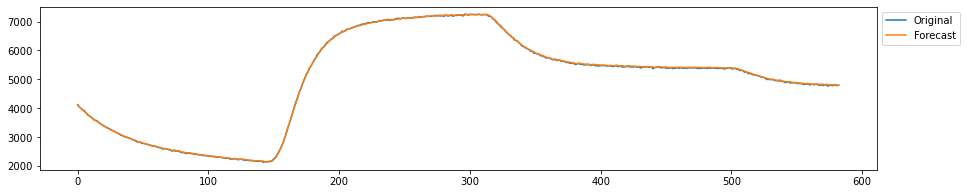

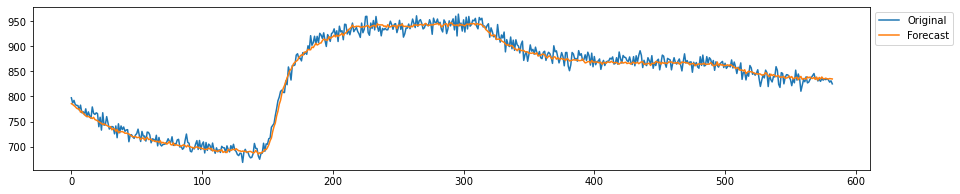

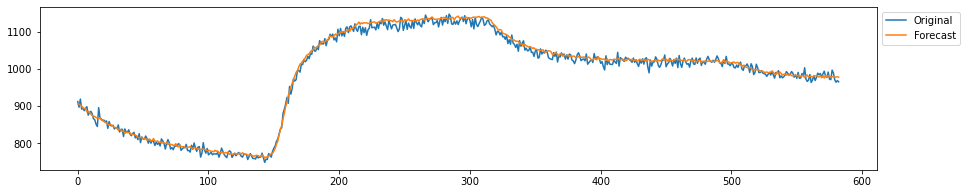

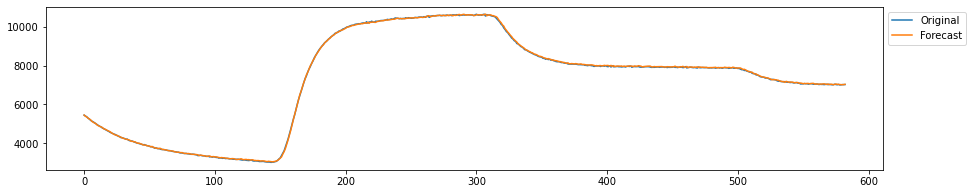

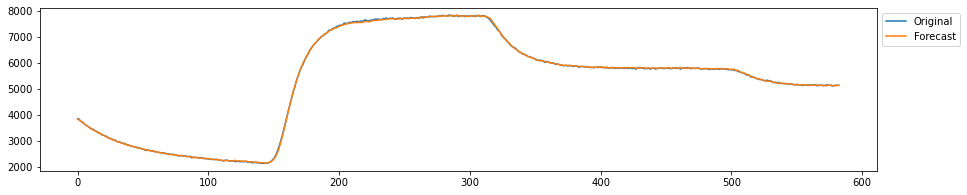

--------------------
training window 56088


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


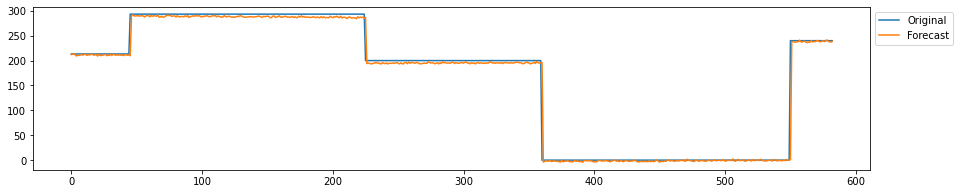

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


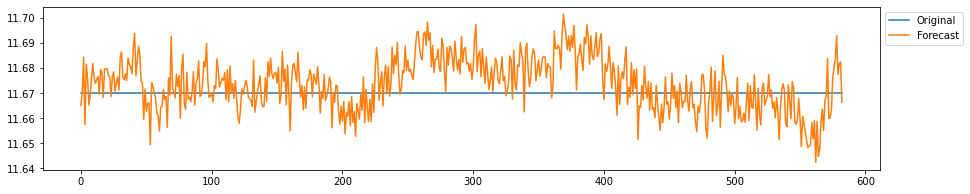

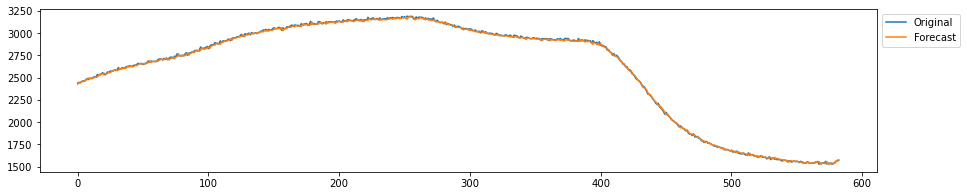

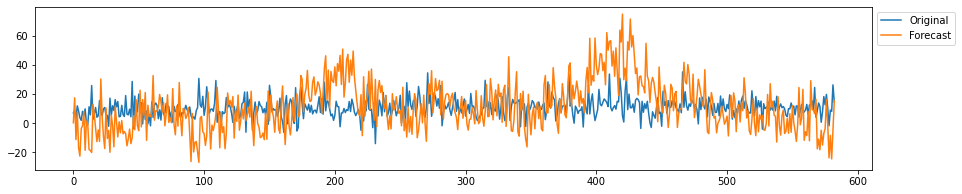

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


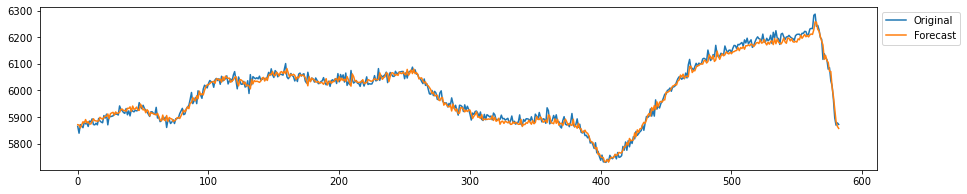

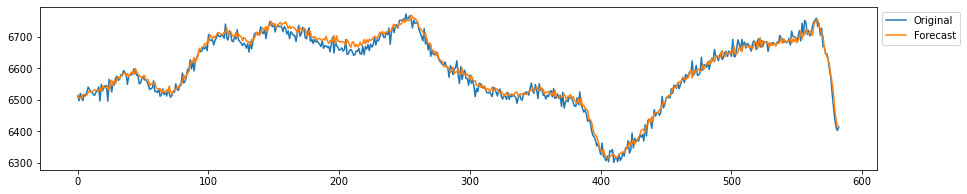

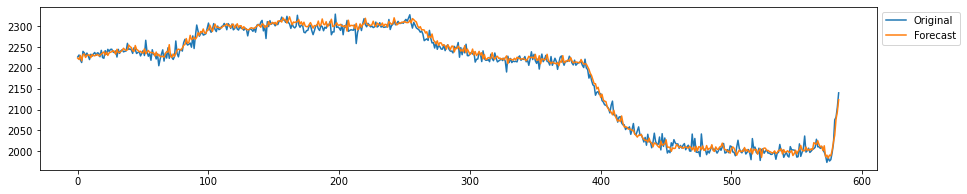

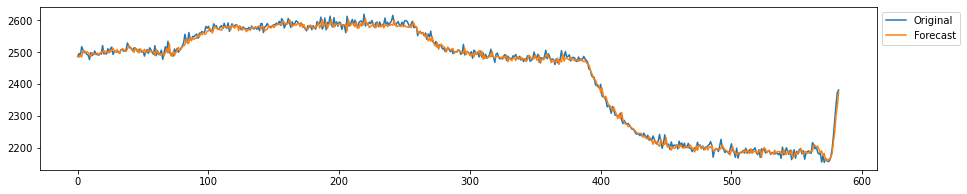

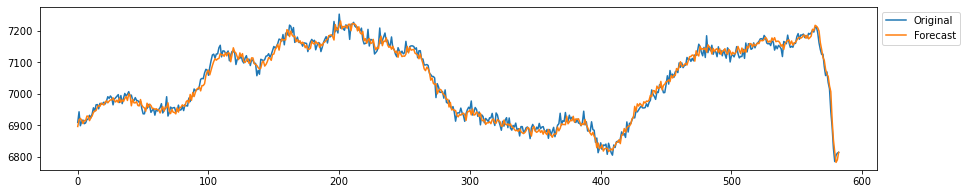

...

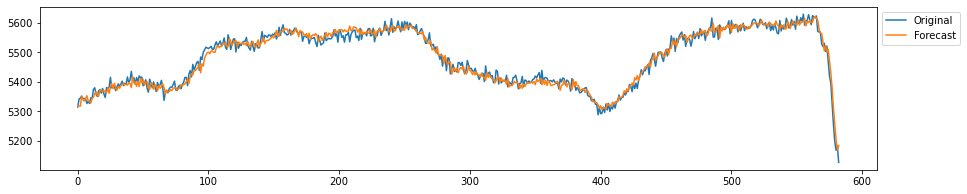

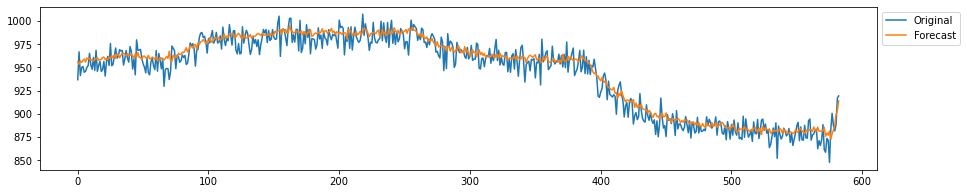

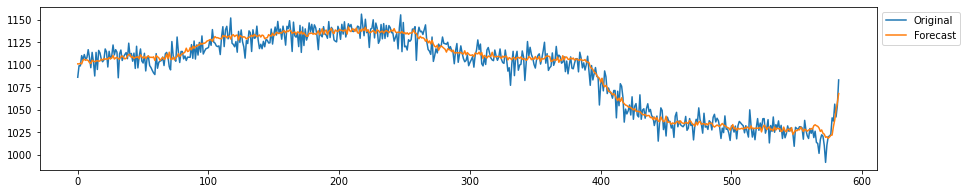

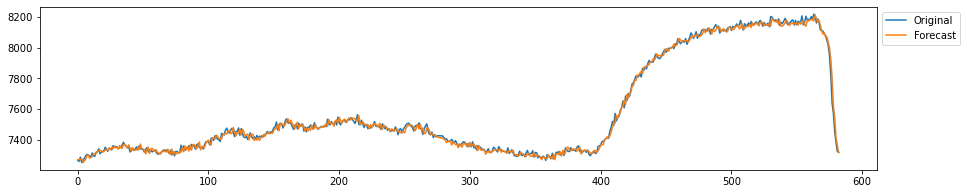

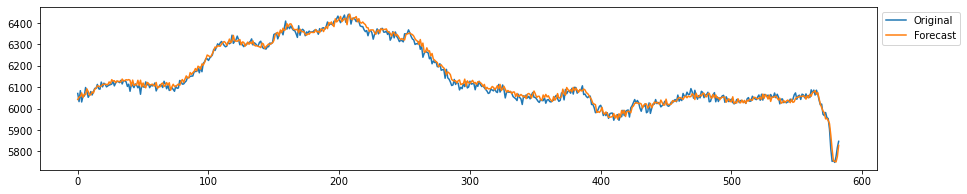

--------------------
training window 58425


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


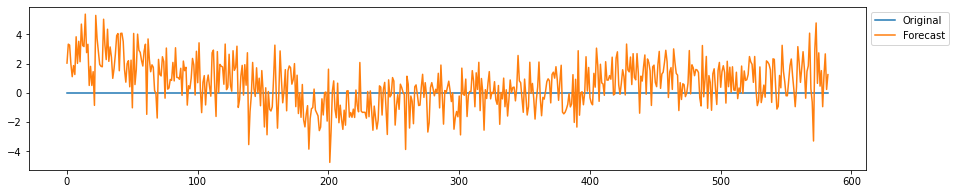

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


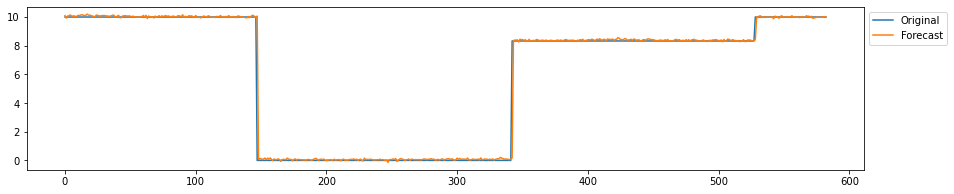

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


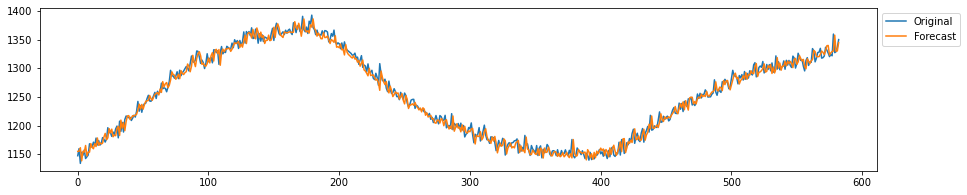

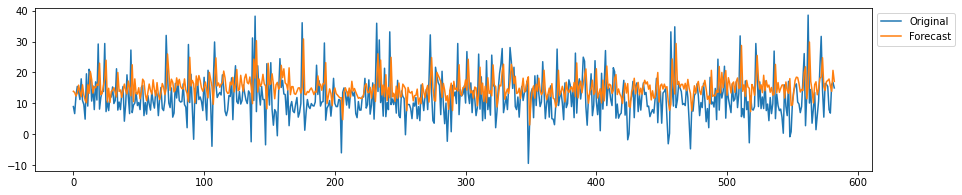

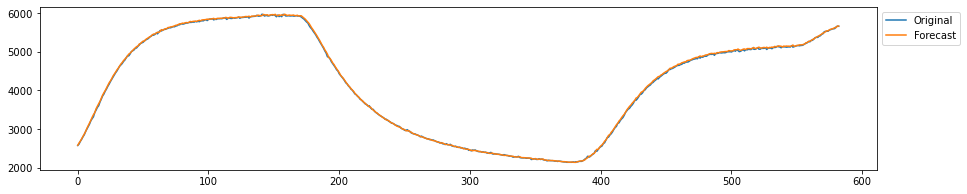

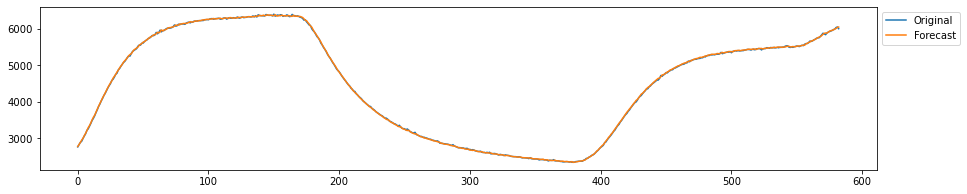

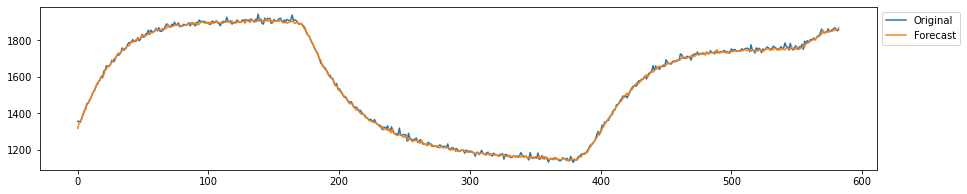

...

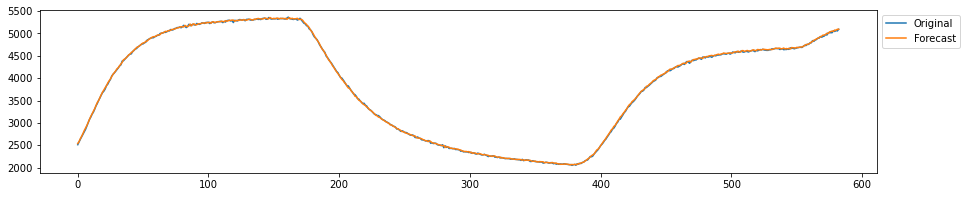

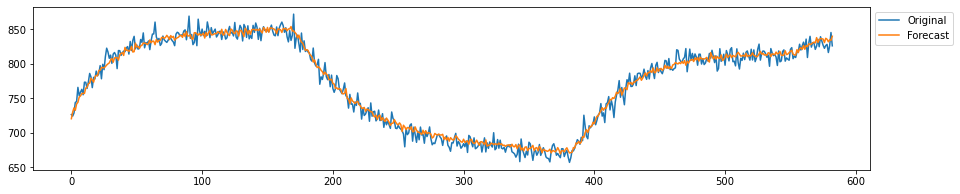

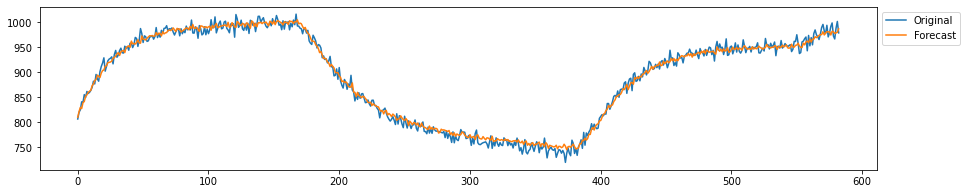

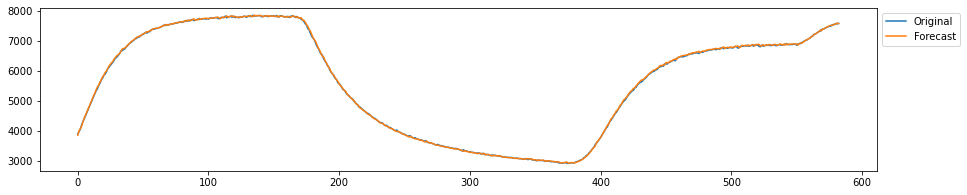

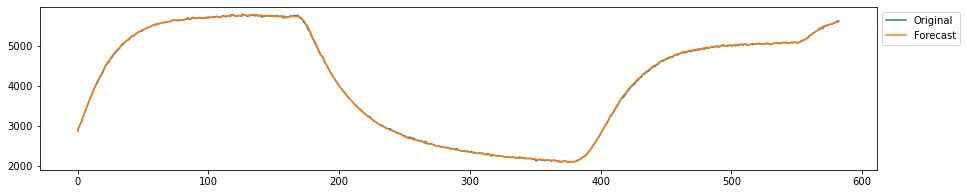

--------------------
training window 60762


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


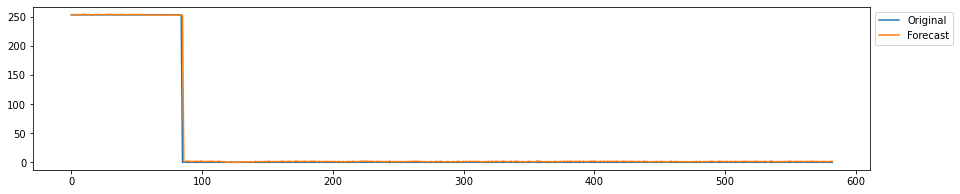

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


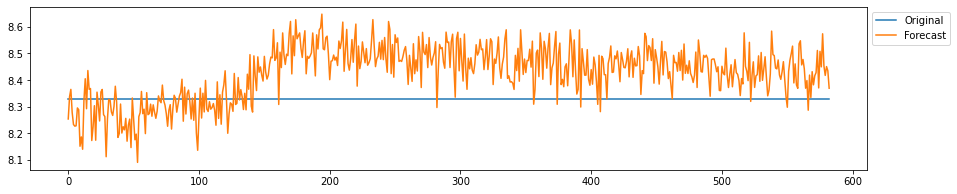

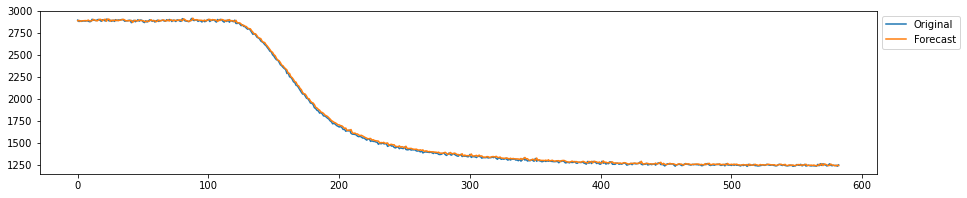

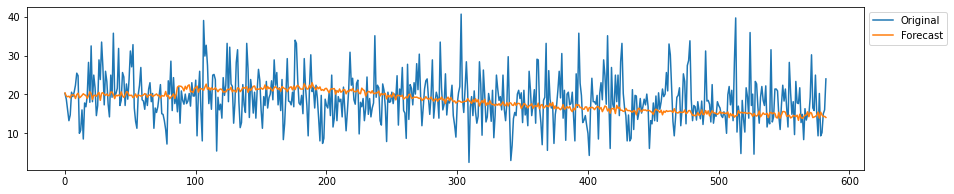

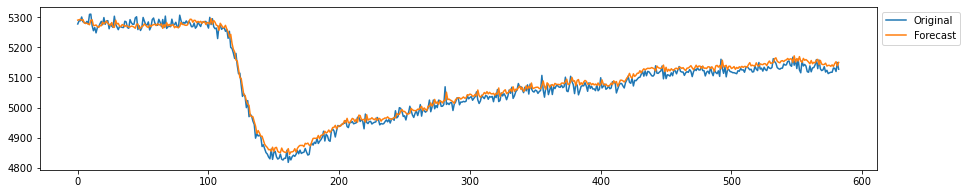

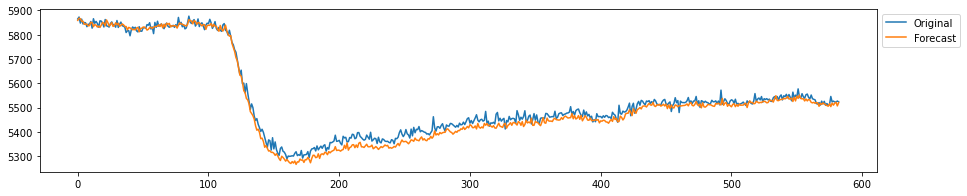

...

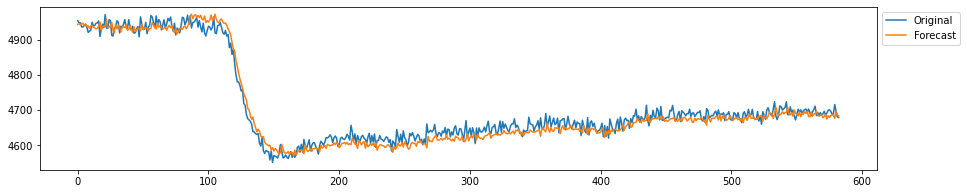

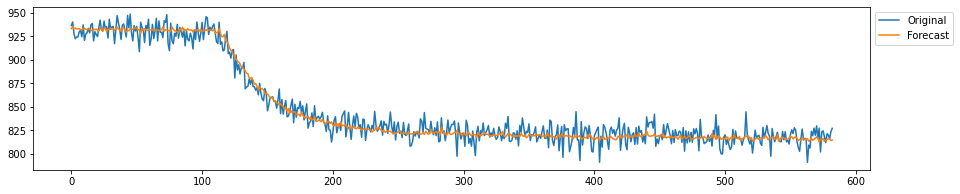

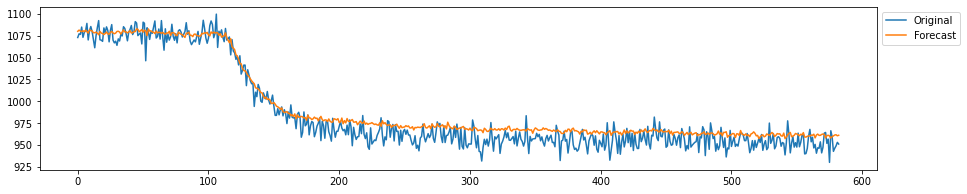

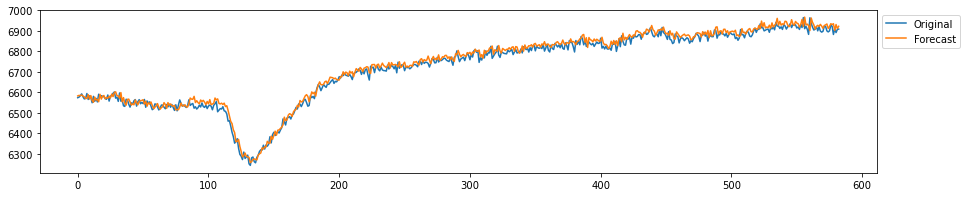

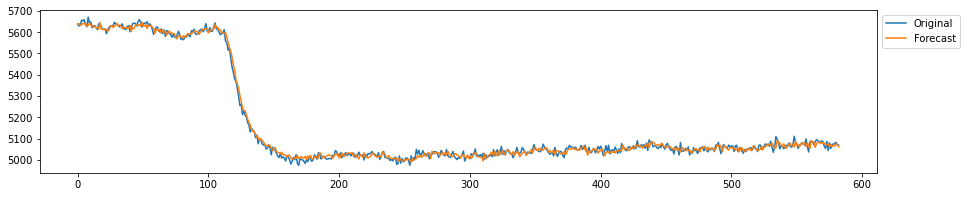

--------------------
training window 63099


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


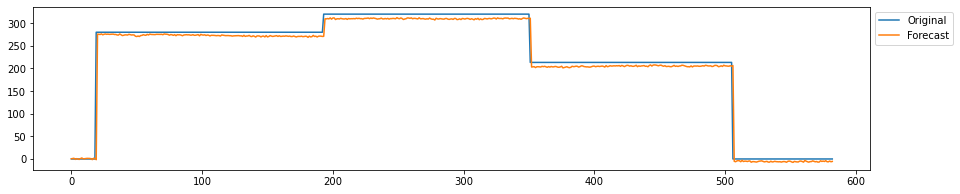

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


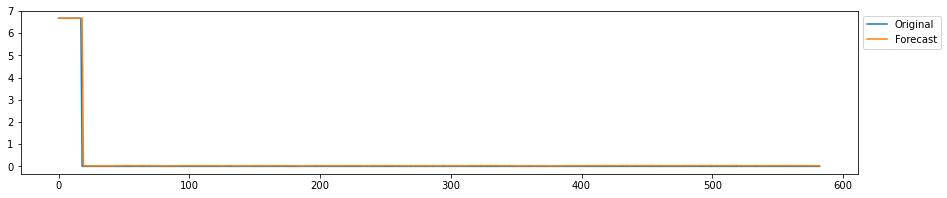

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


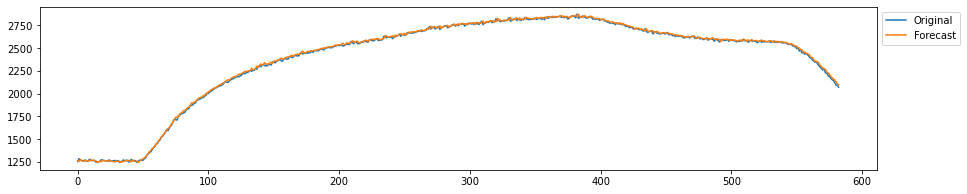

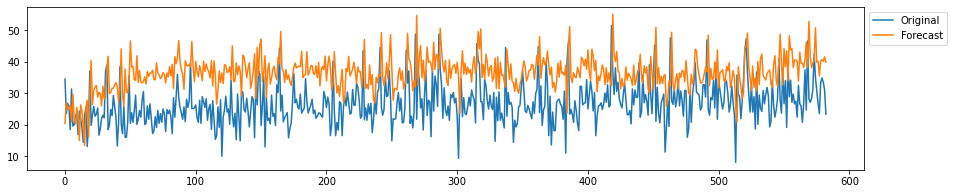

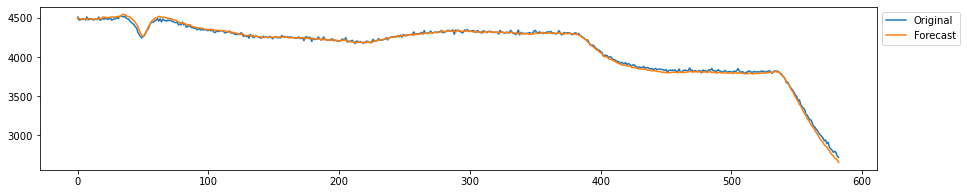

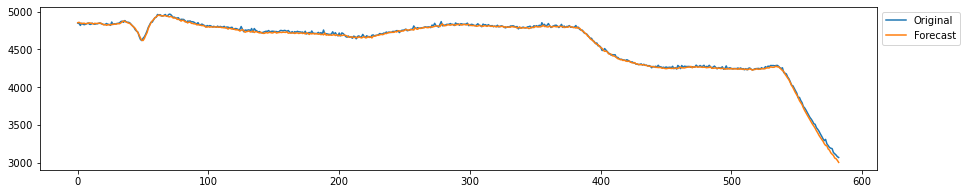

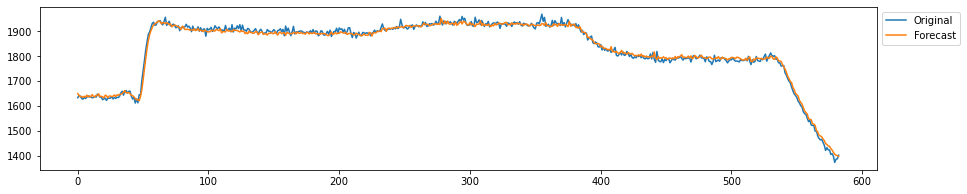

...

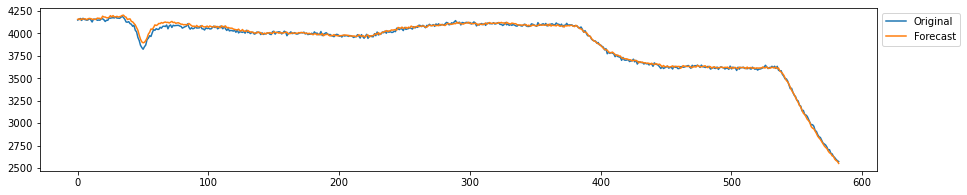

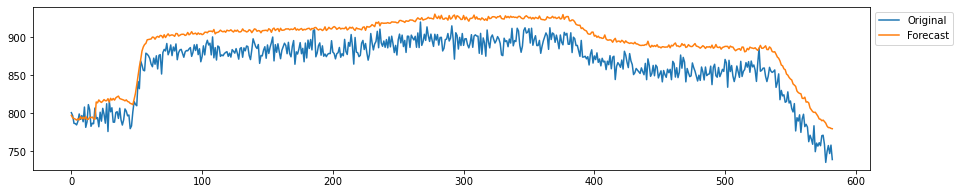

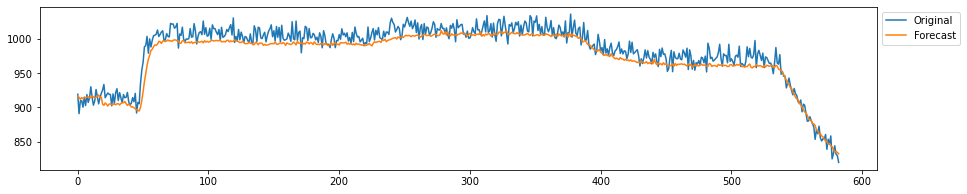

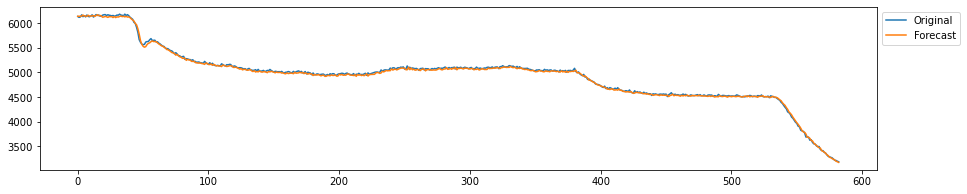

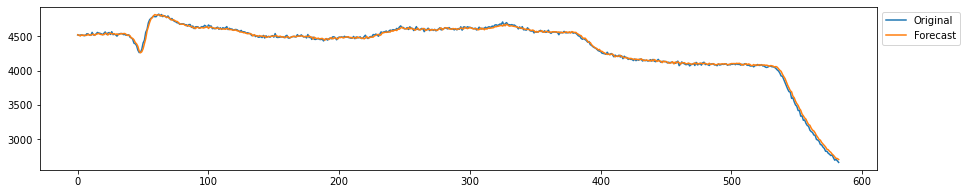

--------------------
training window 65436


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


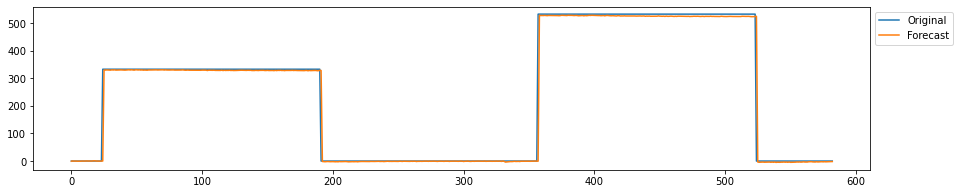

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


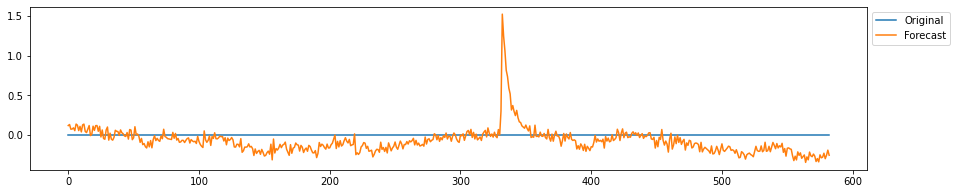

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


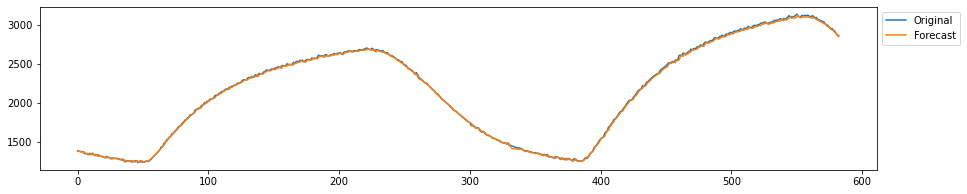

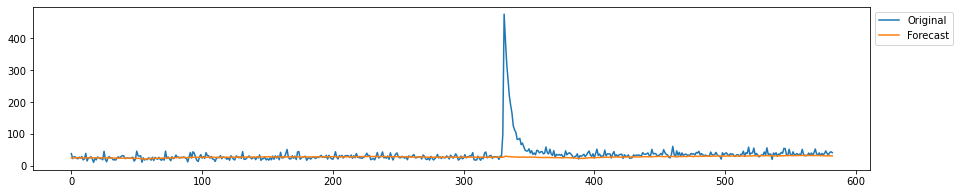

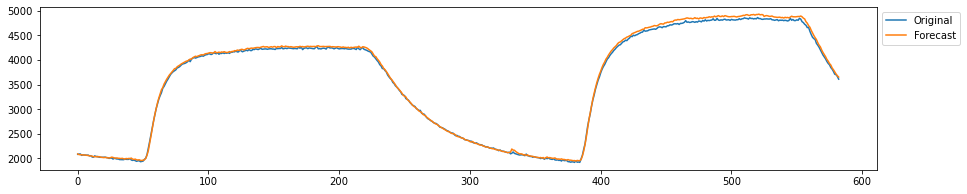

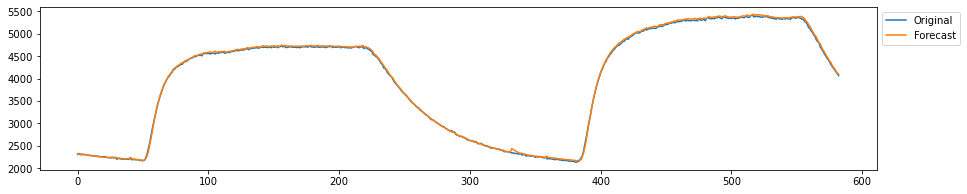

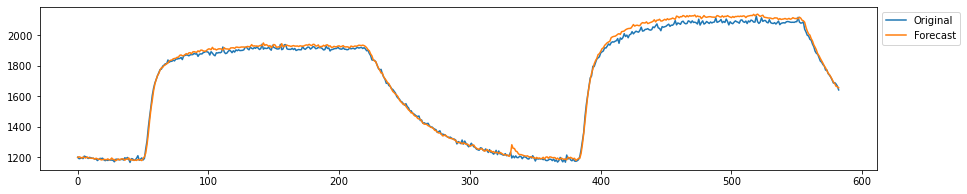

...

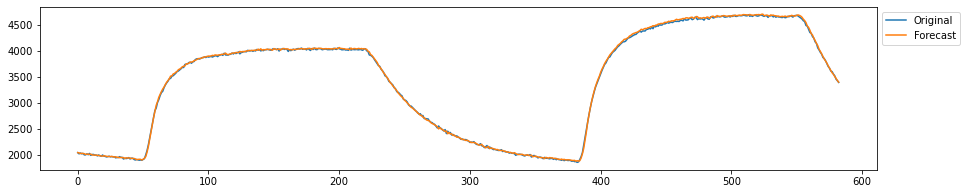

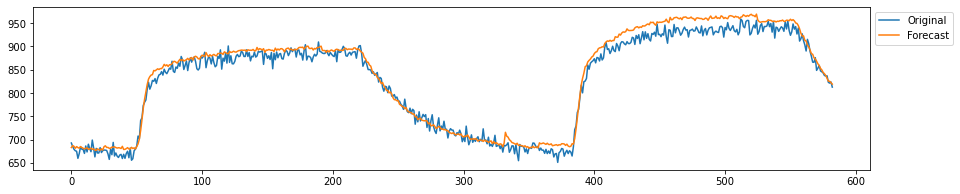

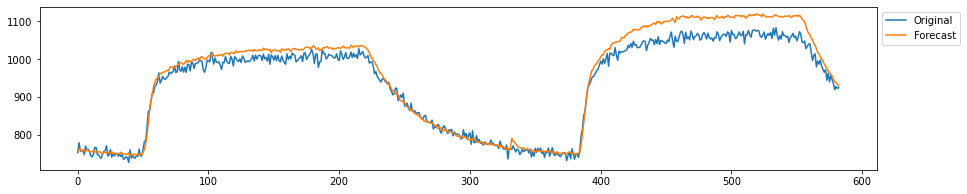

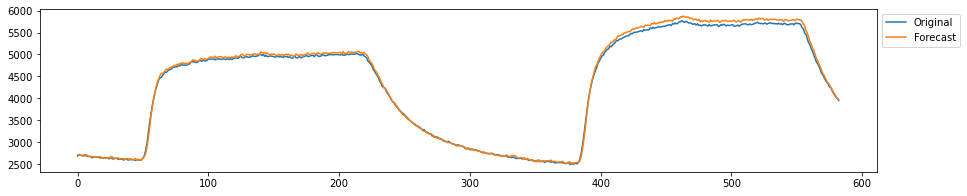

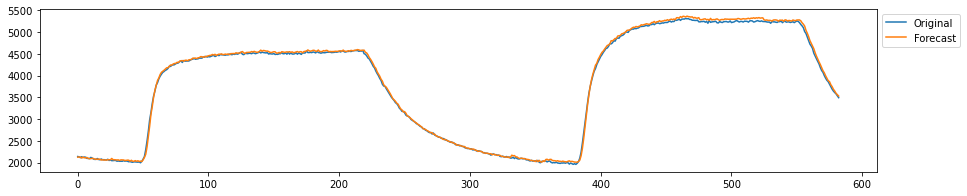

--------------------
training window 67773


<ipython-input-8-d392b9bc9e0f>:30: RuntimeWarning: invalid value encountered in sqrt
  Sigma = np.sqrt(np.cov(residuos, rowvar=False))


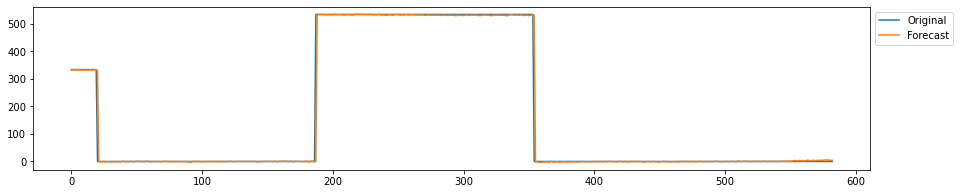

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


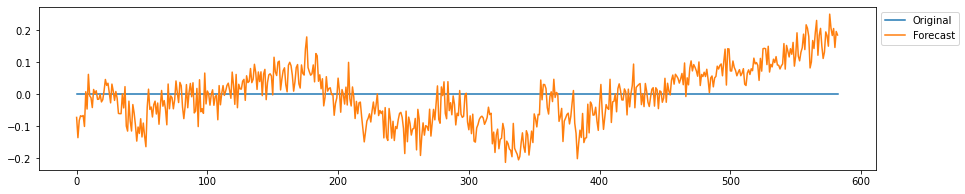

/home/hugo/anaconda3/lib/python3.8/site-packages/pyFTS/benchmarks/Measures.py:83: RuntimeWarning: divide by zero encountered in true_divide
  return np.nanmean(np.abs(np.divide(np.subtract(targets, forecasts), targets))) * 100


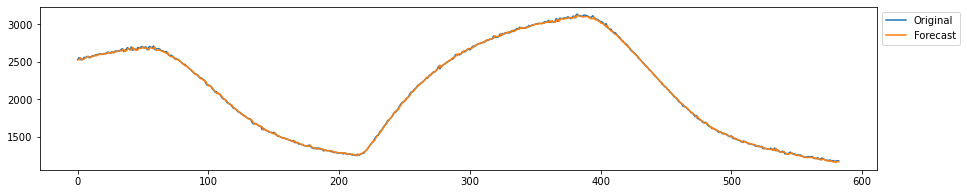

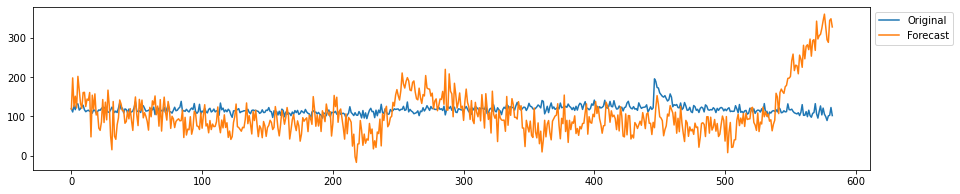

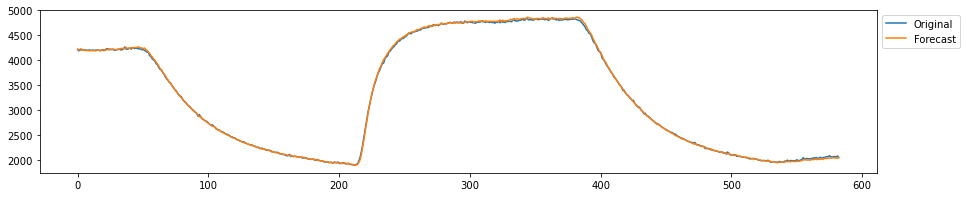

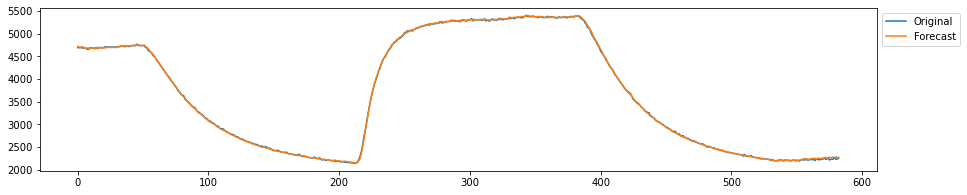

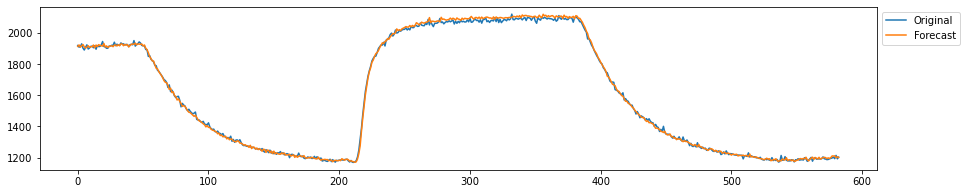

...

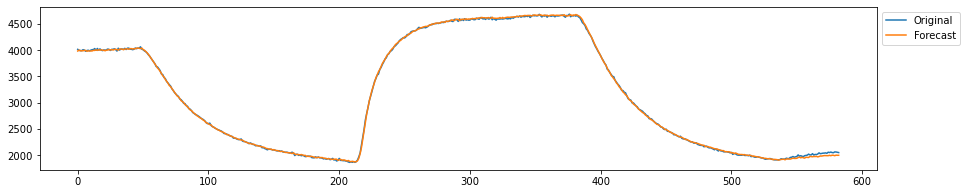

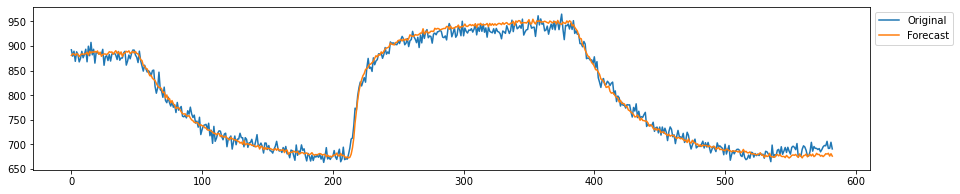

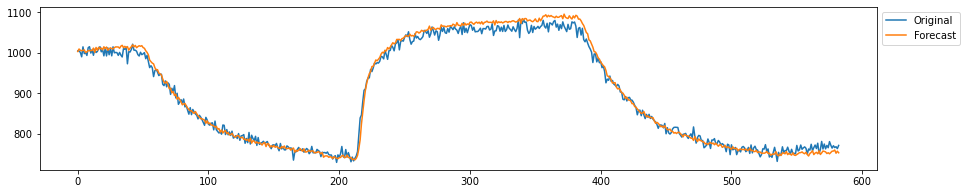

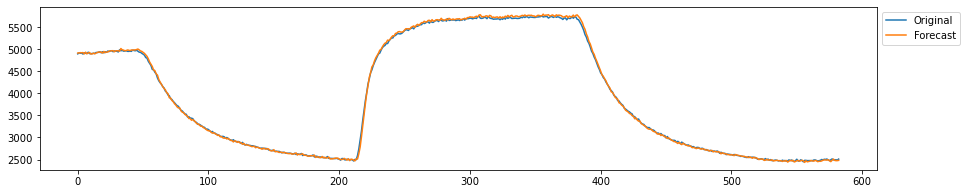

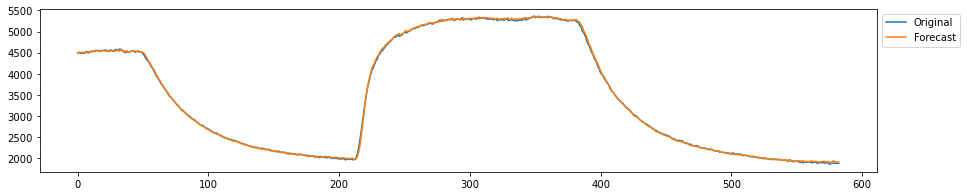

In [10]:
p = 1
var_result =  sliding_window(data=data,n_windows=30,train_size=0.75,p=p)

In [13]:
columns = list(ytest.columns)

final_result = {
    "variable": [],
    "rmse": [],
    "mae": [],
    "mape": [],
    "r2": []
}

measures = var_result
var = measures.groupby("variable")

for col in columns:
    
    var_agr = var.get_group(col)
           
    rmse = round(statistics.mean(var_agr.loc[:,'rmse']),3)
    mape = round(statistics.mean(var_agr.loc[:,'mape']),3)
    mae = round(statistics.mean(var_agr.loc[:,'mae']),3)
    r2 = round(statistics.mean(var_agr.loc[:,'r2']),3)

    final_result["variable"].append(col)
    final_result["rmse"].append(rmse)
    final_result["mape"].append(mape)
    final_result["mae"].append(mae)
    final_result["r2"].append(r2)
        
    #print(f'Results: {(col,rmse,mae,r2)}')
        
        
final_measures = round(pd.DataFrame(final_result),3) 



In [14]:
final_measures

,variable,rmse,mae,mape,r2
0,CO conc (ppm)(t),18.628,7.059,NaN,-6.835720e+25
1,Ethylene conc (ppm)(t),0.613,0.272,NaN,5.600000e-01
2,TGS2602(t),16.952,12.336,0.637,9.940000e-01
3,TGS2602.1(t),76.158,39.089,inf,-1.641300e+01
4,TGS2600(t),30.973,23.551,0.539,9.950000e-01
5,TGS2600.1(t),23.245,17.902,0.412,9.960000e-01
6,TGS2610(t),16.747,12.809,0.685,9.900000e-01
7,TGS2610.1(t),16.942,12.692,0.587,9.900000e-01
8,TGS2620(t),33.295,24.988,0.548,9.950000e-01
9,TGS2620.1(t),42.316,32.249,0.654,9.940000e-01
